In [1]:
import yfinance as yf
import matplotlib.pyplot as plt
from scipy.stats import chi2_contingency
import seaborn as sns
import pandas as pd
import requests
import os
import re
import time
import numpy as np
import holidays
from datetime import datetime, timedelta
from scipy.stats import skew, kurtosis
from scipy.optimize import brentq
import scipy.stats as si
from scipy.stats import norm
import matplotlib.patches as patches
import ast
from polygon import RESTClient
from polygon.rest.models.request import RequestOptionBuilder
import warnings
pd.set_option('display.max_columns', None)
warnings.filterwarnings("ignore")
from requests.exceptions import HTTPError
import matplotlib.ticker as ticker
import matplotlib.pyplot as plt
from datetime import datetime
import matplotlib.patches as patches
API_KEY = "HsOX1rl8t3B1AJfl4O2uqscUp372l7EF"
us_holidays = holidays.US(years=2024)
fila = 80 # Determina el ancho de la caja en la que buscaremos el máx y el mín.
dst_start = pd.to_datetime('2024-03-10')
dst_end = pd.to_datetime('2024-11-03')

In [2]:
start_date = datetime(2024, 1, 1)
end_date = datetime(2024, 8, 8)

national_holidays = [
    datetime(2024, 1, 1),   # New Year's Day
    datetime(2024, 1, 15),  # Martin Luther King Jr. Day
    datetime(2024, 2, 19),  # Presidents' Day
    datetime(2024, 5, 27),  # Memorial Day
    datetime(2024, 6, 19),  # Juneteenth National Independence Day
    datetime(2024, 7, 4),   # Independence Day
    datetime(2024, 9, 2),   # Labor Day
    datetime(2024, 10, 14), # Columbus Day
    datetime(2024, 11, 11), # Veterans Day
    datetime(2024, 11, 28), # Thanksgiving Day
    datetime(2024, 12, 25)  # Christmas Day
]
working_days = []
current_date = start_date

while current_date <= end_date:
    if current_date.weekday() < 5 and current_date not in national_holidays:
        working_days.append(current_date.strftime('%Y-%m-%d'))
    current_date += timedelta(days=1)
#working_days

In [3]:
def get_time_based_on_dst(fecha):
    if dst_start <= fecha <= dst_end:
        return pd.to_datetime('13:30:00').time()
    else:
        return pd.to_datetime('14:30:00').time()

def next_working_day(date):
    date_obj = datetime.strptime(date, '%Y-%m-%d')
    next_day = date_obj + timedelta(days=1)
    while next_day.weekday() in (5, 6) or next_day in us_holidays:
        next_day += timedelta(days=1)
    return next_day.strftime('%Y-%m-%d')

def get_stock_price(date, expiration_day):
    url = f"https://api.polygon.io/v2/aggs/ticker/SPY/range/1/minute/{date}/{expiration_day}?adjusted=true&sort=asc&apiKey={API_KEY}"
    #print(url)  # For debugging purposes
    print(f"Trading Date:    {date}")
    print(f"Expiration Date: {expiration_day}")
    response = requests.get(url)

    if response.status_code == 200:
        try:
            data = response.json()
            if 'results' in data:
                return [(result['t'], result['c']) for result in data['results']]
            else:
                raise ValueError("Response JSON does not contain 'results' key")
        except ValueError as e:
            print(f"Error parsing JSON: {e}")
    else:
        print(f"Request failed with status code {response.status_code}")
    return []

def get_stock_data_for_date(date):
    expiration_day = next_working_day(date)
    option_data = get_stock_price(date, expiration_day)
    df = pd.DataFrame(option_data, columns=['timestamp', 'stock_price'])
    df['fecha'] = pd.to_datetime(df['timestamp'], unit='ms')
    
    df['time_filter'] = df['fecha'].apply(get_time_based_on_dst)
    df = df[df['fecha'].dt.time >= df['time_filter']]
    df.drop(columns=['time_filter'])
    df['stock_price'] = round(df['stock_price'],2)
    df = df.reset_index(drop=True)
    return df

In [4]:
def check_stock_price_break(df, fila, ib_max, ib_min):
    for i in range(fila + 1, len(df)):
        stock_price_value = df['stock_price'].iloc[i]

        if stock_price_value > ib_max:
            option_type = 'P'
            print(f"El SPY rompe el Máximo del IB en la fila {i} con el valor {stock_price_value}")
            print(f'Tenedencia Alcista-> Vender {option_type}')
            strike_entry = int(stock_price_value) - 3
            print(f'Vendemos el Stike {strike_entry}')
            return i,strike_entry,option_type

        elif stock_price_value < ib_min:
            option_type = 'C'
            print(f"El SPY rompe el Mínimo del IB en la fila {i} con el valor {stock_price_value}")
            strike_entry = int(stock_price_value) + 3
            print(f'Vendemos el Stike {strike_entry}')
            return i,strike_entry,option_type   
    return None

In [5]:
def generate_ticker(df, fila, expiration_day,ib_min, ib_max):
    try:
        # Step 1: Format the expiration date
        expiration_day = expiration_day[2:].replace("-", "")

        # Step 2: Calculate the stock price values
        stock_price_value_ini = ib_min
        stock_price_value = ib_max  
       
        row, strike_entry, option_type = check_stock_price_break(df, fila, ib_max, ib_min)

        # Step 4: Format the strike value
        strike_formatted = f"{strike_entry:05d}" + "000"  # Ensures strike is 8 digits with leading zeros, and appends "0000"

        # Step 5: Construct the final code
        option_code = f"O:SPY{expiration_day}{option_type}{strike_formatted}"
        print(option_code, '-', option_type, strike_entry)
        return option_code, option_type, strike_entry, row

    except Exception as e:
        print(f"An error occurred: {e}. Skipping this iteration.")
        return None, None, None  # Return a tuple of None values in case of an error

In [6]:
def get_option_price(ticker, date, expiration_day, option_type):
    url = f"https://api.polygon.io/v2/aggs/ticker/{ticker}/range/1/minute/{date}/{expiration_day}?adjusted=true&sort=asc&apiKey={API_KEY}"
    #print(url)
    response = requests.get(url)
    if response.status_code == 200:
        try:
            data = response.json()
            # Ensure 'results' key is present in the JSON response
            if 'results' in data:
                results = data['results']
                df_option = pd.DataFrame(results)
                
                # Check what columns are in df_option
                print(df_option.columns)
                
                # Rename columns if they exist
                if all(col in df_option.columns for col in ['o', 'c', 'l', 'h']):
                    df_option = df_option.rename(columns={
                        't': 'timestamp',
                        'o': 'open',
                        'c': 'close',
                        'l': 'low',
                        'h': 'high'
                    })
                    df_option['option_code'] = ticker
                    df_option['option_type'] = option_type                
                    return df_option[['timestamp', 'option_code', 'option_type', 'close']]
                else:
                    print("Expected columns are not present in the returned data.")
        except ValueError as e:
            print(f"Error parsing JSON: {e}")
    else:
        print(f"Request failed with status code {response.status_code}")
    return None

In [7]:
def entradas_y_salidas_del_mercado(df, row, option_type):
    df['fecha'] = pd.to_datetime(df['timestamp'], unit='ms').dt.strftime('%Y-%m-%d %H:%M:%S')
    fecha = df['fecha'].iloc[0]
    
    # Calculate required values
    stock_price = round(df.iloc[fila]['stock_price'], 2)
    price_entry = round(df_option.iloc[fila]['close'], 2)
    middle_index = len(df_option) // 2
    price_overnight = round(df_option.iloc[middle_index-30]['close'], 2)
    end_index = len(df_option) - 5
    price_end = round(df_option.iloc[end_index]['close'], 2)
    profit_overnight = abs(price_overnight - price_entry)
    profit_end = price_entry-price_end
    
    if profit_end > 0:
        df_option['win_lose'] = 'win'
        win_lose = 'win'
    else:
        df_option['win_lose'] = 'lose'
        win_lose = 'lose' 
        
    df_option['cum_return'] = 0
    df_option.loc[row:, 'cum_return'] = price_entry - df_option.loc[fila:, 'close']
        
    mae = df_option['cum_return'].max()
    mae_perc = round(mae/price_entry*100,0)
    return_ = round(profit_end/price_entry*100,0)

    # Create a dictionary with the summary data
    summary_data = {
        'fecha': fecha,
        'option': option_code,
        'type': option_type,
        'strike':strike_entry,
        'stock_entry': stock_price,
        'price_entry': price_entry,
        'price_overn': price_overnight,
        'price_end': price_end,
        'profit_overn': profit_overnight,
        'profit_end': profit_end,
        'return_%': return_,
        'win_lose': win_lose,
        'mae': mae,
        'mae_%': mae_perc
    }
    return summary_data

In [8]:
def plot_option_chart(df_option, fila, strike_entry, option_type, option_code, ib_min, ib_max, row):
    ovenight_index = int(len(df_option) / 2) - 40
    end_index = len(df_option) - 2
    rectangle = row -10
    df_option['fecha'] = df_option['fecha'].astype(str)
    fig, (ax1, ax3) = plt.subplots(nrows=2, ncols=1, figsize=(12, 9), gridspec_kw={'height_ratios': [3, 1], 'hspace': 0.04})
    ax2 = ax1.twinx()
    ax1.plot(df_option['fecha'], df_option['close'], color='green', label='Option', linewidth=2.0)
    ax2.plot(df_option['fecha'], df_option['stock_price'], color='blue', alpha=1.0, linewidth=0.8)
    ax1.set_ylabel('Prima', color='green')
    ax2.set_ylabel('Stock Price', color='blue')
    ax1.tick_params(axis='y', labelcolor='green')
    ax2.tick_params(axis='y', labelcolor='blue')
    ax1.yaxis.grid(True, alpha=0.6)
    ax1.xaxis.grid(False)
    ax1.tick_params(axis='x', which='both', length=0, labelbottom=False)
    ax1.axvline(x=fila, color='grey', alpha=0.56, linestyle='-', linewidth=0.7)
    ax1.axvline(x=ovenight_index, color='grey', alpha=0.5, linestyle='-', linewidth=0.7)
    ax2.axhline(y=strike_entry, color='blue', alpha=0.5, linestyle='--')
    ax1.plot(df_option['fecha'][row], df_option['close'][row], 'ko', markersize=9)
    ax1.plot(df_option['fecha'][ovenight_index], df_option['close'][ovenight_index], 'ro', markersize=9)
    ax1.plot(df_option['fecha'][end_index], df_option['close'][end_index], 'ro', markersize=9)
    ax1.set_title(f'{option_code} - {option_type} {strike_entry}')
    ax3.fill_between(df_option['fecha'], df_option['cum_return'], where=(df_option['cum_return'] >= 0),
                     color='green', alpha=0.5, label='Beneficio')
    ax3.fill_between(df_option['fecha'], df_option['cum_return'], where=(df_option['cum_return'] < 0),
                     color='red', alpha=0.5, label='Pérdida')
    ax3.set_ylabel('Beneficio Acumulado')
    ax3.tick_params(axis='y')
    ax3.xaxis.set_major_locator(plt.MaxNLocator(10))
    for tick in ax3.get_xticklabels():
        tick.set_rotation(45)
        tick.set_horizontalalignment('right')
    ax3.yaxis.grid(True, alpha=0.6)
    ax3.xaxis.grid(False)
    ax3.legend(loc='upper left')
    
    width = df_option.index[rectangle] - df_option.index[0]
    rect = patches.Rectangle(
        (df_option.index[0], ib_min),
        width=width,
        height=(ib_max - ib_min),
        linewidth=2,
        edgecolor='orange',
        facecolor='orange',
        alpha=0.3
)
    ax2.add_patch(rect)
    
    output_dir = 'chart_output'
    timestamp = datetime.now().strftime('%Y%m%d_%H%M%S')
    filename = f'sell_the_swan_{timestamp}.png'
    output_path = os.path.join(output_dir, filename)
    plt.savefig(output_path)
    plt.show()

In [9]:
def find_min_max_stock_price(df):
    # Seleccionamos las filas 
    subset = df.iloc[0:fila]
    ib_min = subset['stock_price'].min()
    ib_max = subset['stock_price'].max()
    return ib_min, ib_max

In [10]:
 '''
dates = [
 '2024-01-03',
 '2024-01-22',
 '2024-08-07'    
]

'''
dates = ['2024-01-02',
 '2024-01-03',
 '2024-01-04',
 '2024-01-05',
 '2024-01-08',
 '2024-01-09',
 '2024-01-10',
 '2024-01-11',
 '2024-01-12',
 '2024-01-16',
 '2024-01-17',
 '2024-01-18',
 '2024-01-19',
 '2024-01-22',
 '2024-01-23',
 '2024-01-24',
 '2024-01-25',
 '2024-01-26',
 '2024-01-29',
 '2024-01-30',
 '2024-01-31',
 '2024-02-01',
 '2024-02-02',
 '2024-02-05',
 '2024-02-06',
 '2024-02-07',
 '2024-02-08',
 '2024-02-09',
 '2024-02-12',
 '2024-02-13',
 '2024-02-14',
 '2024-02-15',
 '2024-02-16',
 '2024-02-20',
 '2024-02-21',
 '2024-02-22',
 '2024-02-23',
 '2024-02-26',
 '2024-02-27',
 '2024-02-28',
 '2024-02-29',
 '2024-03-01',
 '2024-03-04',
 '2024-03-05',
 '2024-03-06',
 '2024-03-07',
 '2024-03-08',
 '2024-03-11',
 '2024-03-12',
 '2024-03-13',
 '2024-03-14',
 '2024-03-15',
 '2024-03-18',
 '2024-03-19',
 '2024-03-20',
 '2024-03-21',
 '2024-03-22',
 '2024-03-25',
 '2024-03-26',
 '2024-03-27',
 '2024-03-28',
 '2024-03-29',
 '2024-04-01',
 '2024-04-02',
 '2024-04-03',
 '2024-04-04',
 '2024-04-05',
 '2024-04-08',
 '2024-04-09',
 '2024-04-10',
 '2024-04-11',
 '2024-04-12',
 '2024-04-15',
 '2024-04-16',
 '2024-04-17',
 '2024-04-18',
 '2024-04-19',
 '2024-04-22',
 '2024-04-23',
 '2024-04-24',
 '2024-04-25',
 '2024-04-26',
 '2024-04-29',
 '2024-04-30',
 '2024-05-01',
 '2024-05-02',
 '2024-05-03',
 '2024-05-06',
 '2024-05-07',
 '2024-05-08',
 '2024-05-09',
 '2024-05-10',
 '2024-05-13',
 '2024-05-14',
 '2024-05-15',
 '2024-05-16',
 '2024-05-17',
 '2024-05-20',
 '2024-05-21',
 '2024-05-22',
 '2024-05-23',
 '2024-05-24',
 '2024-05-28',
 '2024-05-29',
 '2024-05-30',
 '2024-05-31',
 '2024-06-03',
 '2024-06-04',
 '2024-06-05',
 '2024-06-06',
 '2024-06-07',
 '2024-06-10',
 '2024-06-11',
 '2024-06-12',
 '2024-06-13',
 '2024-06-14',
 '2024-06-17',
 '2024-06-18',
 '2024-06-20',
 '2024-06-21',
 '2024-06-24',
 '2024-06-25',
 '2024-06-26',
 '2024-06-27',
 '2024-06-28',
 '2024-07-01',
 '2024-07-02',
 '2024-07-03',
 '2024-07-05',
 '2024-07-08',
 '2024-07-09',
 '2024-07-10',
 '2024-07-11',
 '2024-07-12',
 '2024-07-15',
 '2024-07-16',
 '2024-07-17',
 '2024-07-18',
 '2024-07-19',
 '2024-07-22',
 '2024-07-23',
 '2024-07-24',
 '2024-07-25',
 '2024-07-26',
 '2024-07-29',
 '2024-07-30',
 '2024-07-31',
 '2024-08-01',
 '2024-08-02',
 '2024-08-05',
 '2024-08-06',
 '2024-08-07',
 '2024-08-08']

Trading Date:    2024-01-02
Expiration Date: 2024-01-03
Valor mínimo IB:     471.35
Valor máximo IB:     472.78
El SPY rompe el Máximo del IB en la fila 135 con el valor 472.86
Tenedencia Alcista-> Vender P
Vendemos el Stike 469
O:SPY240103P00469000 - P 469
Entramos en la fila: 135
Index(['v', 'vw', 'o', 'c', 'h', 'l', 't', 'n'], dtype='object')


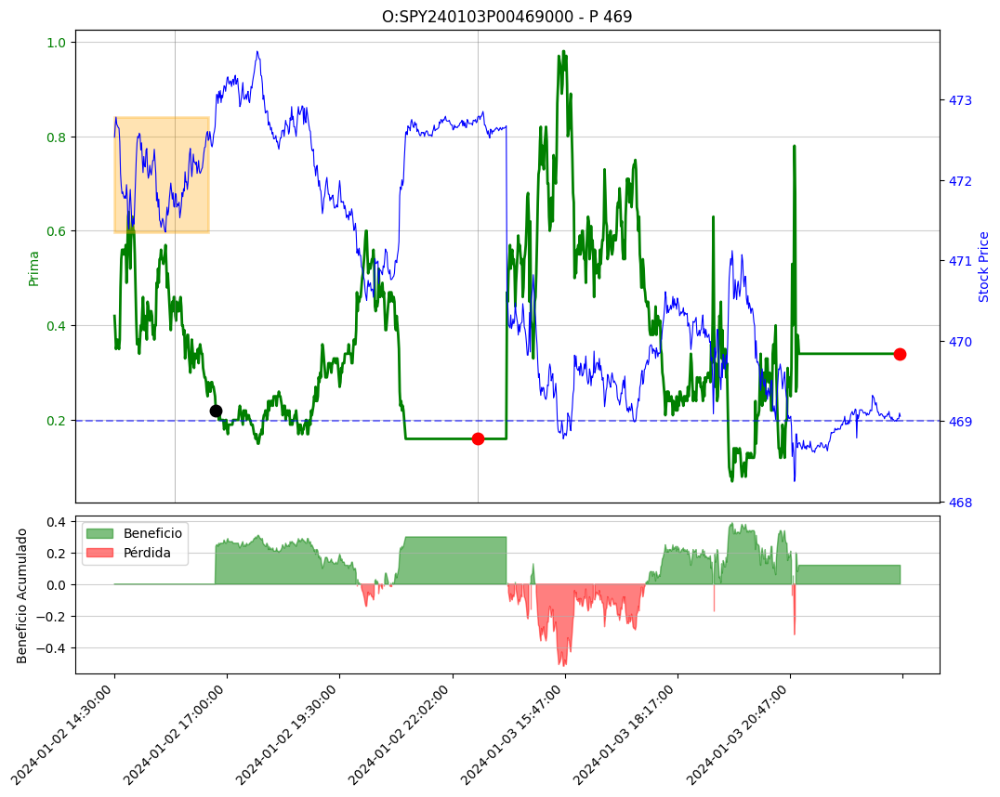

Trading Date:    2024-01-03
Expiration Date: 2024-01-04
Valor mínimo IB:     468.78
Valor máximo IB:     470.82
El SPY rompe el Máximo del IB en la fila 297 con el valor 470.91
Tenedencia Alcista-> Vender P
Vendemos el Stike 467
O:SPY240104P00467000 - P 467
Entramos en la fila: 297
Index(['v', 'vw', 'o', 'c', 'h', 'l', 't', 'n'], dtype='object')


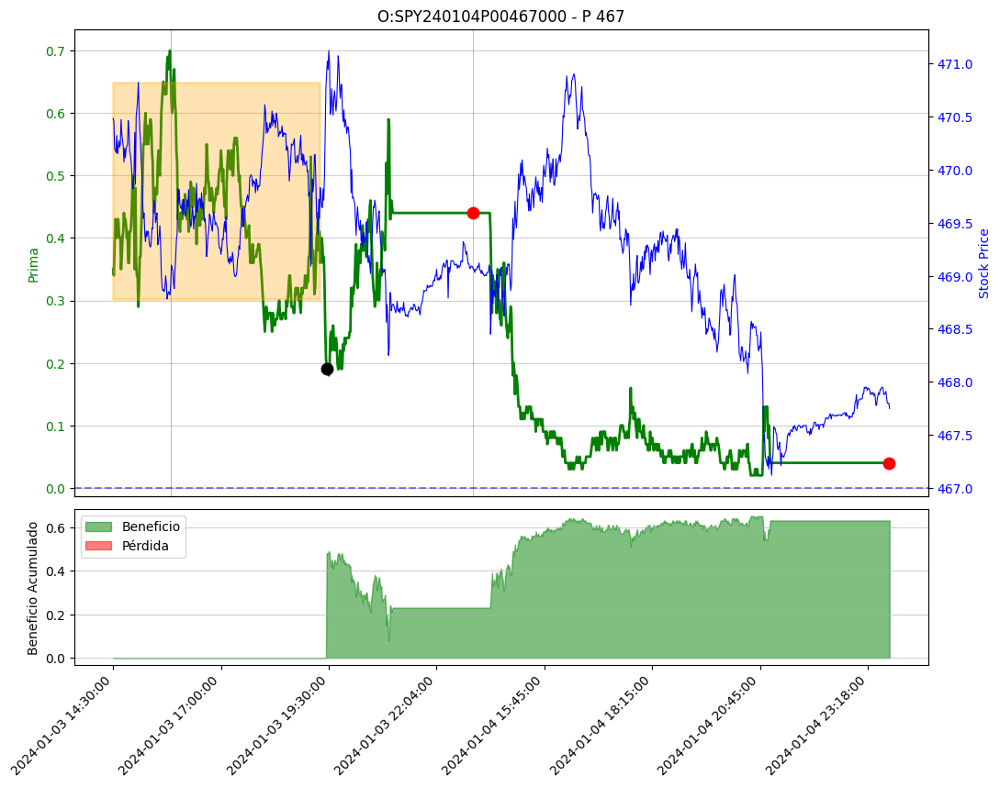

Trading Date:    2024-01-04
Expiration Date: 2024-01-05
Valor mínimo IB:     468.45
Valor máximo IB:     470.2
El SPY rompe el Máximo del IB en la fila 100 con el valor 470.35
Tenedencia Alcista-> Vender P
Vendemos el Stike 467
O:SPY240105P00467000 - P 467
Entramos en la fila: 100
Index(['v', 'vw', 'o', 'c', 'h', 'l', 't', 'n'], dtype='object')


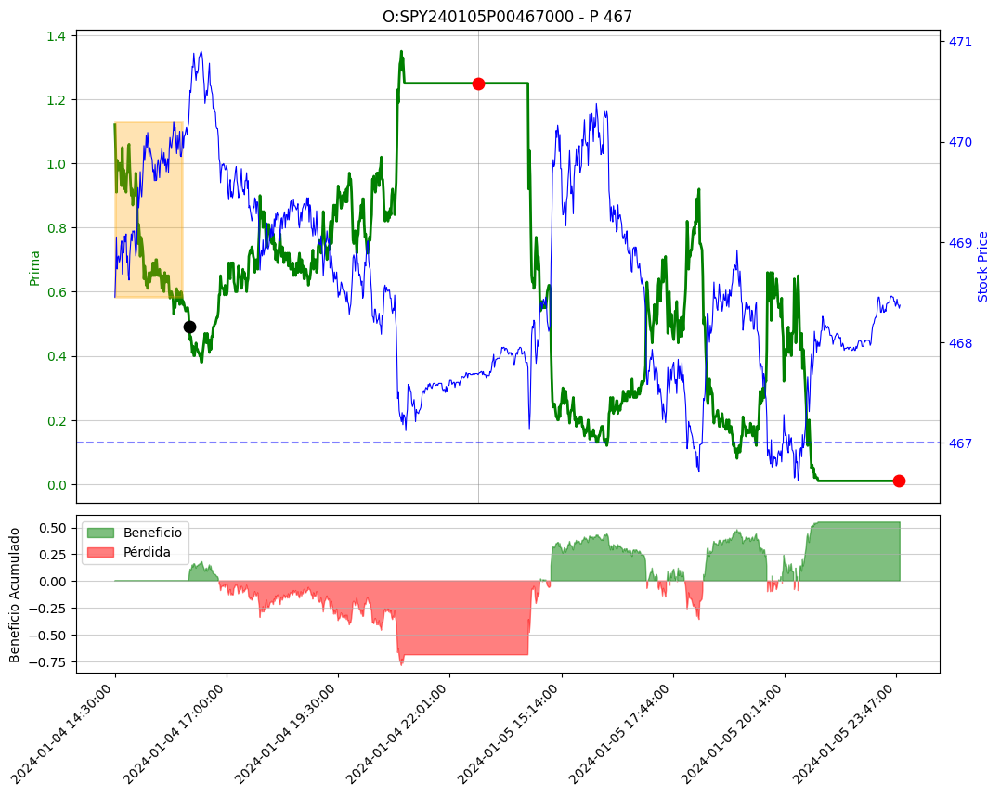

Trading Date:    2024-01-05
Expiration Date: 2024-01-08
Valor mínimo IB:     467.14
Valor máximo IB:     470.22
El SPY rompe el Máximo del IB en la fila 82 con el valor 470.27
Tenedencia Alcista-> Vender P
Vendemos el Stike 467
O:SPY240108P00467000 - P 467
Entramos en la fila: 82
Index(['v', 'vw', 'o', 'c', 'h', 'l', 't', 'n'], dtype='object')


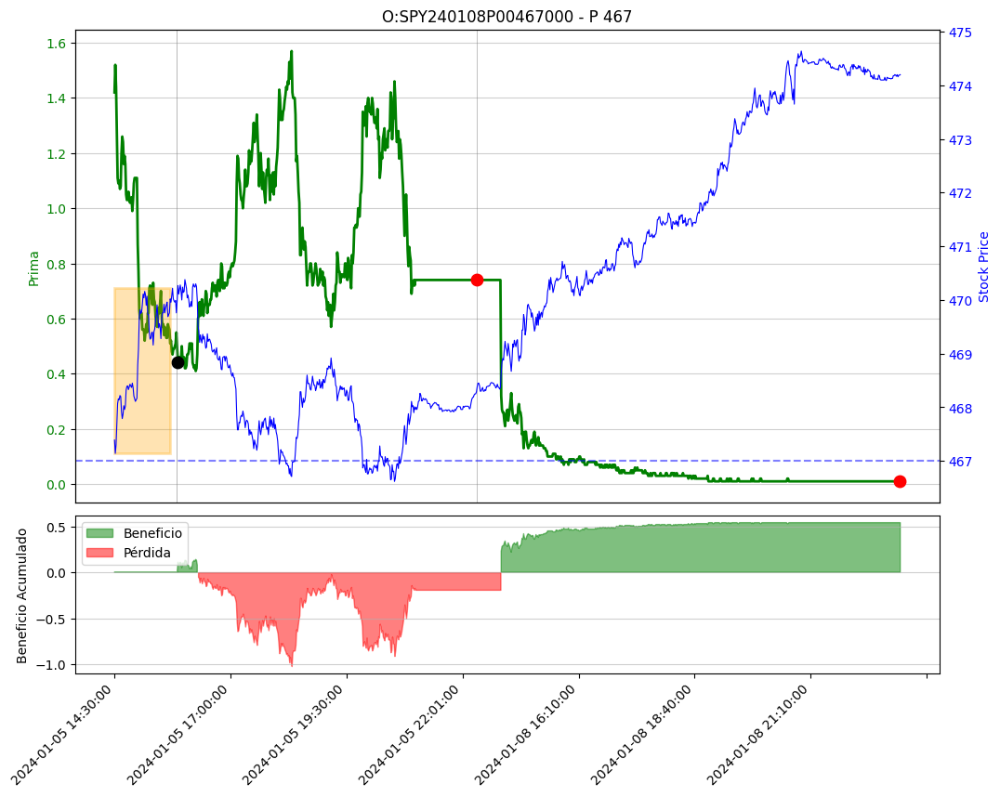

Trading Date:    2024-01-08
Expiration Date: 2024-01-09
Valor mínimo IB:     468.66
Valor máximo IB:     470.72
El SPY rompe el Máximo del IB en la fila 135 con el valor 470.74
Tenedencia Alcista-> Vender P
Vendemos el Stike 467
O:SPY240109P00467000 - P 467
Entramos en la fila: 135
Index(['v', 'vw', 'o', 'c', 'h', 'l', 't', 'n'], dtype='object')


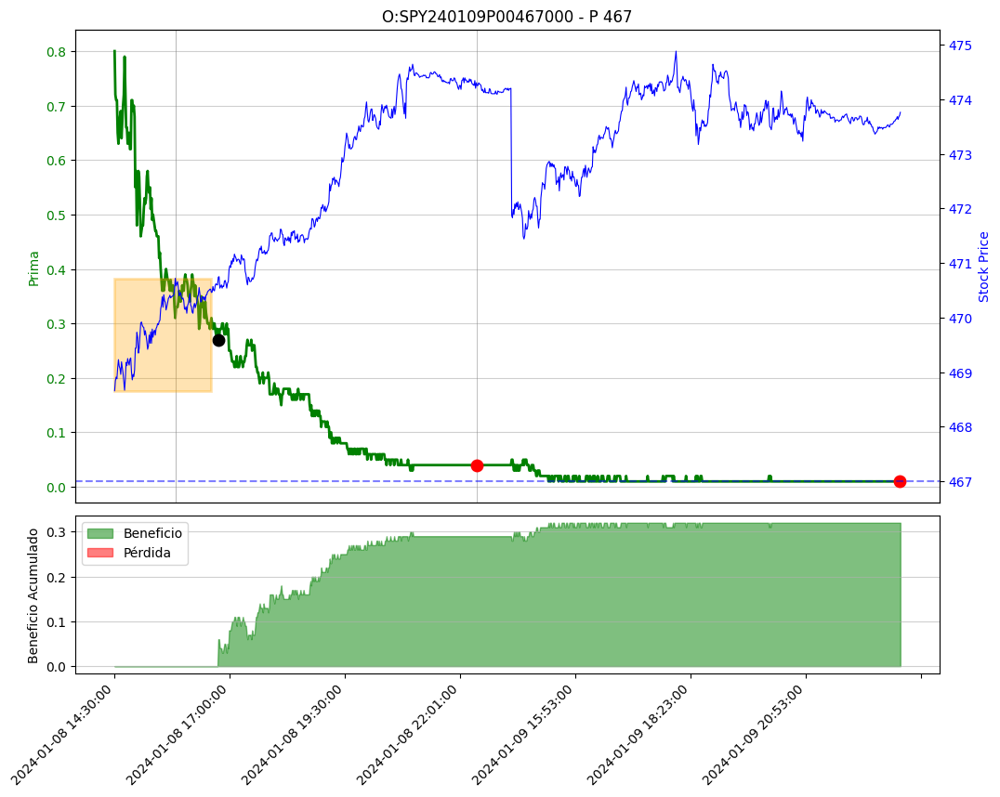

Trading Date:    2024-01-09
Expiration Date: 2024-01-10
Valor mínimo IB:     471.44
Valor máximo IB:     472.86
El SPY rompe el Máximo del IB en la fila 106 con el valor 473.13
Tenedencia Alcista-> Vender P
Vendemos el Stike 470
O:SPY240110P00470000 - P 470
Entramos en la fila: 106
Index(['v', 'vw', 'o', 'c', 'h', 'l', 't', 'n'], dtype='object')


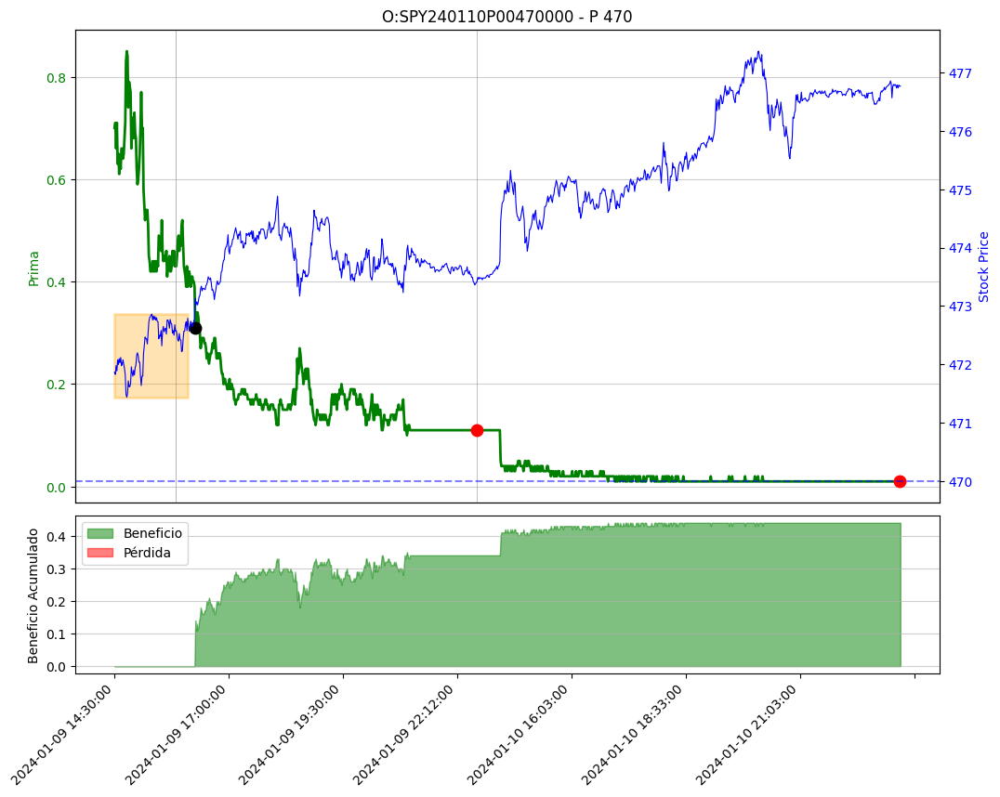

Trading Date:    2024-01-10
Expiration Date: 2024-01-11
Valor mínimo IB:     473.94
Valor máximo IB:     475.32
El SPY rompe el Máximo del IB en la fila 189 con el valor 475.33
Tenedencia Alcista-> Vender P
Vendemos el Stike 472
O:SPY240111P00472000 - P 472
Entramos en la fila: 189
Index(['v', 'vw', 'o', 'c', 'h', 'l', 't', 'n'], dtype='object')


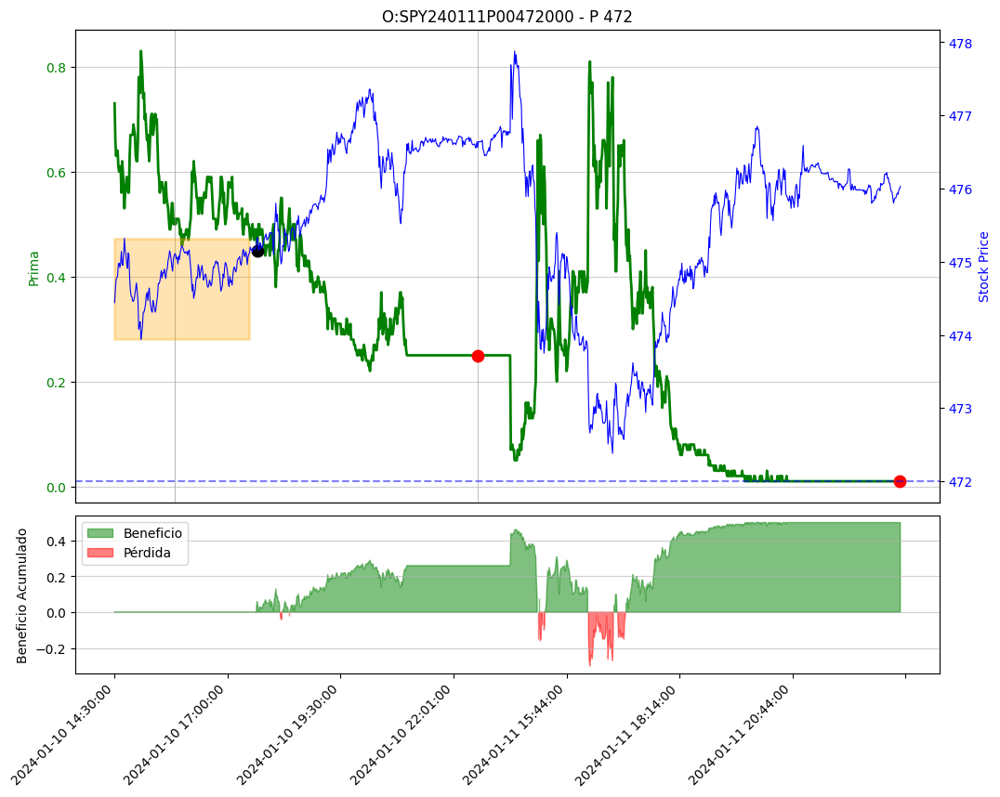

Trading Date:    2024-01-11
Expiration Date: 2024-01-12
Valor mínimo IB:     473.75
Valor máximo IB:     477.88
El SPY rompe el Mínimo del IB en la fila 103 con el valor 473.16
Vendemos el Stike 476
O:SPY240112C00476000 - C 476
Entramos en la fila: 103
Index(['v', 'vw', 'o', 'c', 'h', 'l', 't', 'n'], dtype='object')


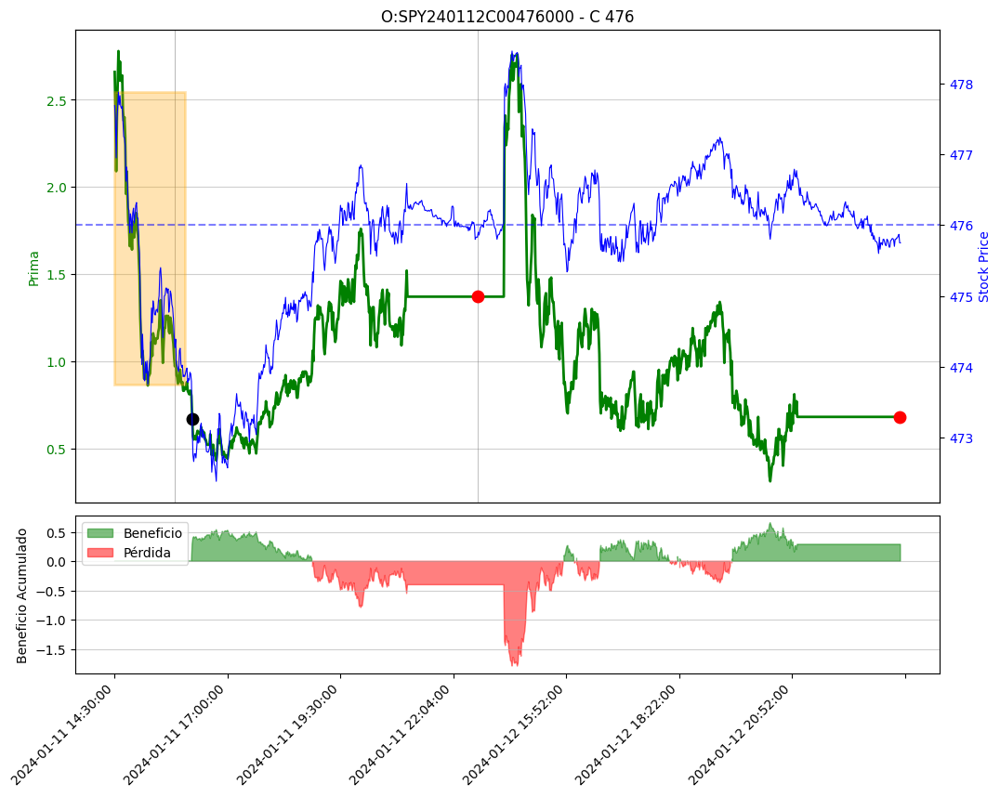

Trading Date:    2024-01-12
Expiration Date: 2024-01-16
Valor mínimo IB:     475.72
Valor máximo IB:     478.46
El SPY rompe el Mínimo del IB en la fila 81 con el valor 475.66
Vendemos el Stike 478
O:SPY240116C00478000 - C 478
Entramos en la fila: 81
Index(['v', 'vw', 'o', 'c', 'h', 'l', 't', 'n'], dtype='object')


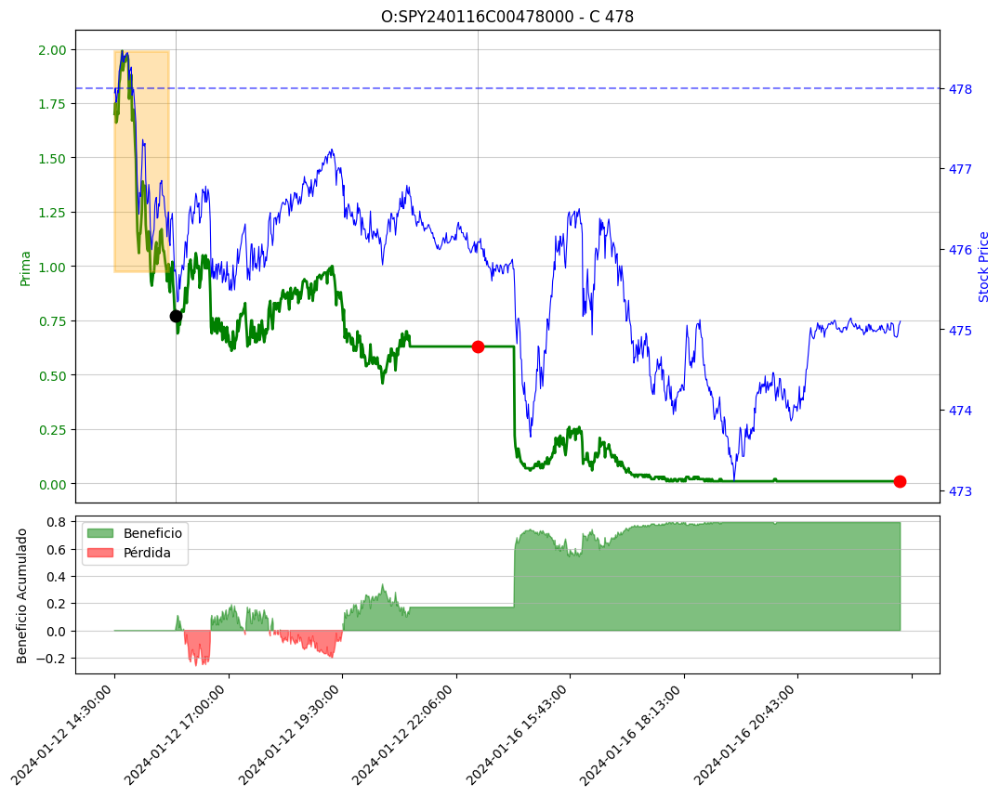

Trading Date:    2024-01-16
Expiration Date: 2024-01-17
Valor mínimo IB:     473.66
Valor máximo IB:     476.47
El SPY rompe el Máximo del IB en la fila 85 con el valor 476.5
Tenedencia Alcista-> Vender P
Vendemos el Stike 473
O:SPY240117P00473000 - P 473
Entramos en la fila: 85
Index(['v', 'vw', 'o', 'c', 'h', 'l', 't', 'n'], dtype='object')


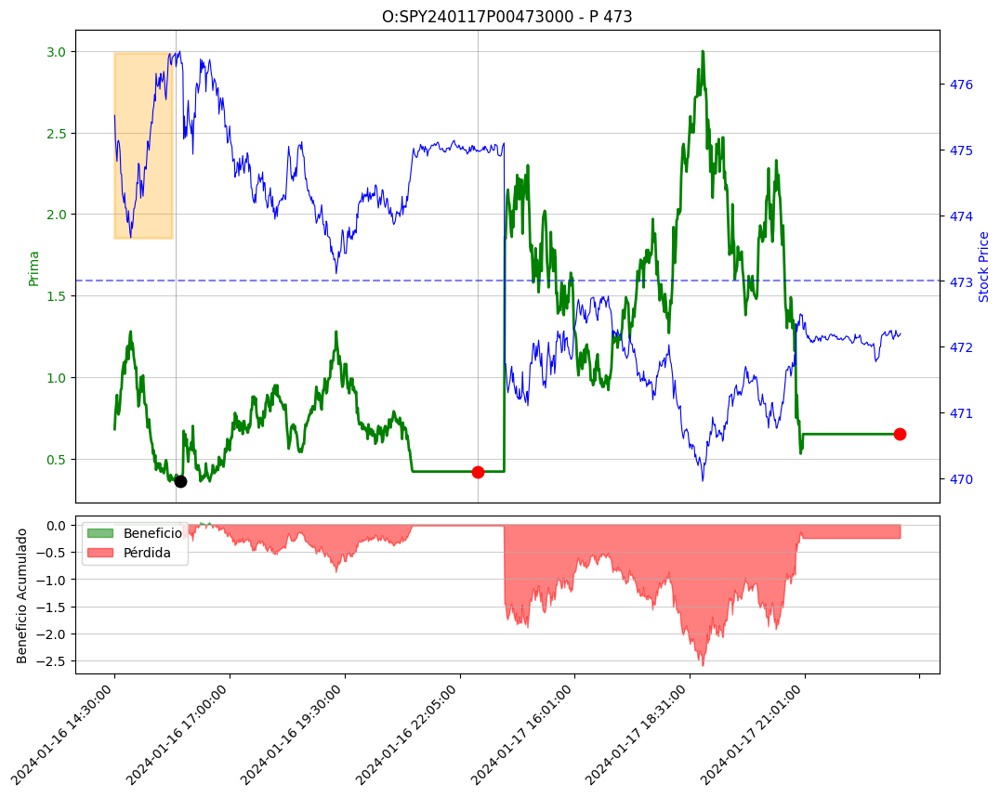

Trading Date:    2024-01-17
Expiration Date: 2024-01-18
Valor mínimo IB:     471.1
Valor máximo IB:     472.24
El SPY rompe el Máximo del IB en la fila 90 con el valor 472.28
Tenedencia Alcista-> Vender P
Vendemos el Stike 469
O:SPY240118P00469000 - P 469
Entramos en la fila: 90
Index(['v', 'vw', 'o', 'c', 'h', 'l', 't', 'n'], dtype='object')


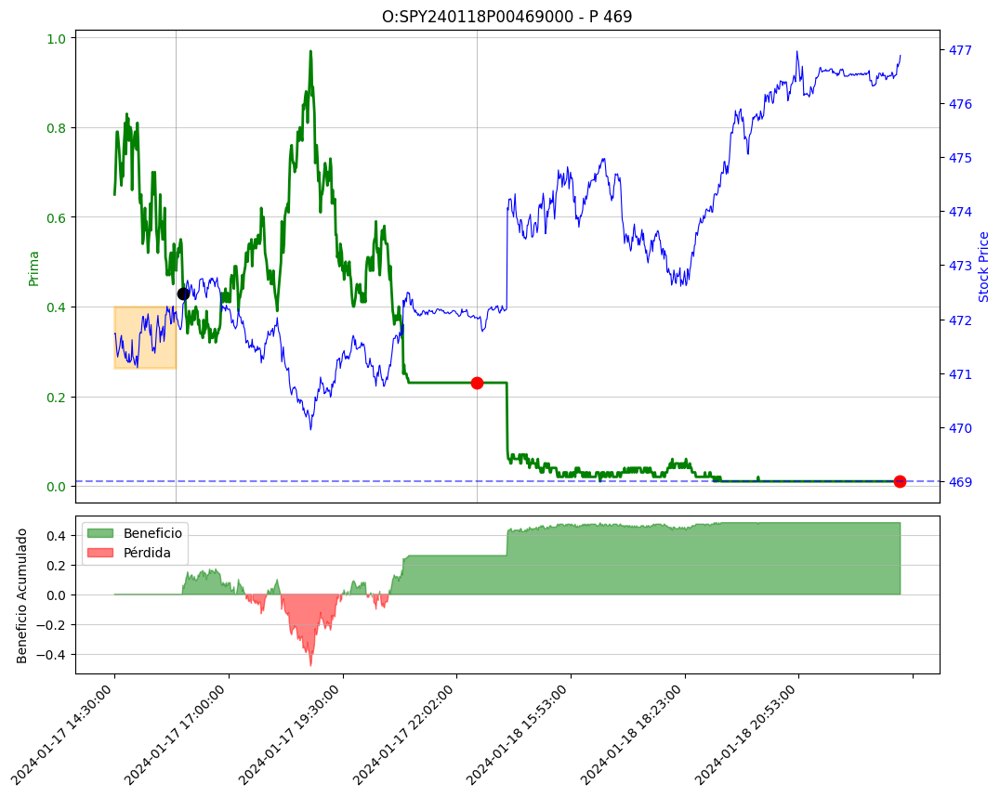

Trading Date:    2024-01-18
Expiration Date: 2024-01-19
Valor mínimo IB:     473.48
Valor máximo IB:     474.82
El SPY rompe el Máximo del IB en la fila 121 con el valor 474.85
Tenedencia Alcista-> Vender P
Vendemos el Stike 471
O:SPY240119P00471000 - P 471
Entramos en la fila: 121
Index(['v', 'vw', 'o', 'c', 'h', 'l', 't', 'n'], dtype='object')


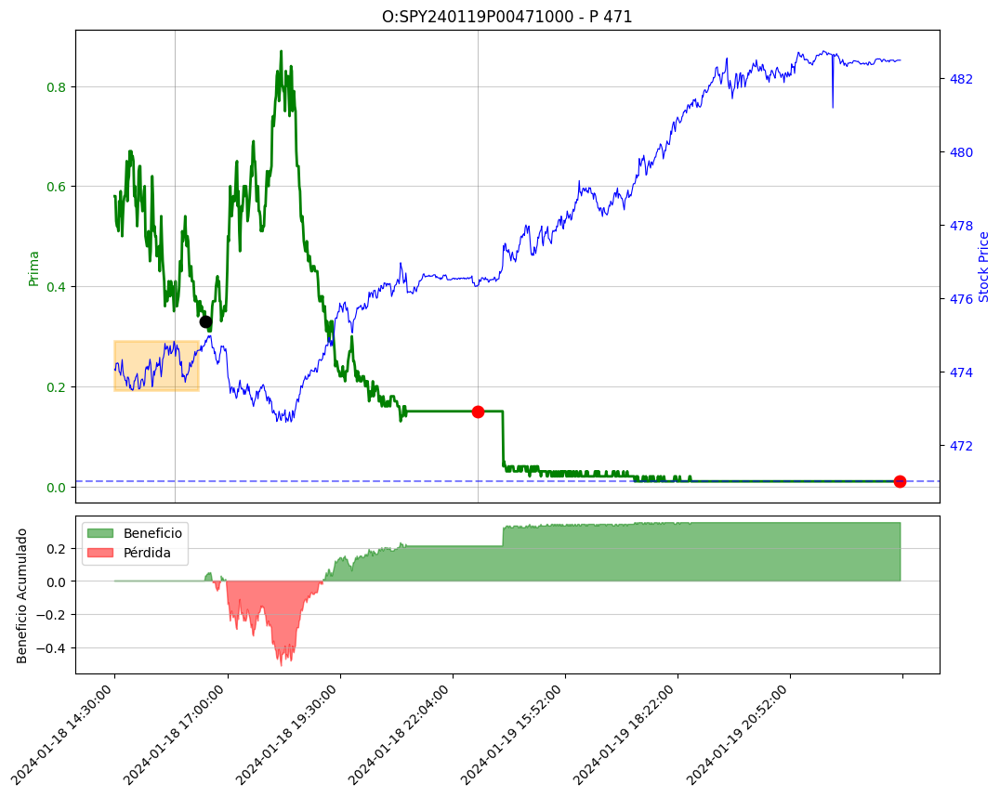

Trading Date:    2024-01-19
Expiration Date: 2024-01-22
Valor mínimo IB:     476.98
Valor máximo IB:     478.23
El SPY rompe el Máximo del IB en la fila 85 con el valor 478.37
Tenedencia Alcista-> Vender P
Vendemos el Stike 475
O:SPY240122P00475000 - P 475
Entramos en la fila: 85
Index(['v', 'vw', 'o', 'c', 'h', 'l', 't', 'n'], dtype='object')


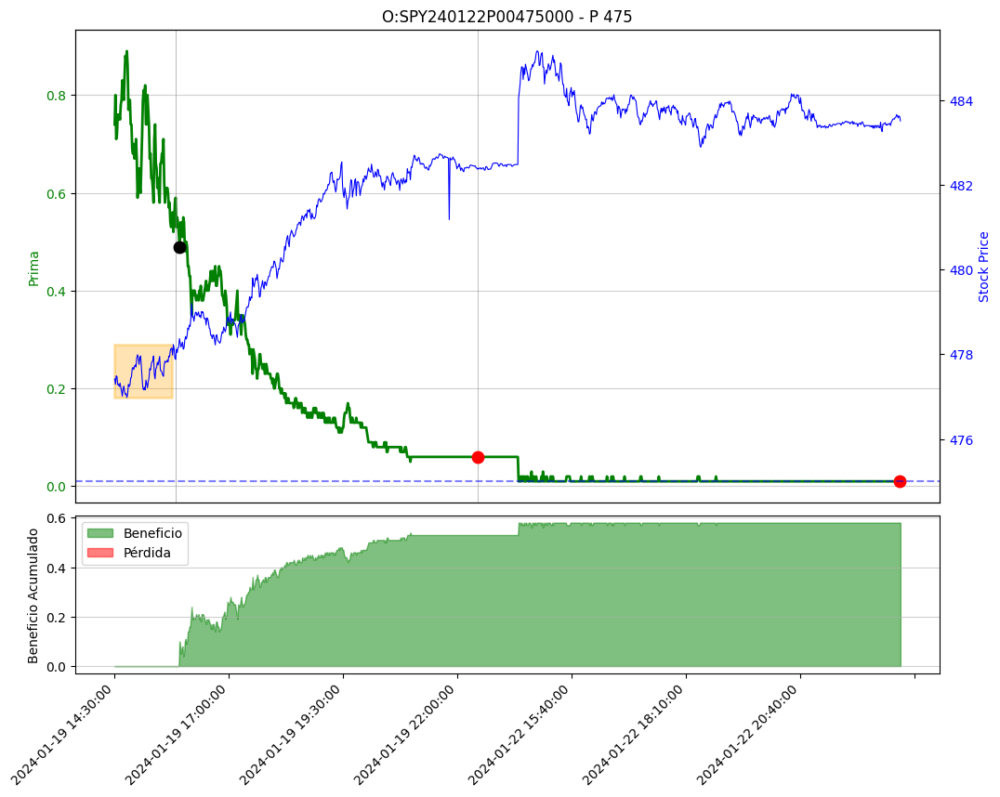

Trading Date:    2024-01-22
Expiration Date: 2024-01-23
Valor mínimo IB:     483.49
Valor máximo IB:     485.16
El SPY rompe el Mínimo del IB en la fila 90 con el valor 483.34
Vendemos el Stike 486
O:SPY240123C00486000 - C 486
Entramos en la fila: 90
Index(['v', 'vw', 'o', 'c', 'h', 'l', 't', 'n'], dtype='object')


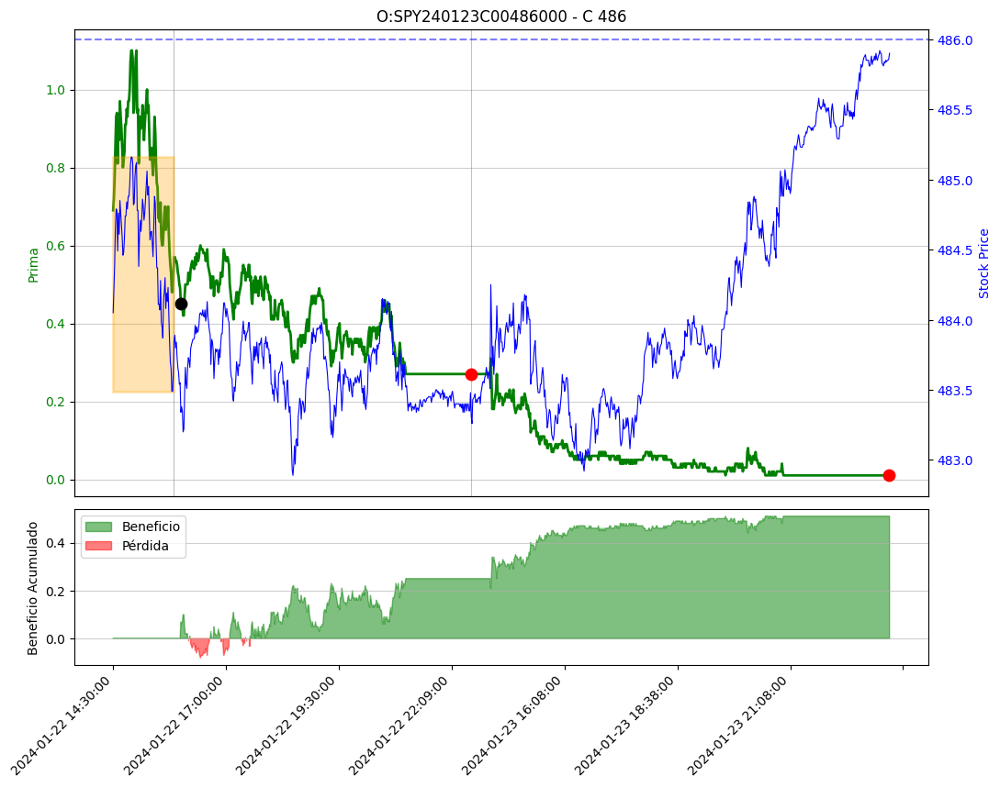

Trading Date:    2024-01-23
Expiration Date: 2024-01-24
Valor mínimo IB:     483.23
Valor máximo IB:     484.25
El SPY rompe el Mínimo del IB en la fila 81 con el valor 483.18
Vendemos el Stike 486
O:SPY240124C00486000 - C 486
Entramos en la fila: 81
Index(['v', 'vw', 'o', 'c', 'h', 'l', 't', 'n'], dtype='object')


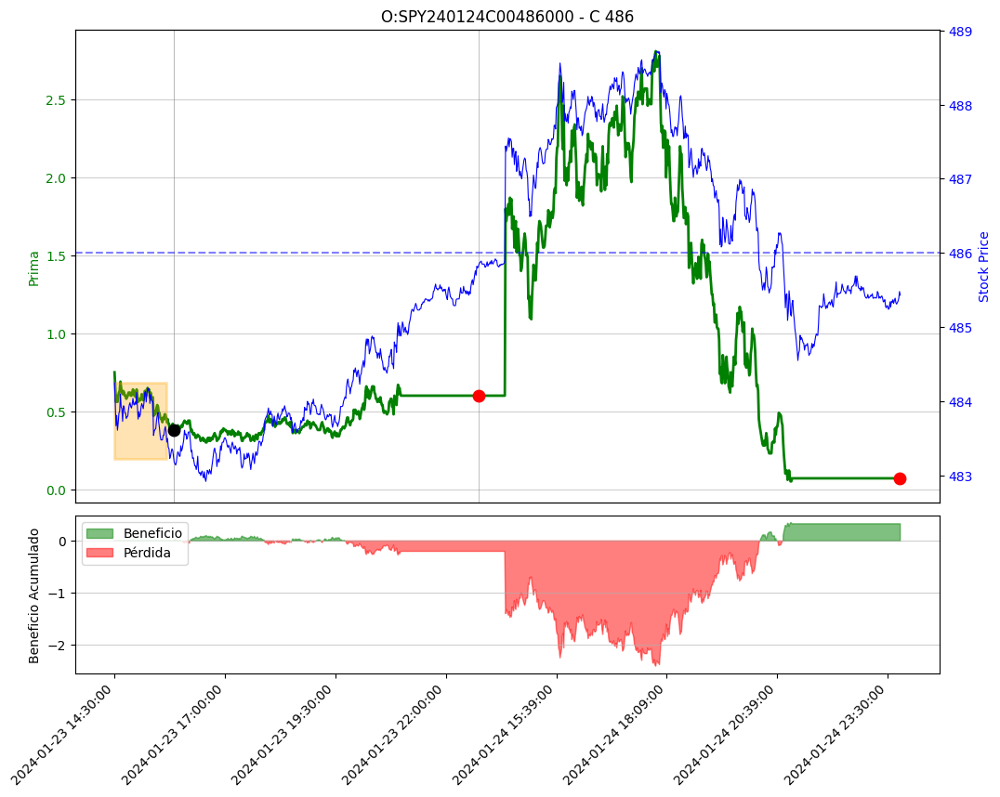

Trading Date:    2024-01-24
Expiration Date: 2024-01-25
Valor mínimo IB:     486.49
Valor máximo IB:     488.56
El SPY rompe el Máximo del IB en la fila 184 con el valor 488.58
Tenedencia Alcista-> Vender P
Vendemos el Stike 485
O:SPY240125P00485000 - P 485
Entramos en la fila: 184
Index(['v', 'vw', 'o', 'c', 'h', 'l', 't', 'n'], dtype='object')


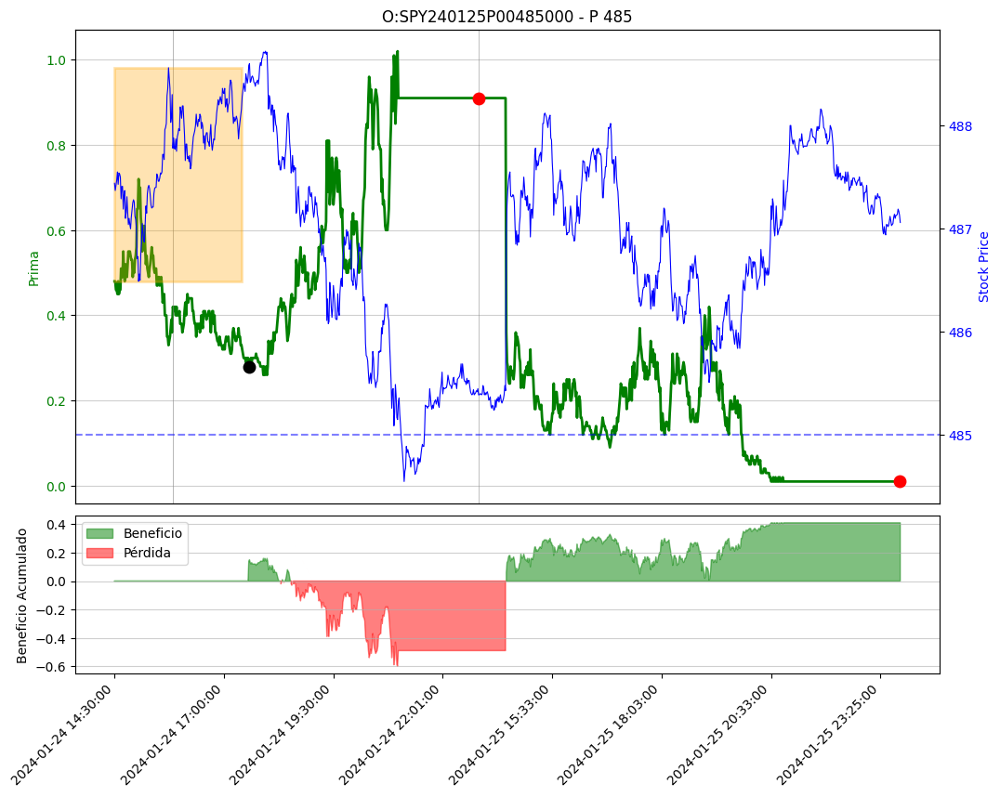

Trading Date:    2024-01-25
Expiration Date: 2024-01-26
Valor mínimo IB:     486.84
Valor máximo IB:     488.12
El SPY rompe el Mínimo del IB en la fila 157 con el valor 486.76
Vendemos el Stike 489
O:SPY240126C00489000 - C 489
Entramos en la fila: 157
Index(['v', 'vw', 'o', 'c', 'h', 'l', 't', 'n'], dtype='object')


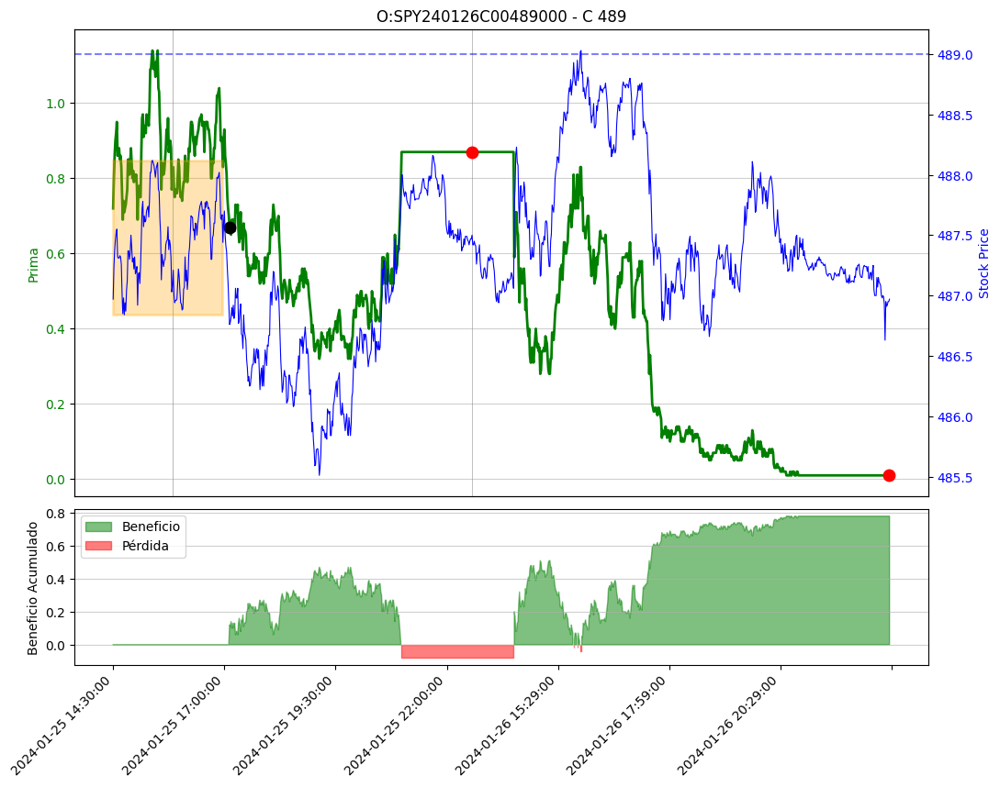

Trading Date:    2024-01-26
Expiration Date: 2024-01-29
Valor mínimo IB:     487.16
Valor máximo IB:     488.79
El SPY rompe el Máximo del IB en la fila 81 con el valor 488.82
Tenedencia Alcista-> Vender P
Vendemos el Stike 485
O:SPY240129P00485000 - P 485
Entramos en la fila: 81
Index(['v', 'vw', 'o', 'c', 'h', 'l', 't', 'n'], dtype='object')


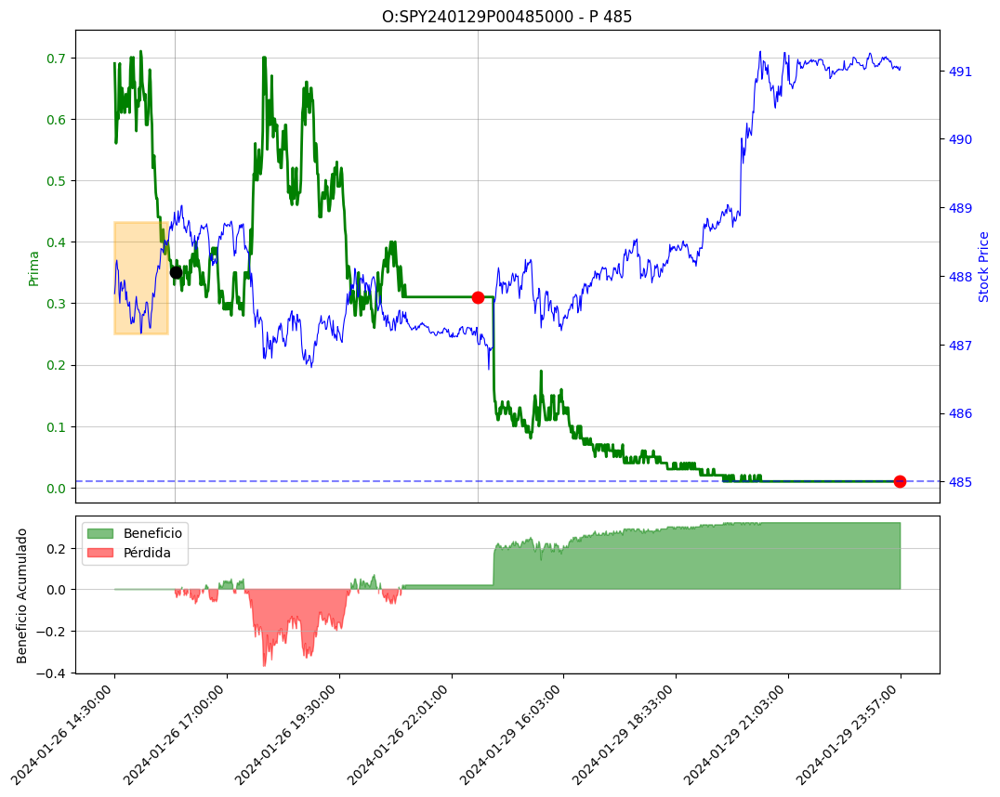

Trading Date:    2024-01-29
Expiration Date: 2024-01-30
Valor mínimo IB:     487.24
Valor máximo IB:     488.24
El SPY rompe el Mínimo del IB en la fila 90 con el valor 487.2
Vendemos el Stike 490
O:SPY240130C00490000 - C 490
Entramos en la fila: 90
Index(['v', 'vw', 'o', 'c', 'h', 'l', 't', 'n'], dtype='object')


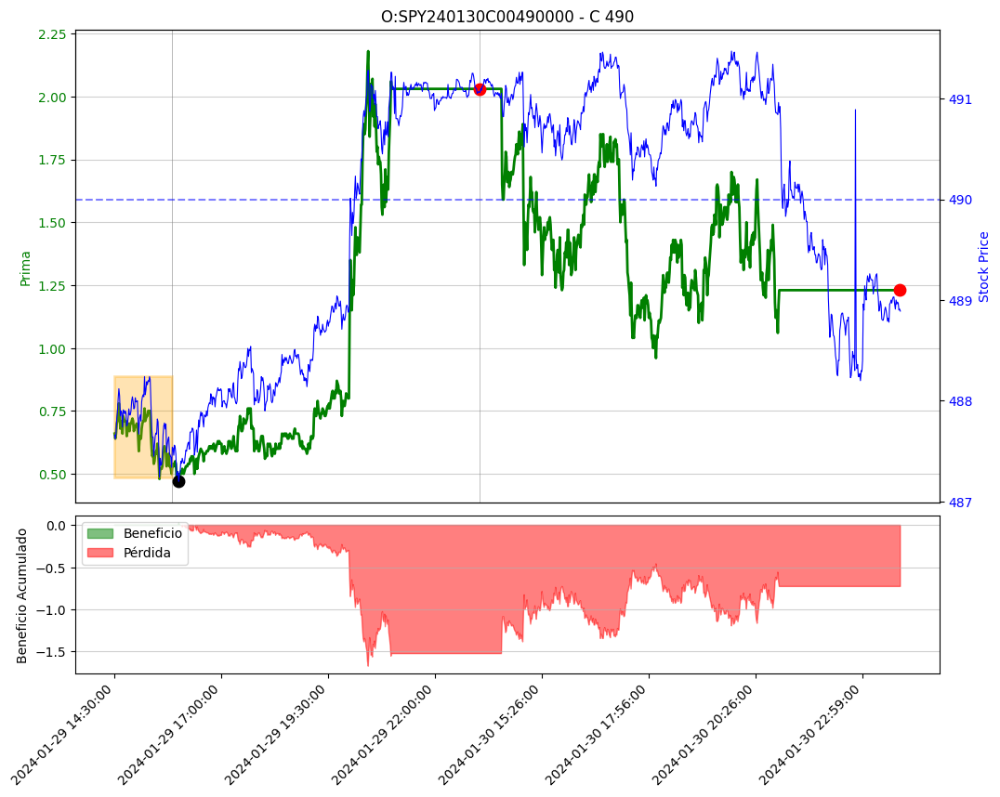

Trading Date:    2024-01-30
Expiration Date: 2024-01-31
Valor mínimo IB:     490.43
Valor máximo IB:     491.26
El SPY rompe el Mínimo del IB en la fila 84 con el valor 490.39
Vendemos el Stike 493
O:SPY240131C00493000 - C 493
Entramos en la fila: 84
Index(['v', 'vw', 'o', 'c', 'h', 'l', 't', 'n'], dtype='object')


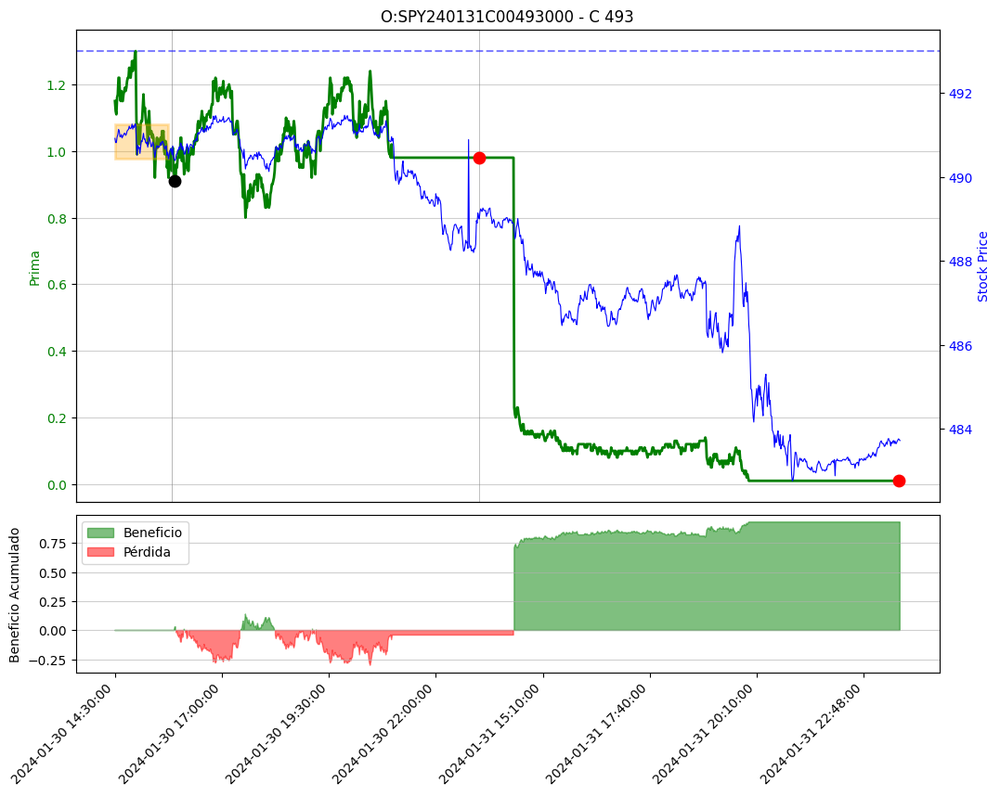

Trading Date:    2024-01-31
Expiration Date: 2024-02-01
Valor mínimo IB:     486.46
Valor máximo IB:     489.01
El SPY rompe el Mínimo del IB en la fila 131 con el valor 486.45
Vendemos el Stike 489
O:SPY240201C00489000 - C 489
Entramos en la fila: 131
Index(['v', 'vw', 'o', 'c', 'h', 'l', 't', 'n'], dtype='object')


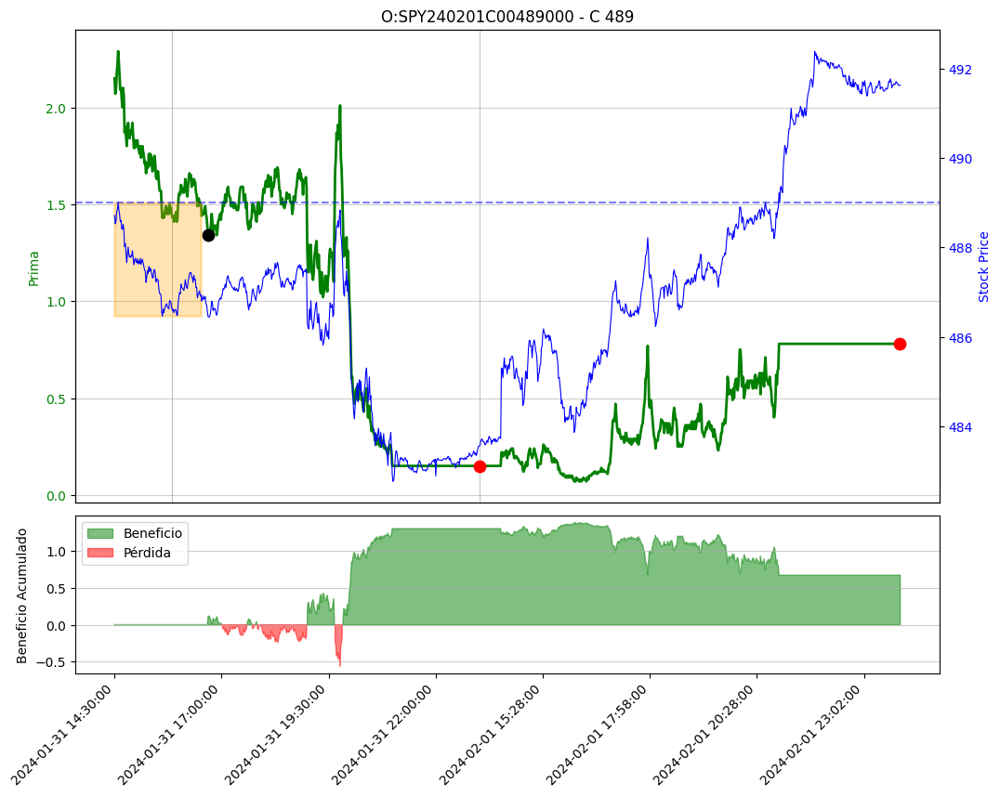

Trading Date:    2024-02-01
Expiration Date: 2024-02-02
Valor mínimo IB:     484.46
Valor máximo IB:     486.18
El SPY rompe el Mínimo del IB en la fila 86 con el valor 484.4
Vendemos el Stike 487
O:SPY240202C00487000 - C 487
Entramos en la fila: 86
Index(['v', 'vw', 'o', 'c', 'h', 'l', 't', 'n'], dtype='object')


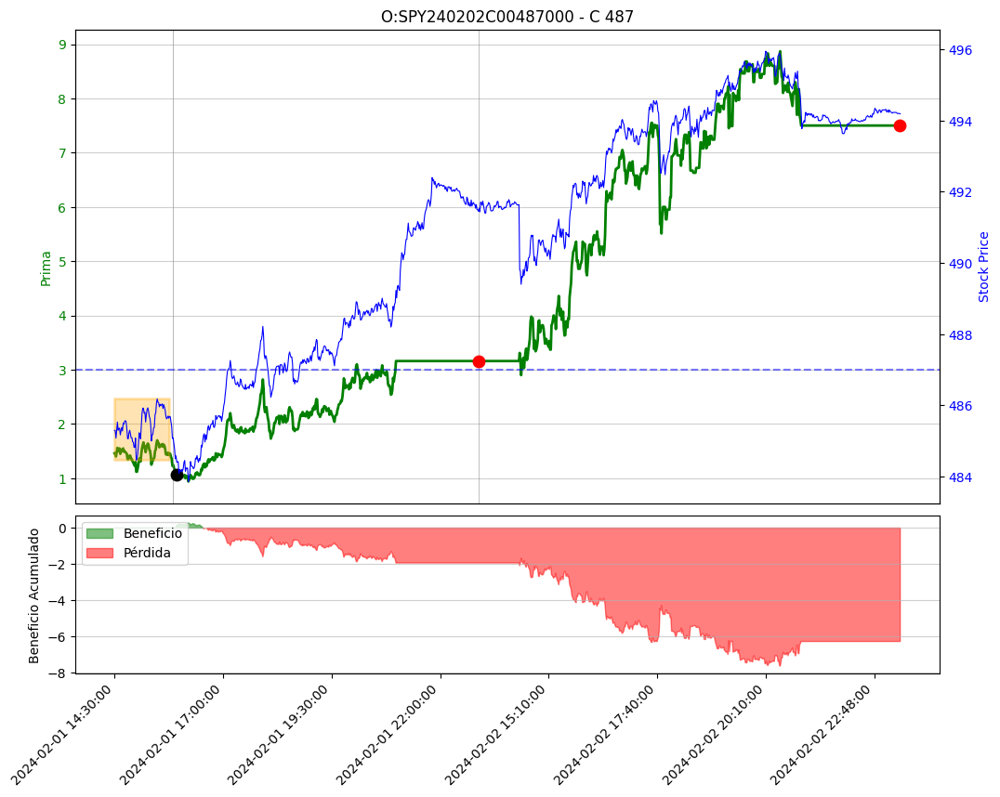

Trading Date:    2024-02-02
Expiration Date: 2024-02-05
Valor mínimo IB:     489.4
Valor máximo IB:     492.24
El SPY rompe el Máximo del IB en la fila 87 con el valor 492.3
Tenedencia Alcista-> Vender P
Vendemos el Stike 489
O:SPY240205P00489000 - P 489
Entramos en la fila: 87
Index(['v', 'vw', 'o', 'c', 'h', 'l', 't', 'n'], dtype='object')


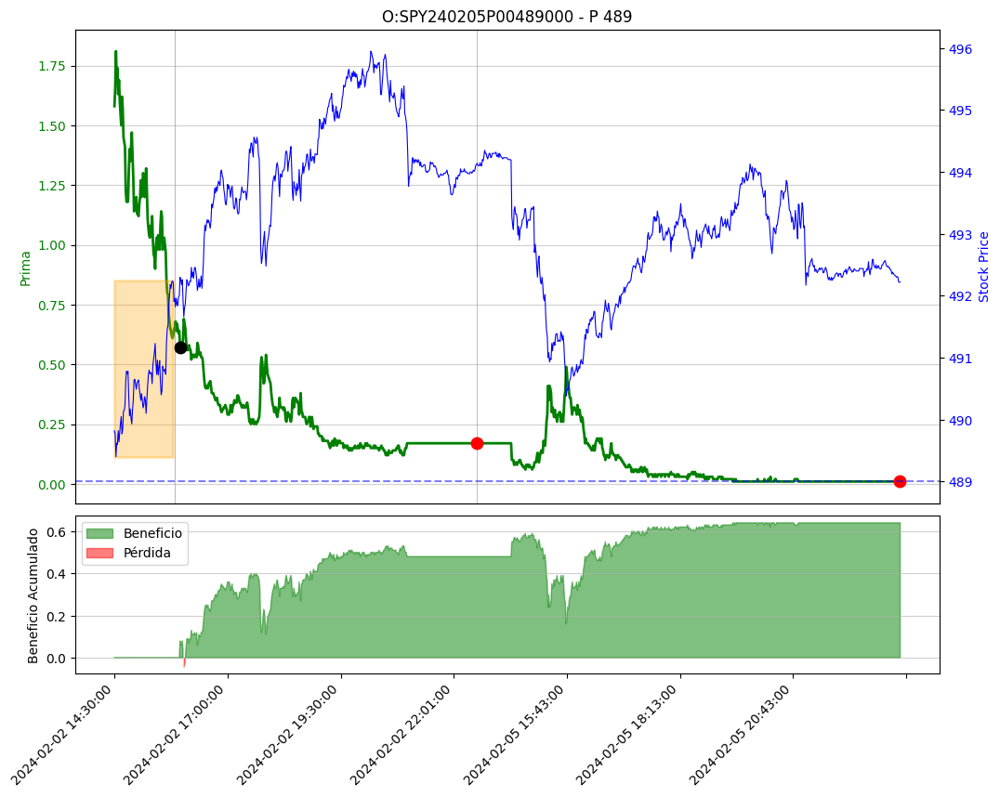

Trading Date:    2024-02-05
Expiration Date: 2024-02-06
Valor mínimo IB:     490.38
Valor máximo IB:     493.44
El SPY rompe el Máximo del IB en la fila 224 con el valor 493.49
Tenedencia Alcista-> Vender P
Vendemos el Stike 490
O:SPY240206P00490000 - P 490
Entramos en la fila: 224
Index(['v', 'vw', 'o', 'c', 'h', 'l', 't', 'n'], dtype='object')


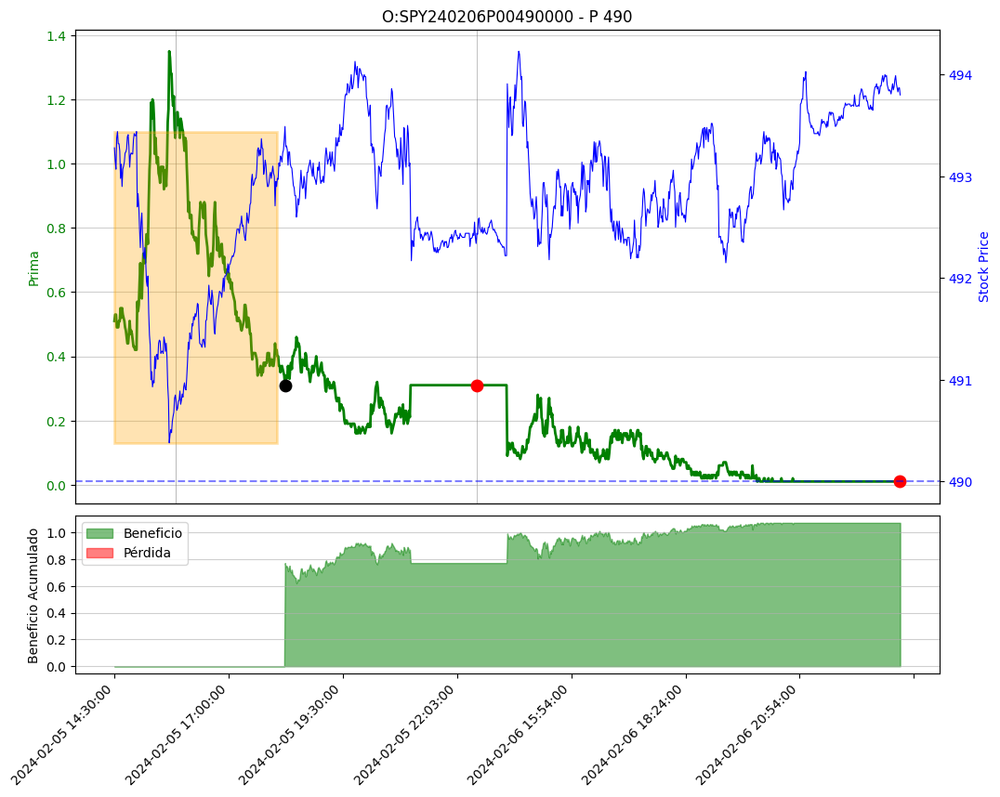

Trading Date:    2024-02-06
Expiration Date: 2024-02-07
Valor mínimo IB:     492.18
Valor máximo IB:     494.23
El SPY rompe el Mínimo del IB en la fila 287 con el valor 492.15
Vendemos el Stike 495
O:SPY240207C00495000 - C 495
Entramos en la fila: 287
Index(['v', 'vw', 'o', 'c', 'h', 'l', 't', 'n'], dtype='object')


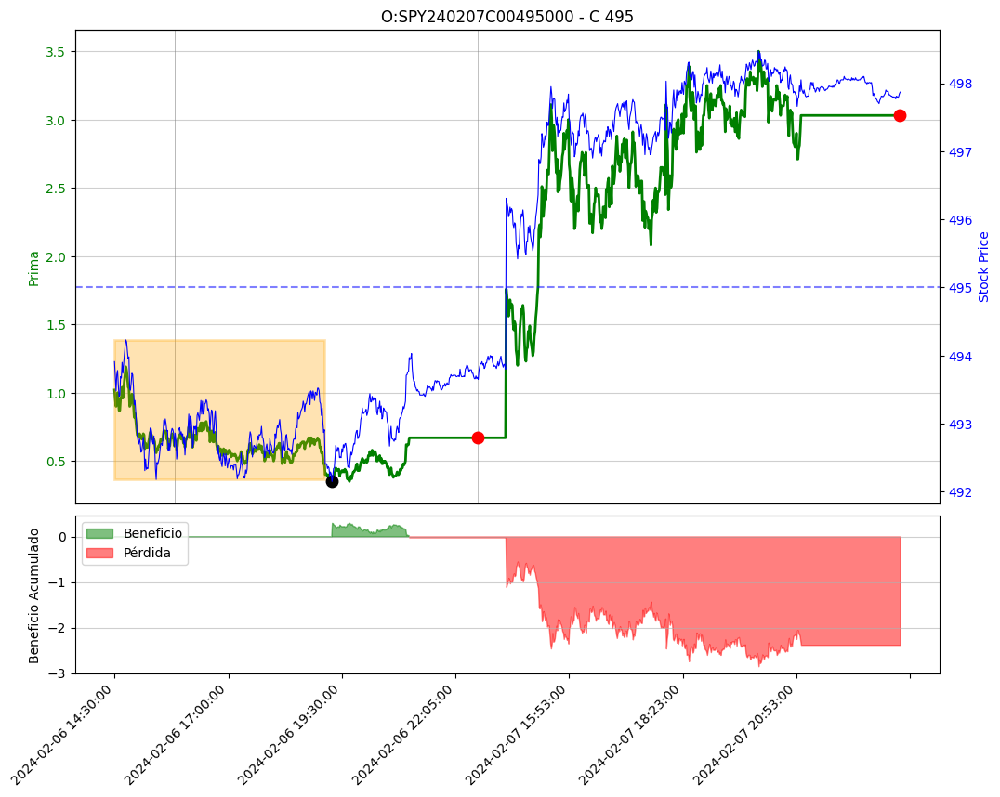

Trading Date:    2024-02-07
Expiration Date: 2024-02-08
Valor mínimo IB:     495.42
Valor máximo IB:     497.95
El SPY rompe el Máximo del IB en la fila 211 con el valor 498.03
Tenedencia Alcista-> Vender P
Vendemos el Stike 495
O:SPY240208P00495000 - P 495
Entramos en la fila: 211
Index(['v', 'vw', 'o', 'c', 'h', 'l', 't', 'n'], dtype='object')


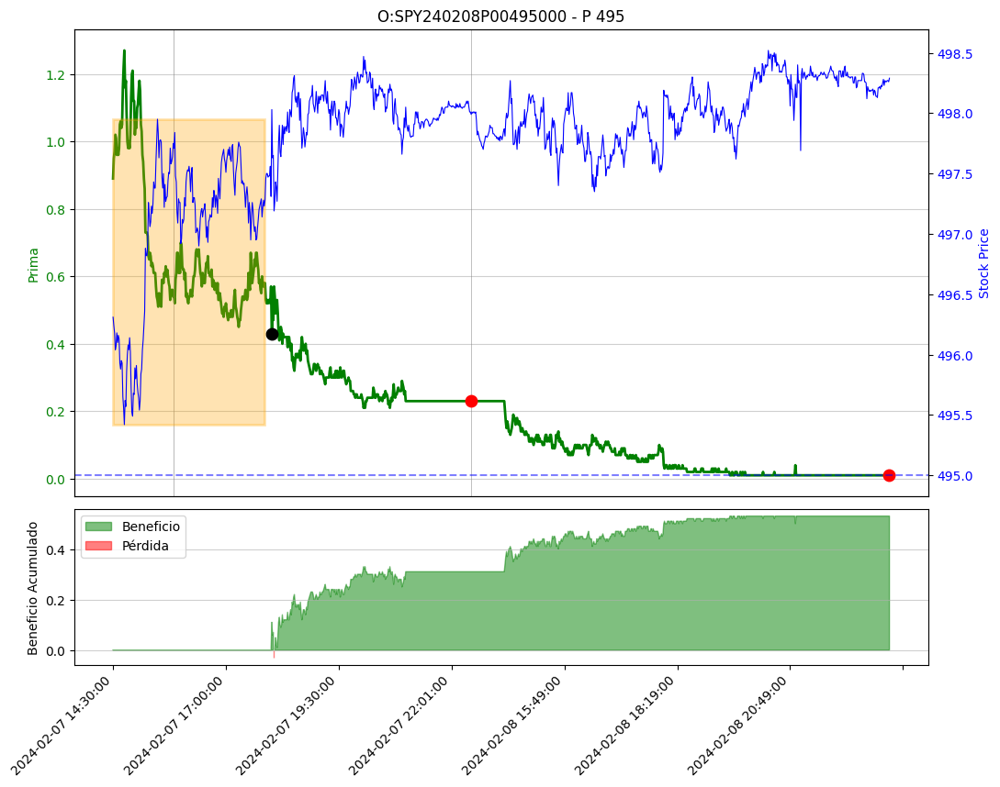

Trading Date:    2024-02-08
Expiration Date: 2024-02-09
Valor mínimo IB:     497.4
Valor máximo IB:     498.27
El SPY rompe el Mínimo del IB en la fila 116 con el valor 497.39
Vendemos el Stike 500
O:SPY240209C00500000 - C 500
Entramos en la fila: 116
Index(['v', 'vw', 'o', 'c', 'h', 'l', 't', 'n'], dtype='object')


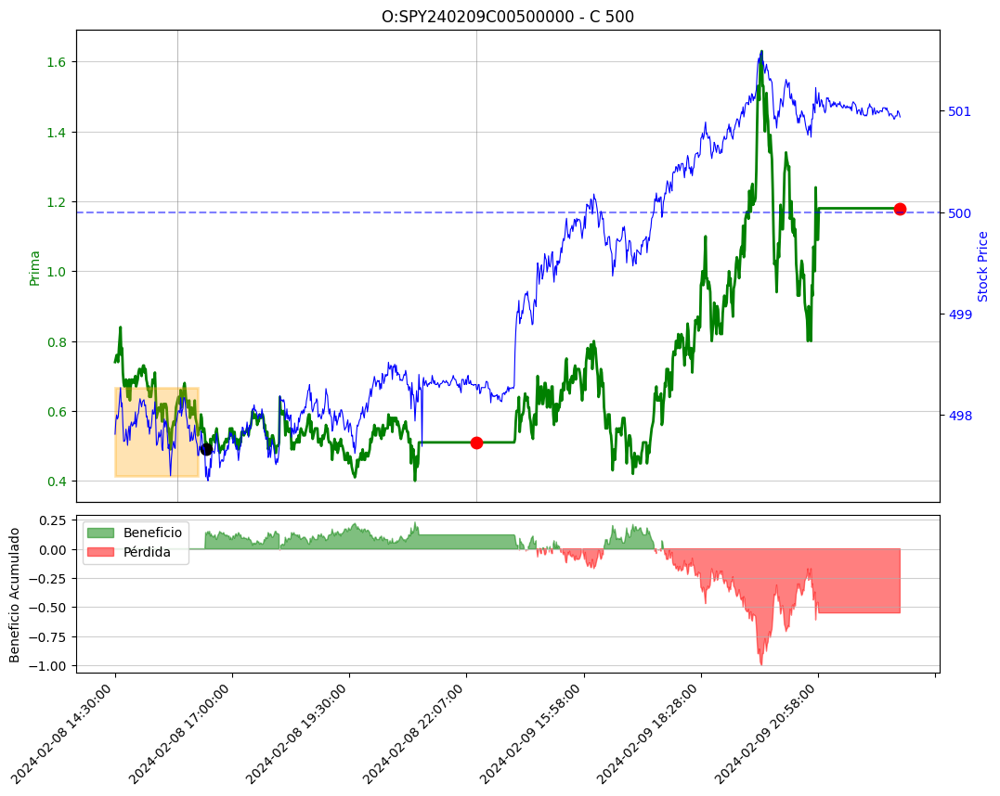

Trading Date:    2024-02-09
Expiration Date: 2024-02-12
Valor mínimo IB:     498.62
Valor máximo IB:     499.94
El SPY rompe el Máximo del IB en la fila 89 con el valor 499.96
Tenedencia Alcista-> Vender P
Vendemos el Stike 496
O:SPY240212P00496000 - P 496
Entramos en la fila: 89
Index(['v', 'vw', 'o', 'c', 'h', 'l', 't', 'n'], dtype='object')


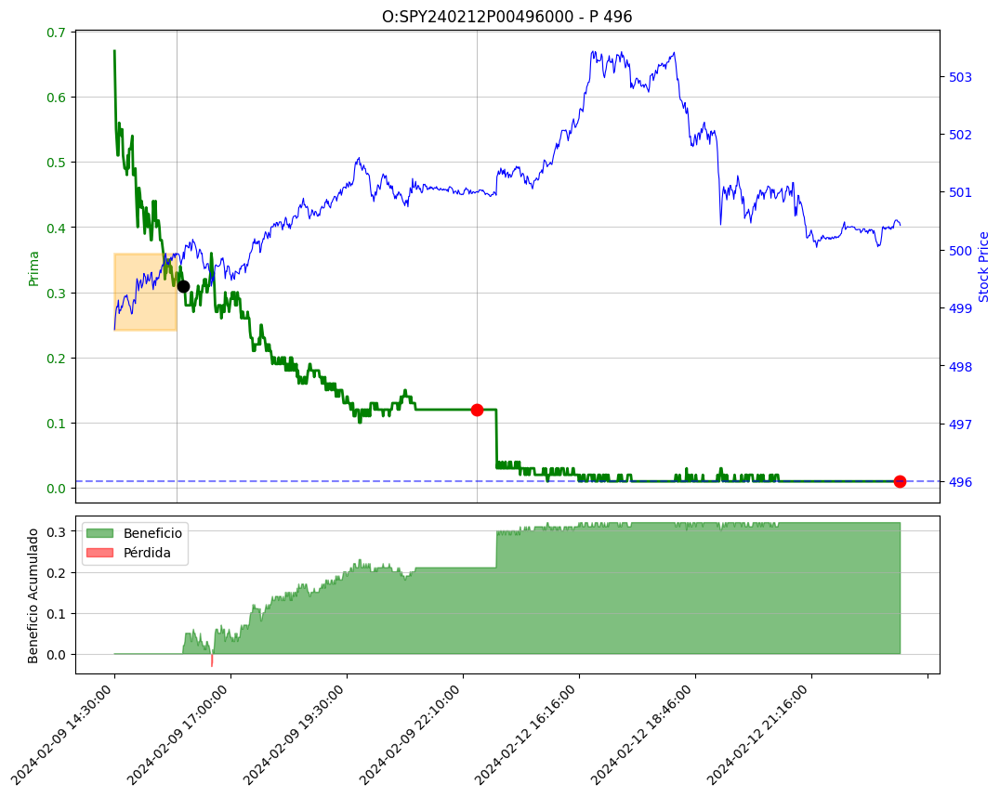

Trading Date:    2024-02-12
Expiration Date: 2024-02-13
Valor mínimo IB:     501.05
Valor máximo IB:     501.84
El SPY rompe el Máximo del IB en la fila 81 con el valor 501.88
Tenedencia Alcista-> Vender P
Vendemos el Stike 498
O:SPY240213P00498000 - P 498
Entramos en la fila: 81
Index(['v', 'vw', 'o', 'c', 'h', 'l', 't', 'n'], dtype='object')


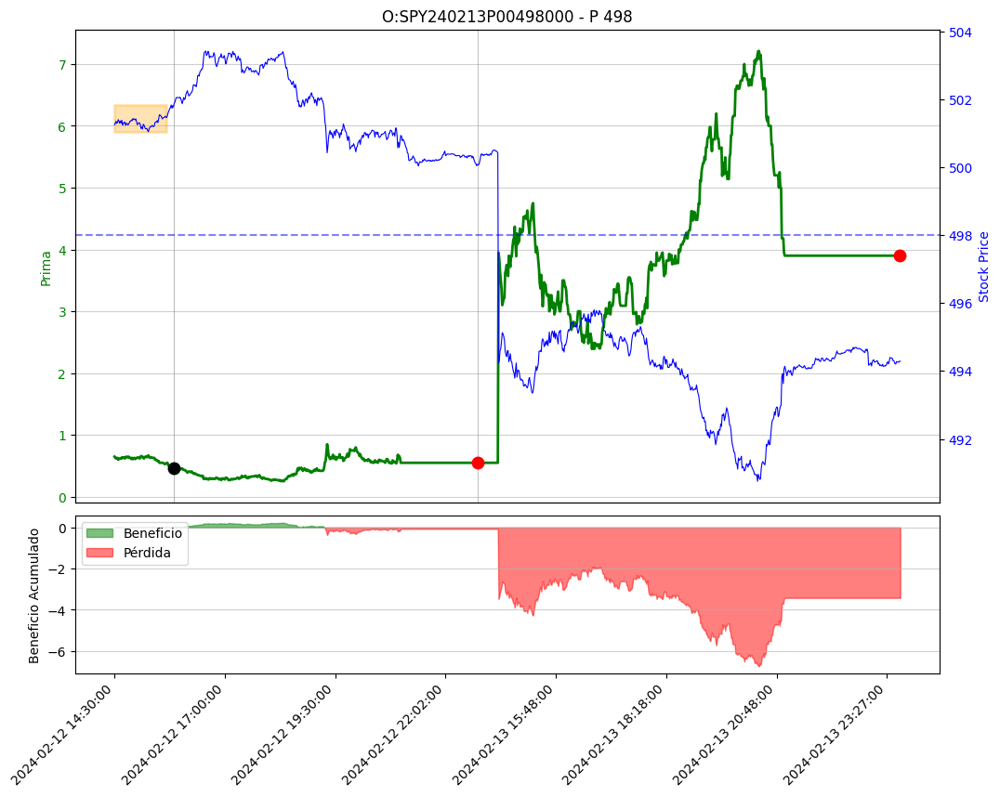

Trading Date:    2024-02-13
Expiration Date: 2024-02-14
Valor mínimo IB:     493.35
Valor máximo IB:     495.18
El SPY rompe el Máximo del IB en la fila 84 con el valor 495.2
Tenedencia Alcista-> Vender P
Vendemos el Stike 492
O:SPY240214P00492000 - P 492
Entramos en la fila: 84
Index(['v', 'vw', 'o', 'c', 'h', 'l', 't', 'n'], dtype='object')


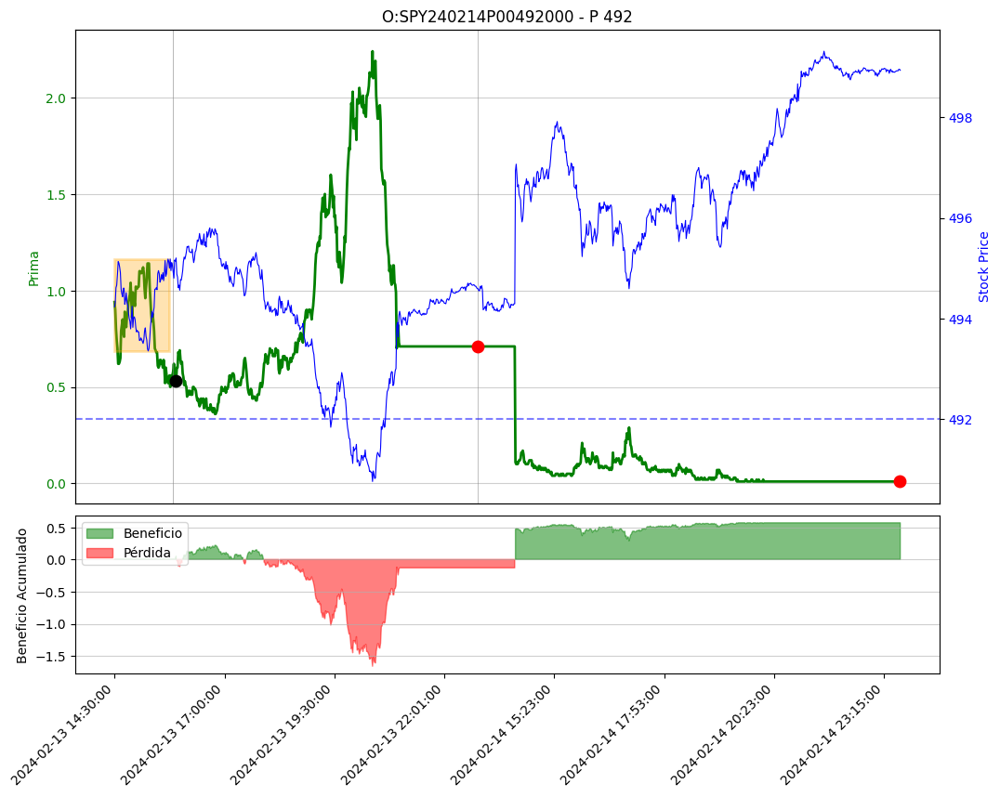

Trading Date:    2024-02-14
Expiration Date: 2024-02-15
Valor mínimo IB:     495.92
Valor máximo IB:     497.92
El SPY rompe el Mínimo del IB en la fila 90 con el valor 495.52
Vendemos el Stike 498
O:SPY240215C00498000 - C 498
Entramos en la fila: 90
Index(['v', 'vw', 'o', 'c', 'h', 'l', 't', 'n'], dtype='object')


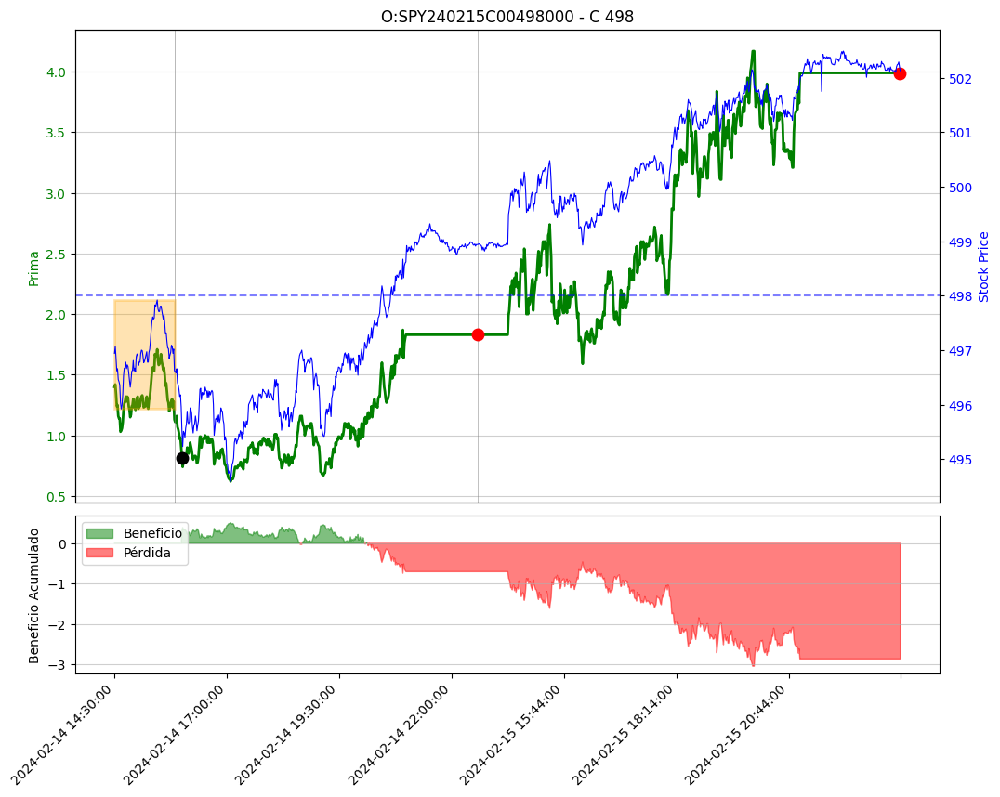

Trading Date:    2024-02-15
Expiration Date: 2024-02-16
Valor mínimo IB:     499.43
Valor máximo IB:     500.48
El SPY rompe el Mínimo del IB en la fila 94 con el valor 499.23
Vendemos el Stike 502
O:SPY240216C00502000 - C 502
Entramos en la fila: 94
Index(['v', 'vw', 'o', 'c', 'h', 'l', 't', 'n'], dtype='object')


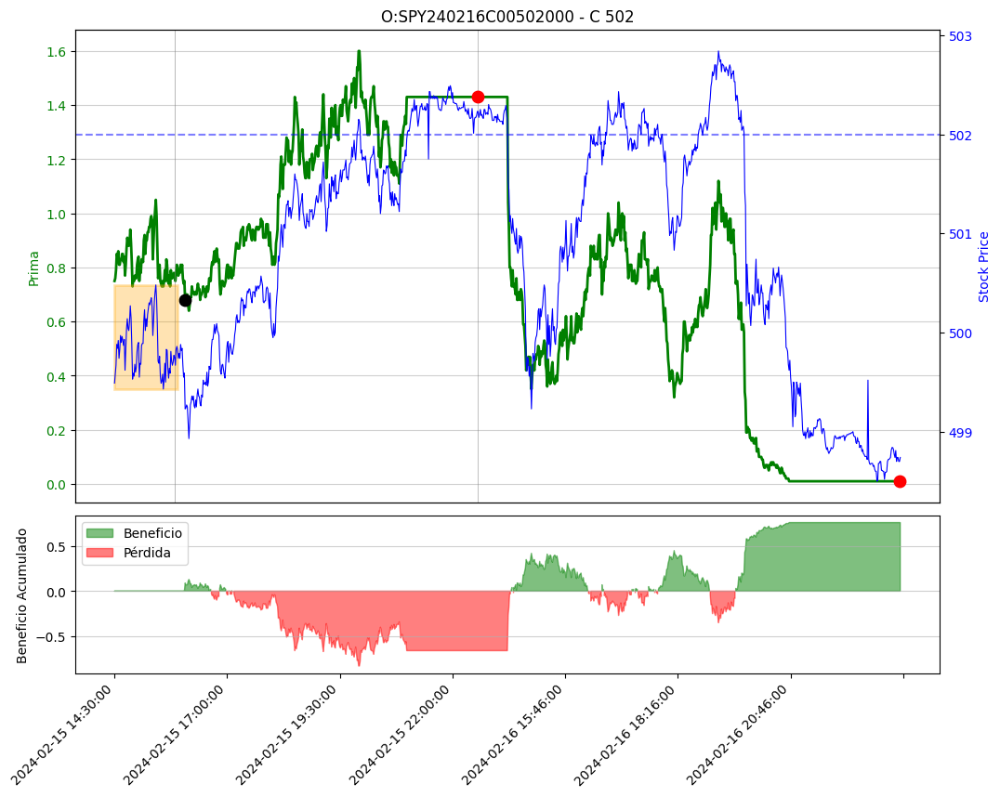

Trading Date:    2024-02-16
Expiration Date: 2024-02-20
Valor mínimo IB:     499.23
Valor máximo IB:     501.53
El SPY rompe el Máximo del IB en la fila 102 con el valor 501.58
Tenedencia Alcista-> Vender P
Vendemos el Stike 498
O:SPY240220P00498000 - P 498
Entramos en la fila: 102
Index(['v', 'vw', 'o', 'c', 'h', 'l', 't', 'n'], dtype='object')


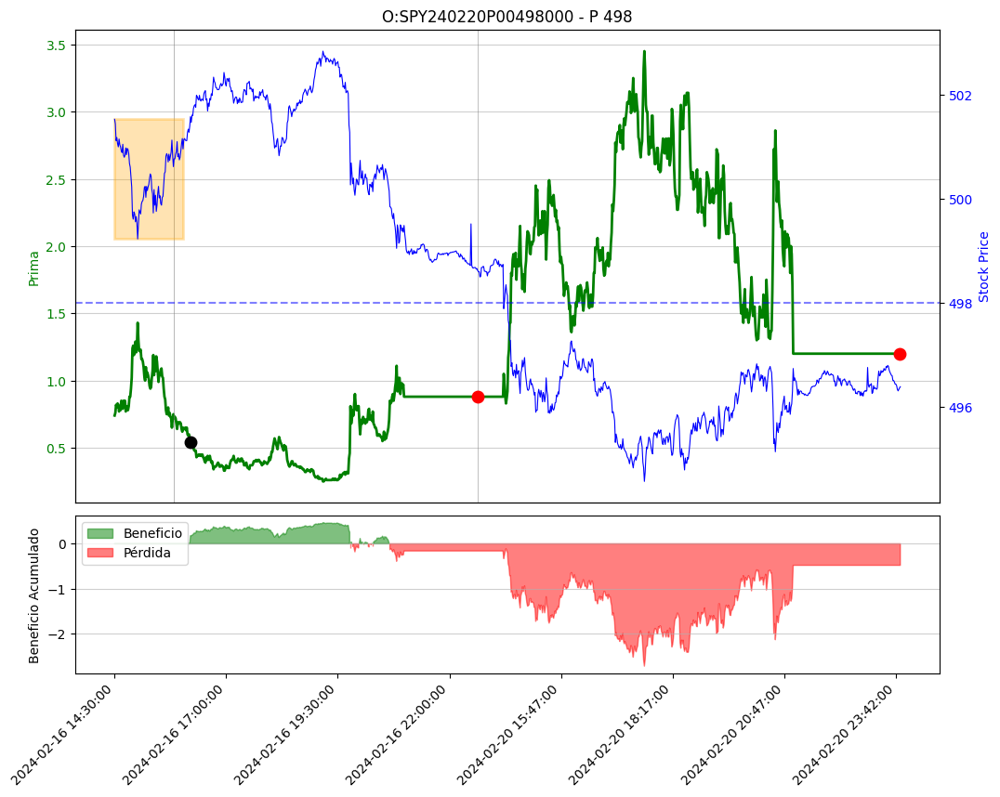

Trading Date:    2024-02-20
Expiration Date: 2024-02-21
Valor mínimo IB:     495.88
Valor máximo IB:     498.35
El SPY rompe el Mínimo del IB en la fila 148 con el valor 495.84
Vendemos el Stike 498
O:SPY240221C00498000 - C 498
Entramos en la fila: 148
Index(['v', 'vw', 'o', 'c', 'h', 'l', 't', 'n'], dtype='object')


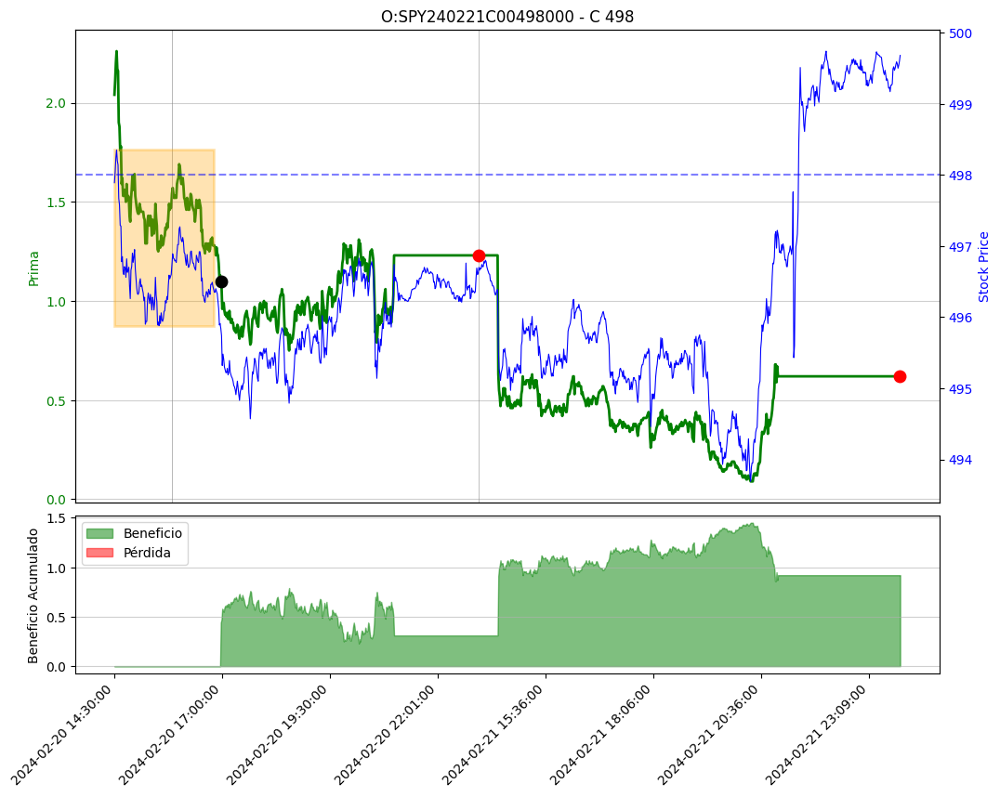

Trading Date:    2024-02-21
Expiration Date: 2024-02-22
Valor mínimo IB:     494.97
Valor máximo IB:     496.01
El SPY rompe el Máximo del IB en la fila 102 con el valor 496.11
Tenedencia Alcista-> Vender P
Vendemos el Stike 493
O:SPY240222P00493000 - P 493
Entramos en la fila: 102
Index(['v', 'vw', 'o', 'c', 'h', 'l', 't', 'n'], dtype='object')


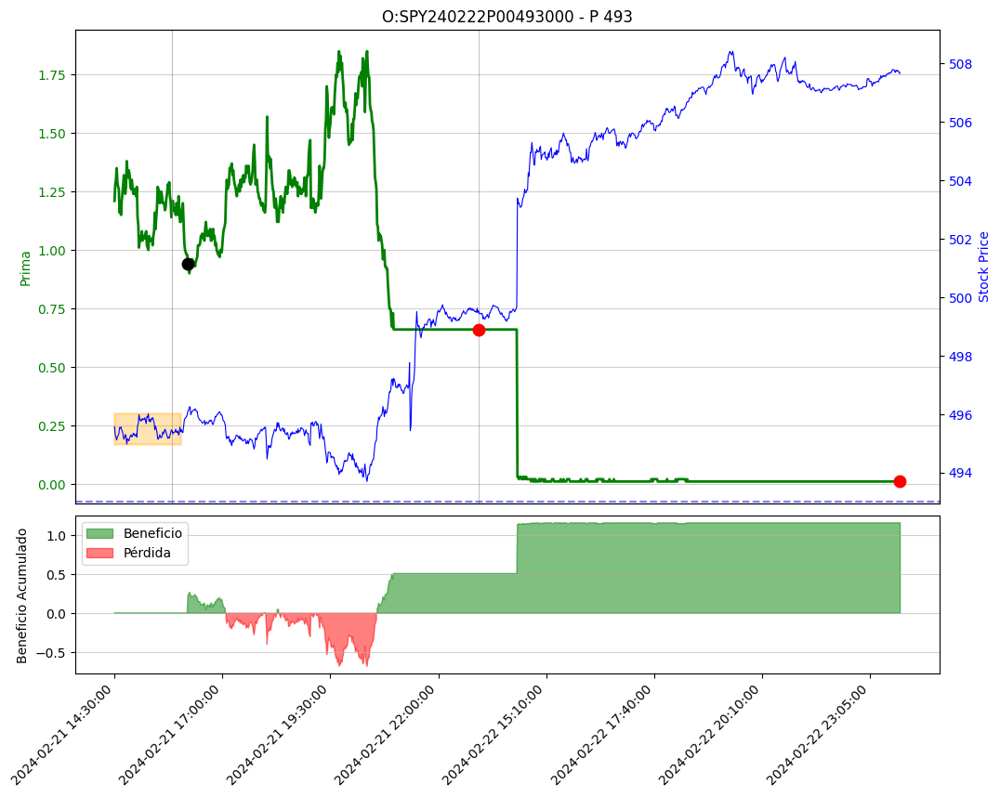

Trading Date:    2024-02-22
Expiration Date: 2024-02-23
Valor mínimo IB:     503.07
Valor máximo IB:     505.62
El SPY rompe el Máximo del IB en la fila 108 con el valor 505.64
Tenedencia Alcista-> Vender P
Vendemos el Stike 502
O:SPY240223P00502000 - P 502
Entramos en la fila: 108
Index(['v', 'vw', 'o', 'c', 'h', 'l', 't', 'n'], dtype='object')


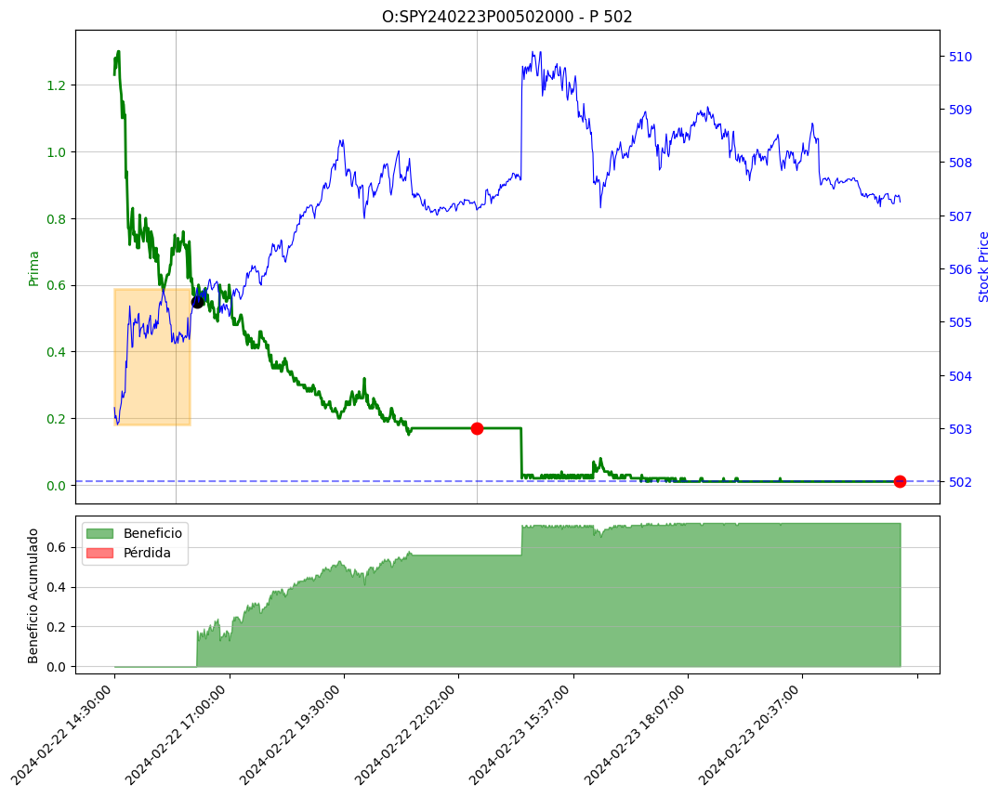

Trading Date:    2024-02-23
Expiration Date: 2024-02-26
Valor mínimo IB:     508.81
Valor máximo IB:     510.08
El SPY rompe el Mínimo del IB en la fila 83 con el valor 508.8
Vendemos el Stike 511
O:SPY240226C00511000 - C 511
Entramos en la fila: 83
Trading Date:    2024-02-26
Expiration Date: 2024-02-27
Valor mínimo IB:     507.63
Valor máximo IB:     508.66
El SPY rompe el Mínimo del IB en la fila 87 con el valor 507.43
Vendemos el Stike 510
O:SPY240227C00510000 - C 510
Entramos en la fila: 87
Index(['v', 'vw', 'o', 'c', 'h', 'l', 't', 'n'], dtype='object')


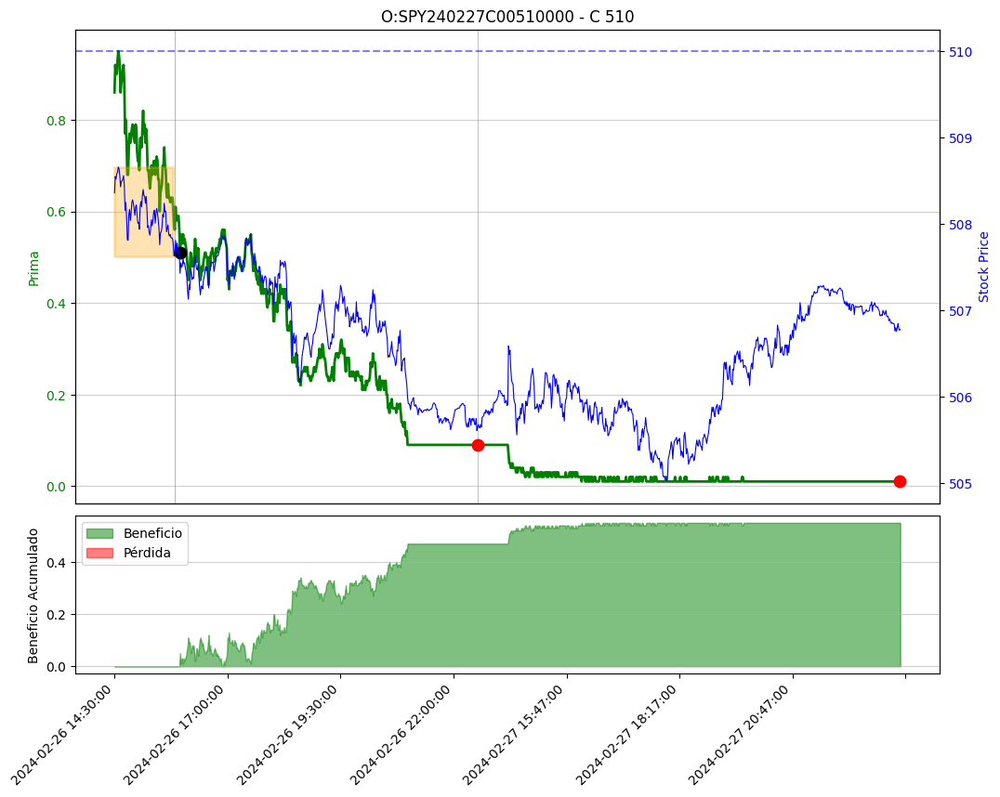

Trading Date:    2024-02-27
Expiration Date: 2024-02-28
Valor mínimo IB:     505.56
Valor máximo IB:     506.59
El SPY rompe el Mínimo del IB en la fila 132 con el valor 505.55
Vendemos el Stike 508
O:SPY240228C00508000 - C 508
Entramos en la fila: 132
Index(['v', 'vw', 'o', 'c', 'h', 'l', 't', 'n'], dtype='object')


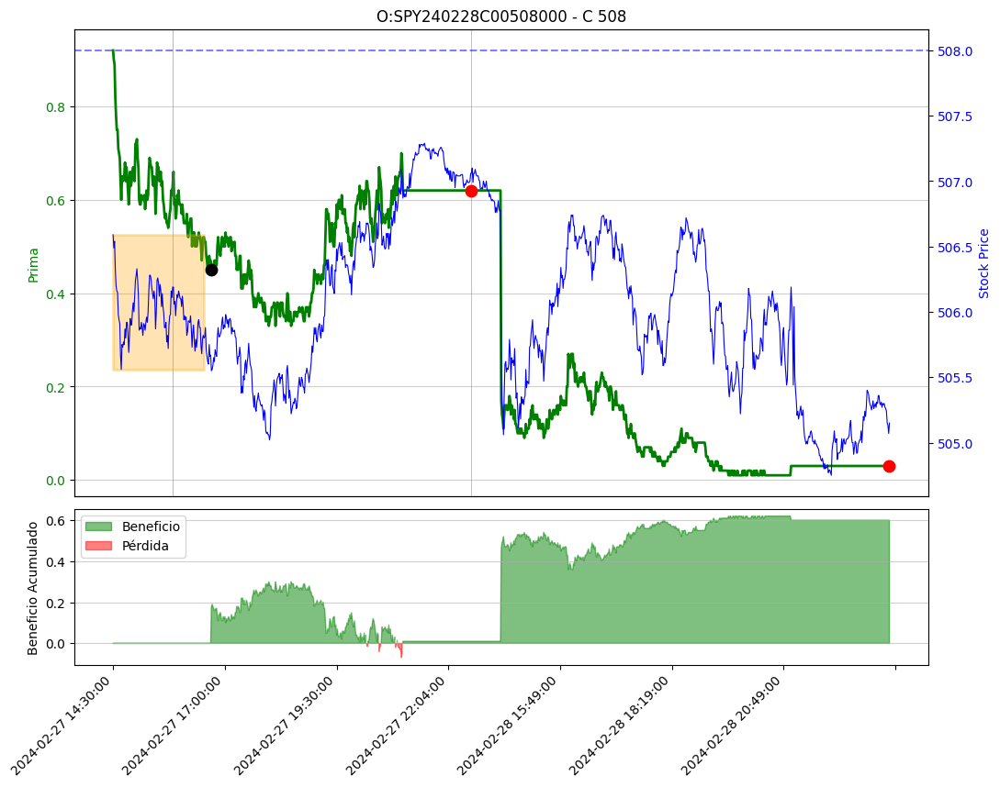

Trading Date:    2024-02-28
Expiration Date: 2024-02-29
Valor mínimo IB:     505.06
Valor máximo IB:     506.22
El SPY rompe el Máximo del IB en la fila 81 con el valor 506.26
Tenedencia Alcista-> Vender P
Vendemos el Stike 503
O:SPY240229P00503000 - P 503
Entramos en la fila: 81
Index(['v', 'vw', 'o', 'c', 'h', 'l', 't', 'n'], dtype='object')


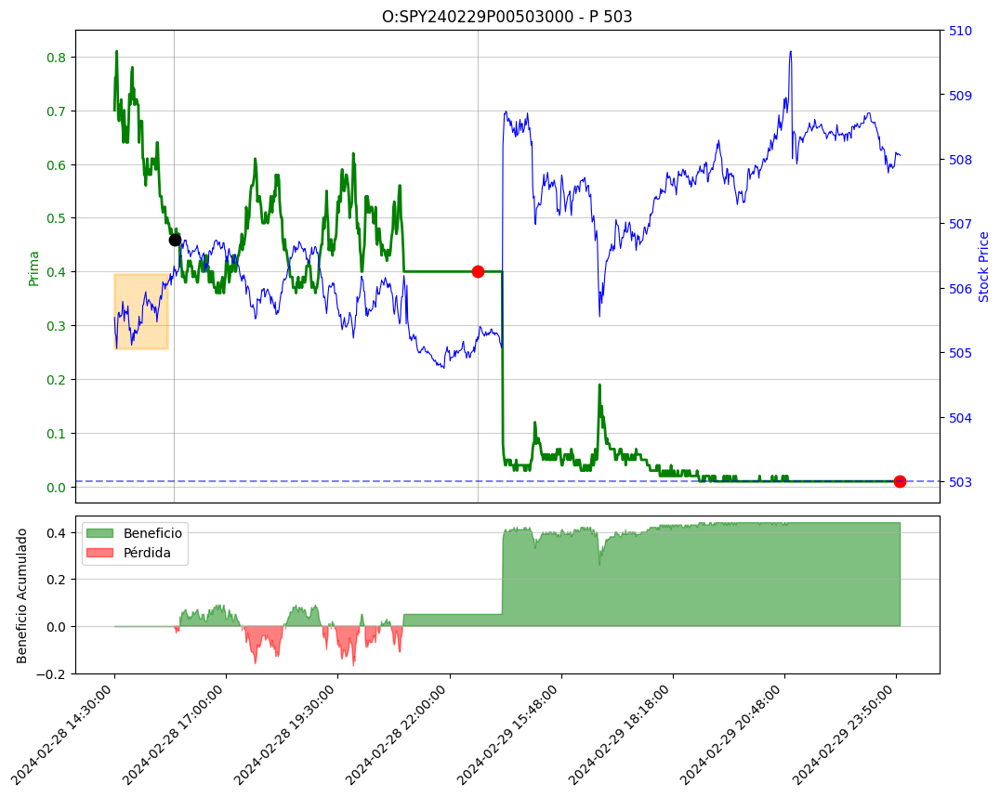

Trading Date:    2024-02-29
Expiration Date: 2024-03-01
Valor mínimo IB:     506.98
Valor máximo IB:     508.74
El SPY rompe el Mínimo del IB en la fila 124 con el valor 506.73
Vendemos el Stike 509
O:SPY240301C00509000 - C 509
Entramos en la fila: 124
Index(['v', 'vw', 'o', 'c', 'h', 'l', 't', 'n'], dtype='object')


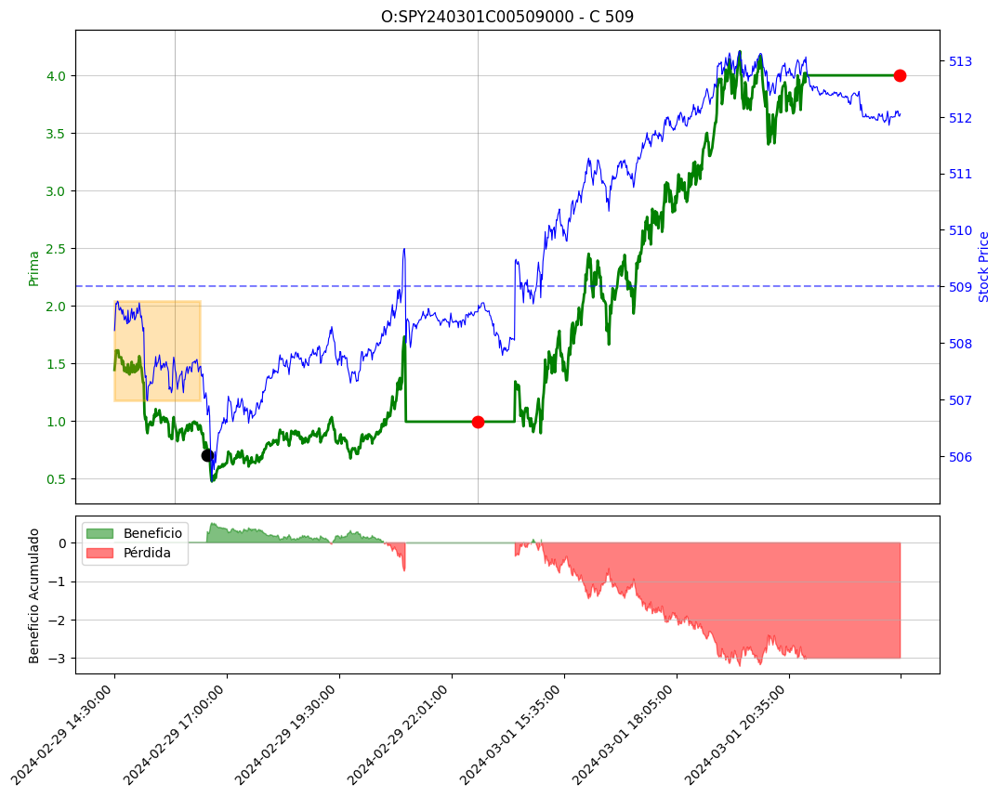

Trading Date:    2024-03-01
Expiration Date: 2024-03-04
Valor mínimo IB:     508.69
Valor máximo IB:     510.52
El SPY rompe el Máximo del IB en la fila 82 con el valor 510.53
Tenedencia Alcista-> Vender P
Vendemos el Stike 507
O:SPY240304P00507000 - P 507
Entramos en la fila: 82
Index(['v', 'vw', 'o', 'c', 'h', 'l', 't', 'n'], dtype='object')


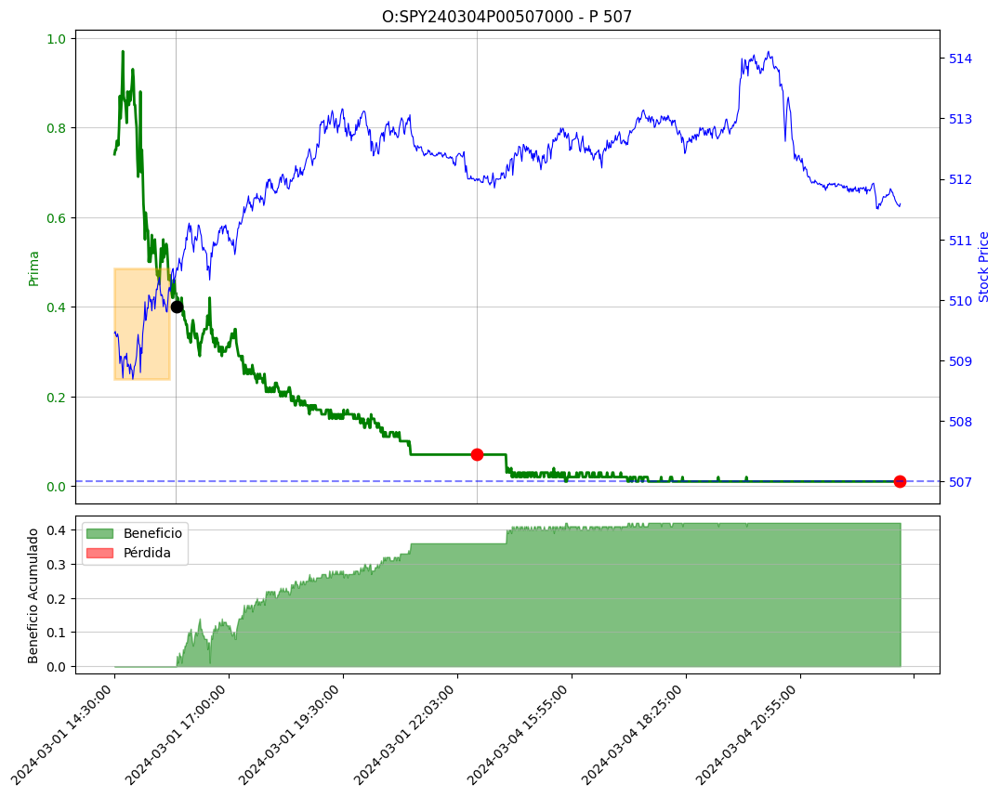

Trading Date:    2024-03-04
Expiration Date: 2024-03-05
Valor mínimo IB:     512.06
Valor máximo IB:     512.84
El SPY rompe el Máximo del IB en la fila 169 con el valor 512.86
Tenedencia Alcista-> Vender P
Vendemos el Stike 509
O:SPY240305P00509000 - P 509
Entramos en la fila: 169
Index(['v', 'vw', 'o', 'c', 'h', 'l', 't', 'n'], dtype='object')


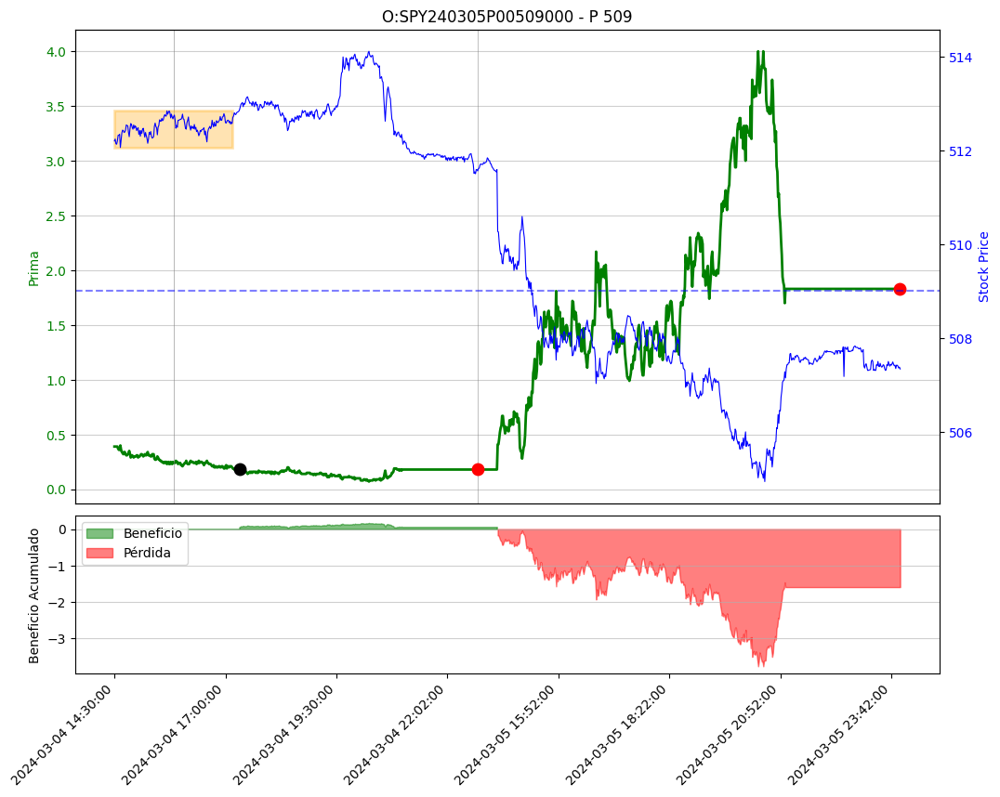

Trading Date:    2024-03-05
Expiration Date: 2024-03-06
Valor mínimo IB:     507.53
Valor máximo IB:     510.59
El SPY rompe el Mínimo del IB en la fila 133 con el valor 507.03
Vendemos el Stike 510
O:SPY240306C00510000 - C 510
Entramos en la fila: 133
Index(['v', 'vw', 'o', 'c', 'h', 'l', 't', 'n'], dtype='object')


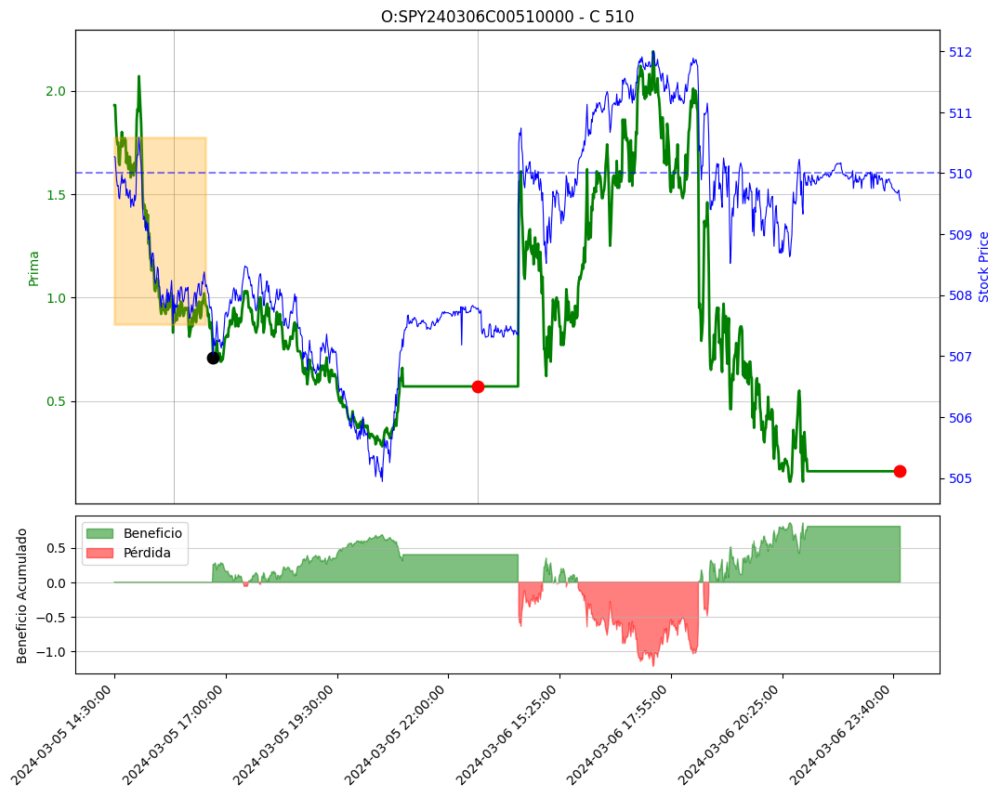

Trading Date:    2024-03-06
Expiration Date: 2024-03-07
Valor mínimo IB:     508.52
Valor máximo IB:     510.74
El SPY rompe el Máximo del IB en la fila 91 con el valor 510.85
Tenedencia Alcista-> Vender P
Vendemos el Stike 507
O:SPY240307P00507000 - P 507
Entramos en la fila: 91
Index(['v', 'vw', 'o', 'c', 'h', 'l', 't', 'n'], dtype='object')


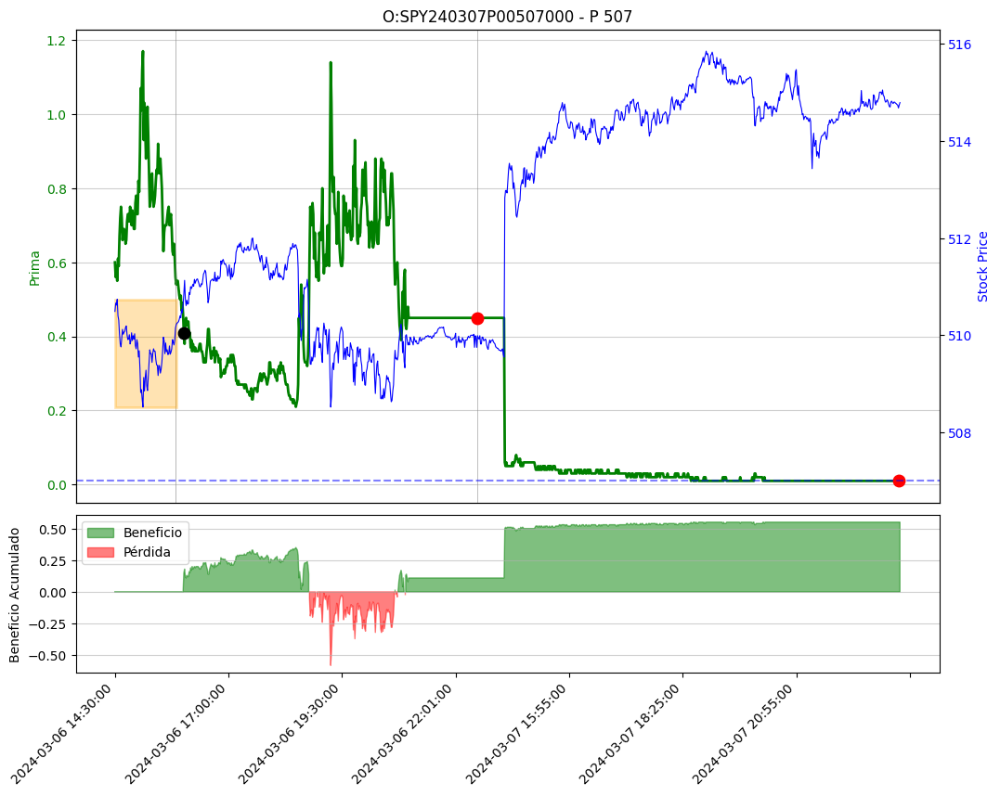

Trading Date:    2024-03-07
Expiration Date: 2024-03-08
Valor mínimo IB:     512.43
Valor máximo IB:     514.79
El SPY rompe el Máximo del IB en la fila 166 con el valor 514.81
Tenedencia Alcista-> Vender P
Vendemos el Stike 511
O:SPY240308P00511000 - P 511
Entramos en la fila: 166
Index(['v', 'vw', 'o', 'c', 'h', 'l', 't', 'n'], dtype='object')


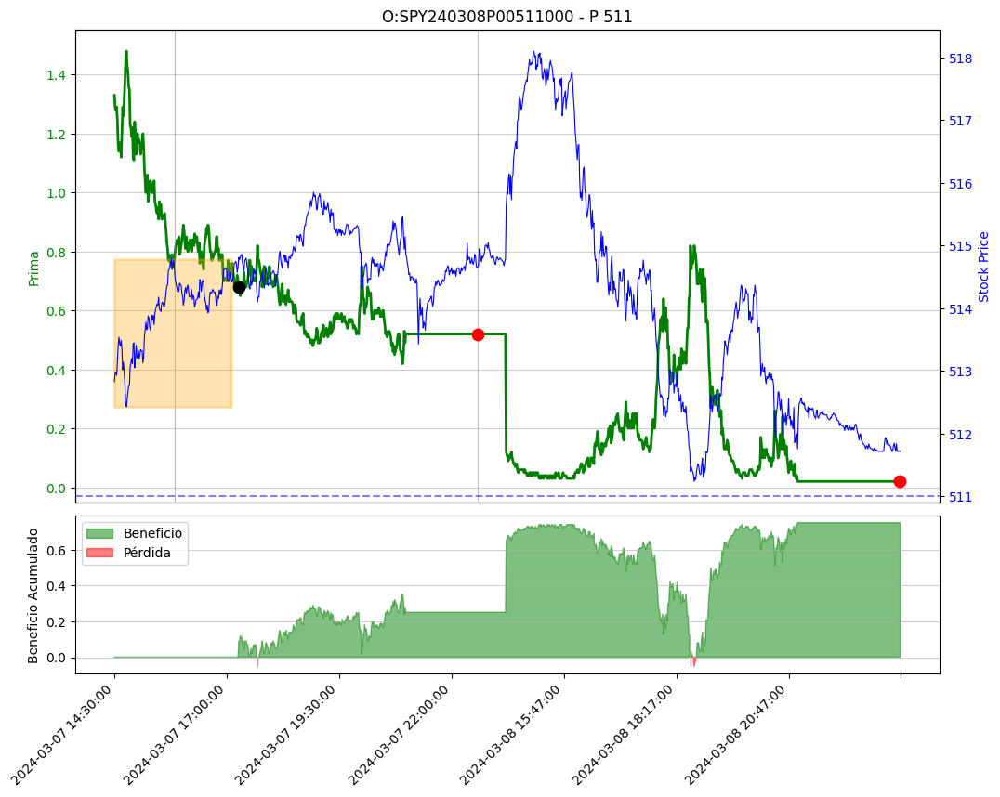

Trading Date:    2024-03-08
Expiration Date: 2024-03-11
Valor mínimo IB:     515.64
Valor máximo IB:     518.1
El SPY rompe el Mínimo del IB en la fila 107 con el valor 515.52
Vendemos el Stike 518
O:SPY240311C00518000 - C 518
Entramos en la fila: 107
Index(['v', 'vw', 'o', 'c', 'h', 'l', 't', 'n'], dtype='object')


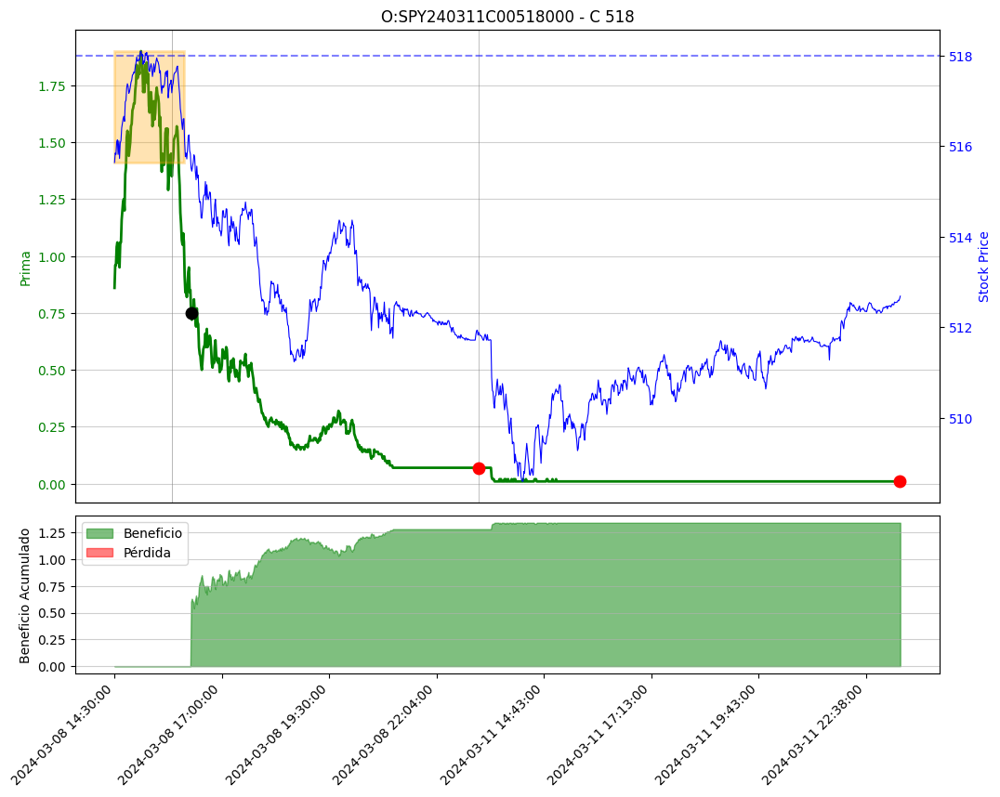

Trading Date:    2024-03-11
Expiration Date: 2024-03-12
Valor mínimo IB:     508.6
Valor máximo IB:     510.9
El SPY rompe el Máximo del IB en la fila 191 con el valor 511.11
Tenedencia Alcista-> Vender P
Vendemos el Stike 508
O:SPY240312P00508000 - P 508
Entramos en la fila: 191
Index(['v', 'vw', 'o', 'c', 'h', 'l', 't', 'n'], dtype='object')


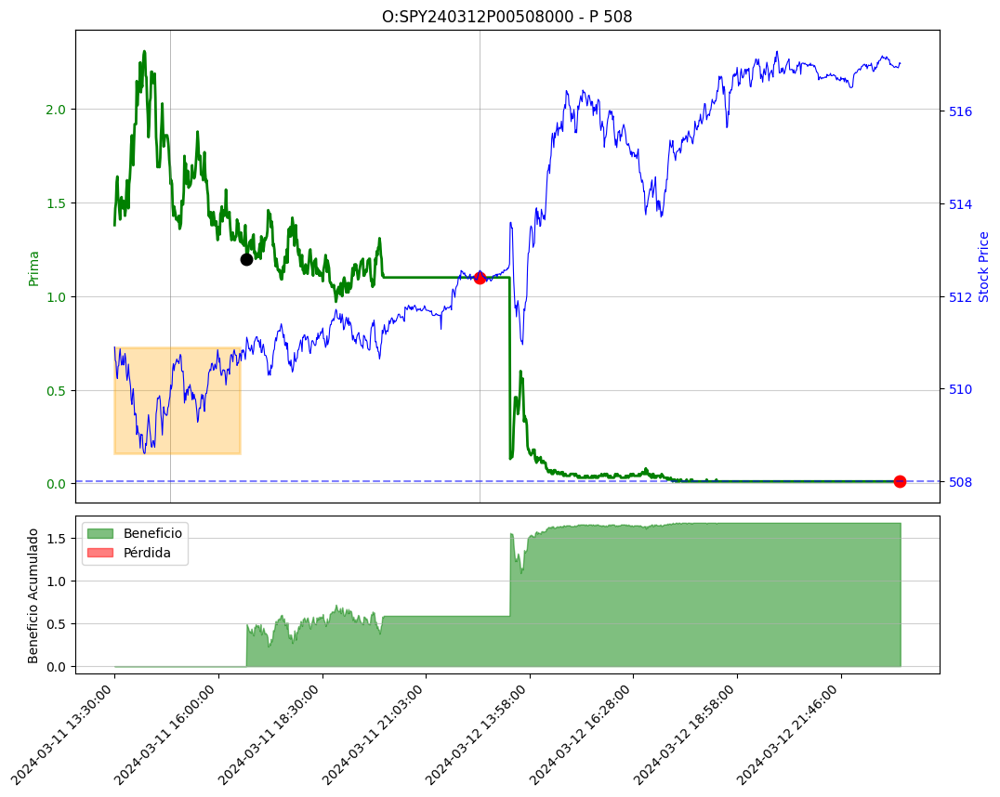

Trading Date:    2024-03-12
Expiration Date: 2024-03-13
Valor mínimo IB:     510.95
Valor máximo IB:     516.13
El SPY rompe el Máximo del IB en la fila 81 con el valor 516.43
Tenedencia Alcista-> Vender P
Vendemos el Stike 513
O:SPY240313P00513000 - P 513
Entramos en la fila: 81
Index(['v', 'vw', 'o', 'c', 'h', 'l', 't', 'n'], dtype='object')


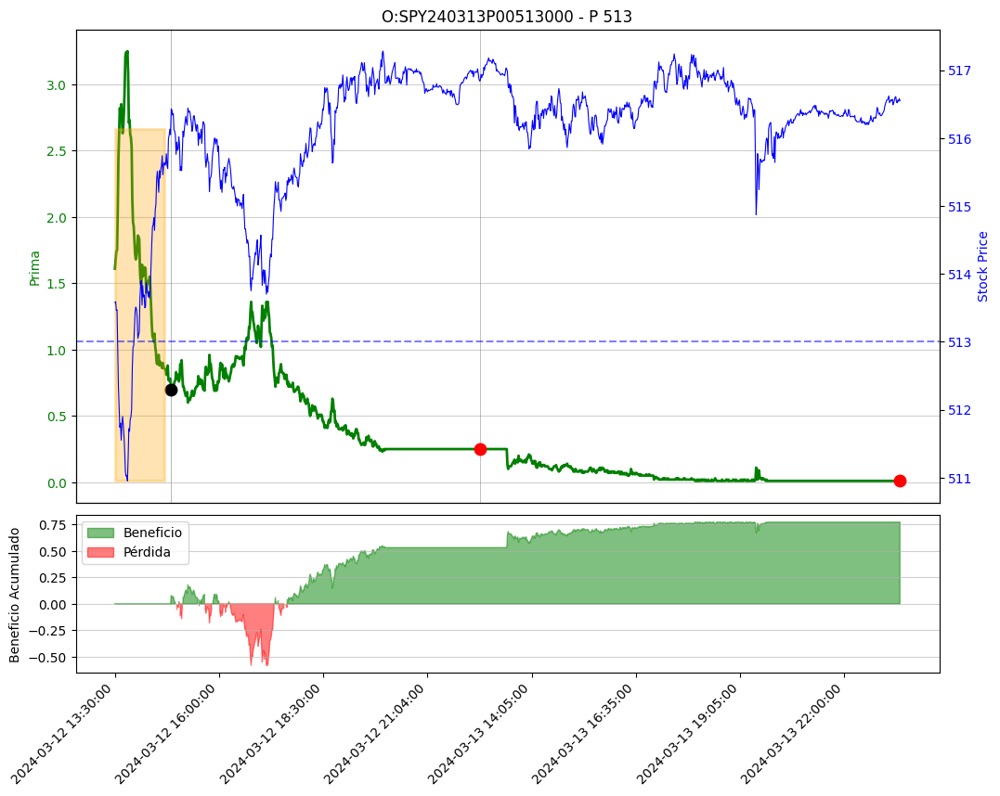

Trading Date:    2024-03-13
Expiration Date: 2024-03-14
Valor mínimo IB:     515.84
Valor máximo IB:     516.98
El SPY rompe el Máximo del IB en la fila 217 con el valor 516.99
Tenedencia Alcista-> Vender P
Vendemos el Stike 513
O:SPY240314P00513000 - P 513
Entramos en la fila: 217
Index(['v', 'vw', 'o', 'c', 'h', 'l', 't', 'n'], dtype='object')


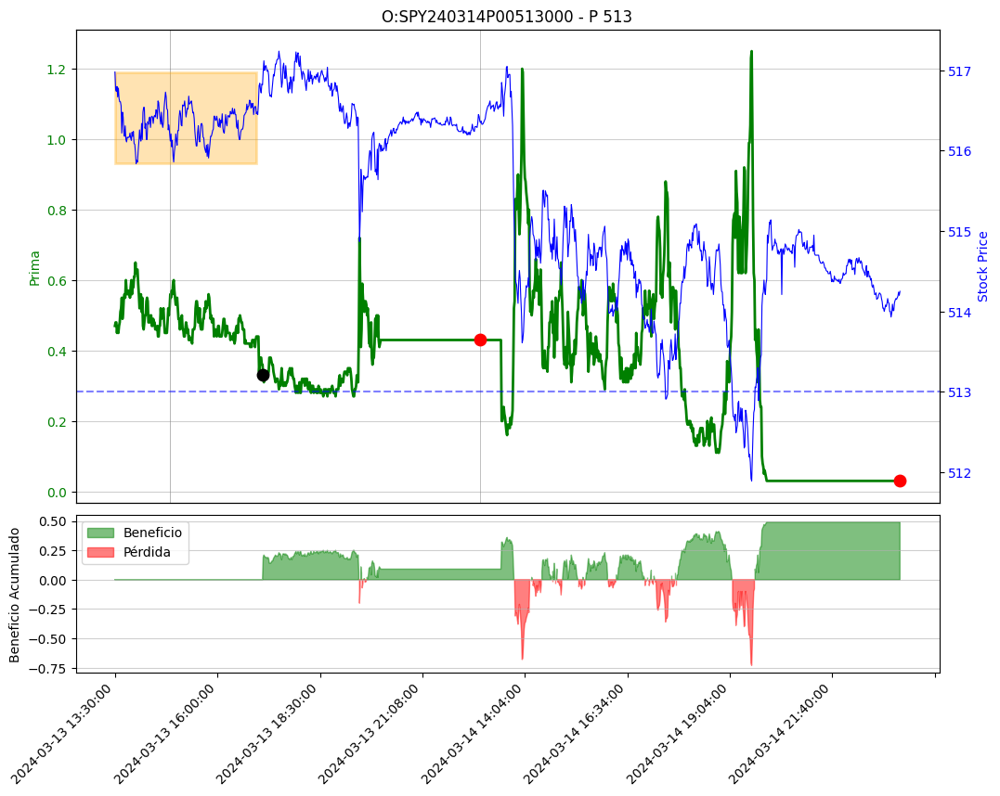

Trading Date:    2024-03-14
Expiration Date: 2024-03-15
Valor mínimo IB:     513.61
Valor máximo IB:     517.05
El SPY rompe el Mínimo del IB en la fila 227 con el valor 513.39
Vendemos el Stike 516
O:SPY240315C00516000 - C 516
Entramos en la fila: 227
Index(['v', 'vw', 'o', 'c', 'h', 'l', 't', 'n'], dtype='object')


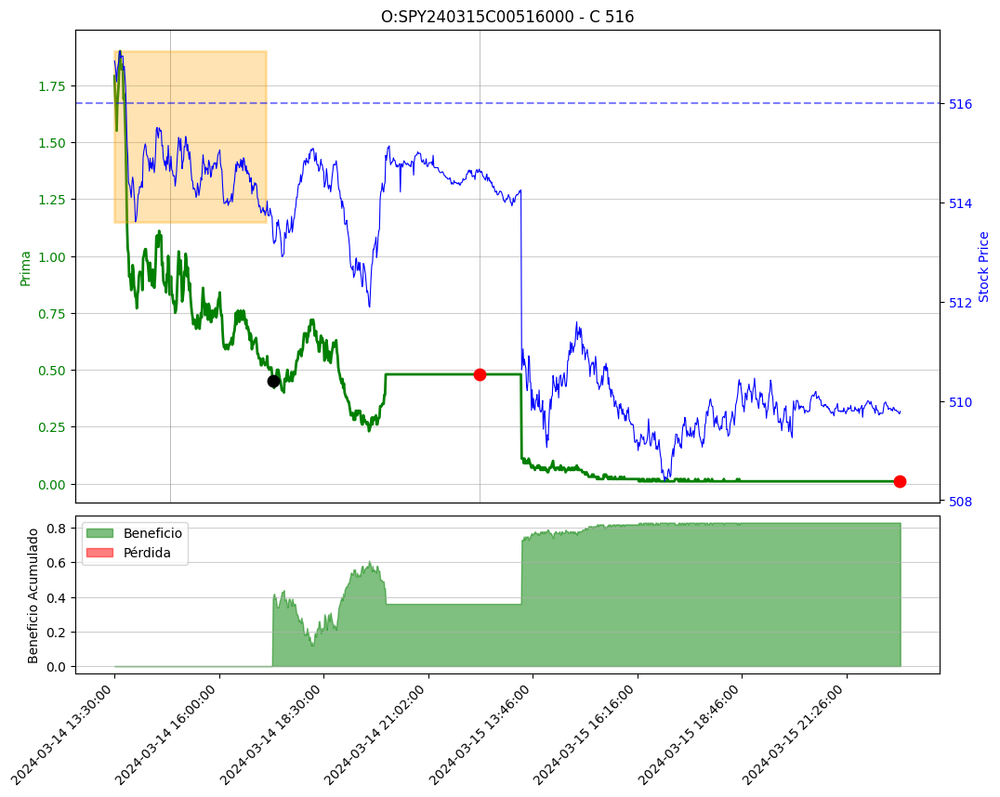

Trading Date:    2024-03-15
Expiration Date: 2024-03-18
Valor mínimo IB:     509.06
Valor máximo IB:     511.59
El SPY rompe el Mínimo del IB en la fila 167 con el valor 509.0
Vendemos el Stike 512
O:SPY240318C00512000 - C 512
Entramos en la fila: 167
Index(['v', 'vw', 'o', 'c', 'h', 'l', 't', 'n'], dtype='object')


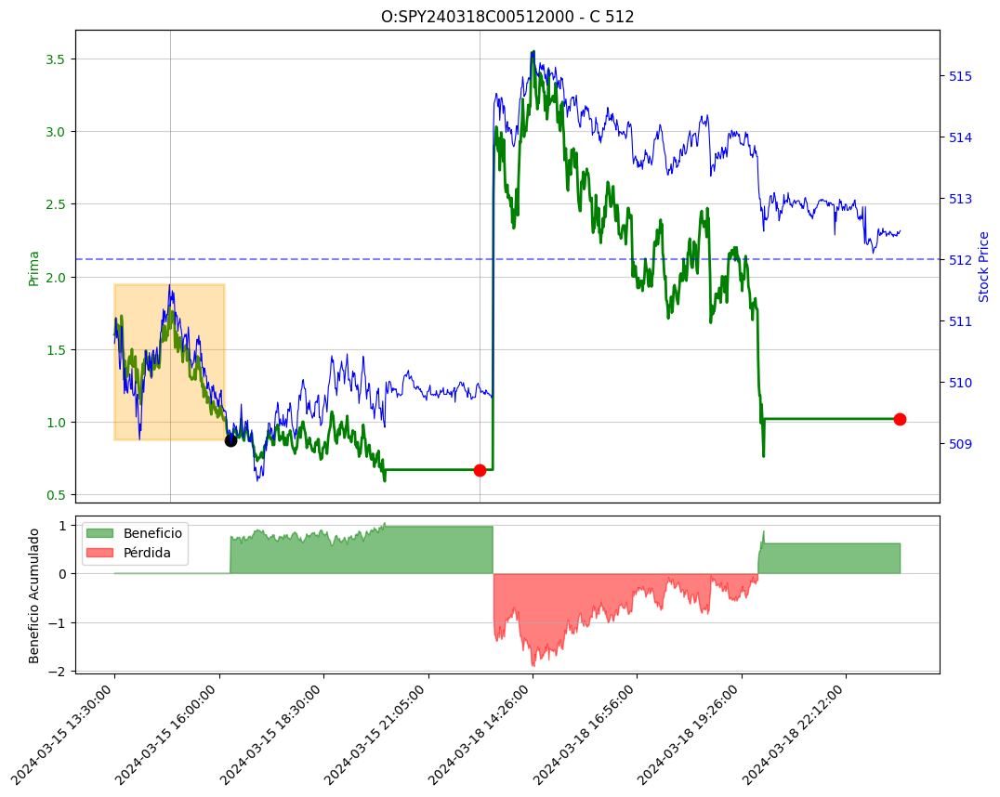

Trading Date:    2024-03-18
Expiration Date: 2024-03-19
Valor mínimo IB:     513.84
Valor máximo IB:     515.4
El SPY rompe el Mínimo del IB en la fila 200 con el valor 513.69
Vendemos el Stike 516
O:SPY240319C00516000 - C 516
Entramos en la fila: 200
Index(['v', 'vw', 'o', 'c', 'h', 'l', 't', 'n'], dtype='object')


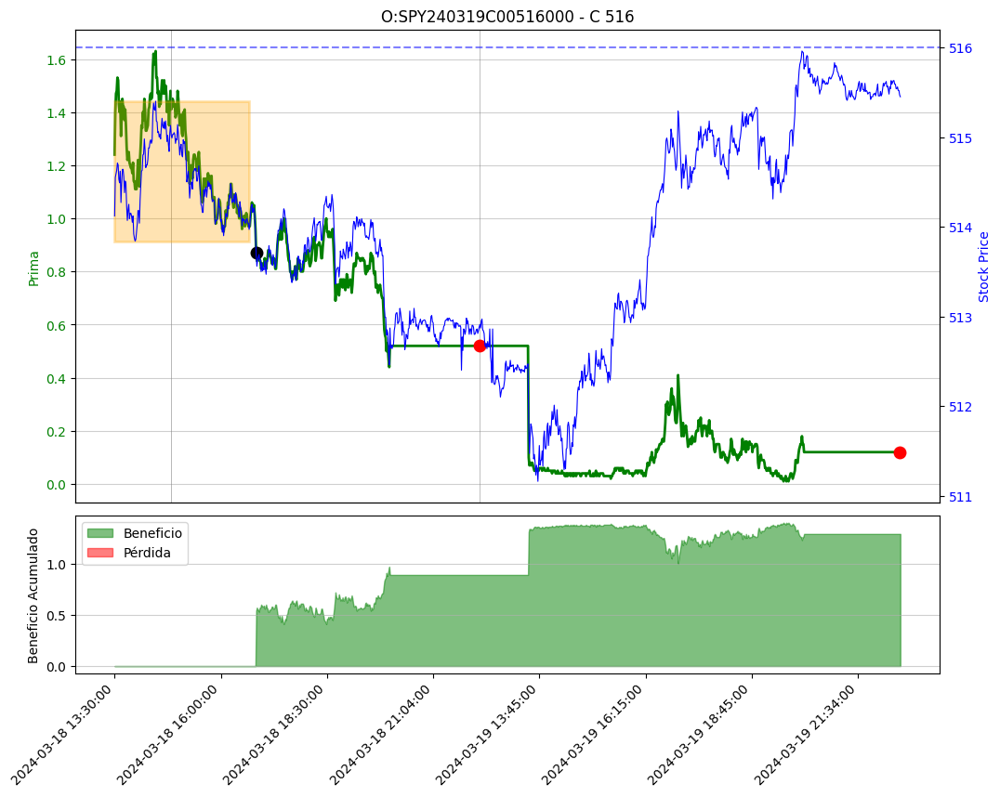

Trading Date:    2024-03-19
Expiration Date: 2024-03-20
Valor mínimo IB:     511.16
Valor máximo IB:     512.46
El SPY rompe el Máximo del IB en la fila 85 con el valor 512.59
Tenedencia Alcista-> Vender P
Vendemos el Stike 509
O:SPY240320P00509000 - P 509
Entramos en la fila: 85
Index(['v', 'vw', 'o', 'c', 'h', 'l', 't', 'n'], dtype='object')


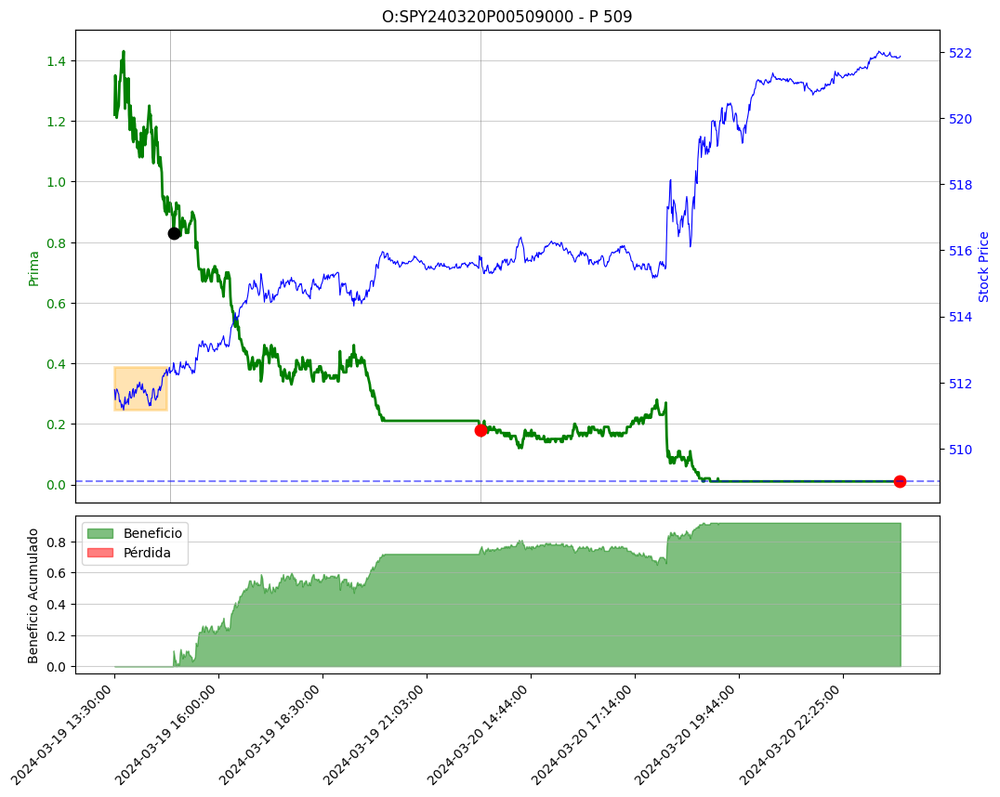

Trading Date:    2024-03-20
Expiration Date: 2024-03-21
Valor mínimo IB:     515.29
Valor máximo IB:     516.4
El SPY rompe el Mínimo del IB en la fila 250 con el valor 515.16
Vendemos el Stike 518
O:SPY240321C00518000 - C 518
Entramos en la fila: 250
Index(['v', 'vw', 'o', 'c', 'h', 'l', 't', 'n'], dtype='object')


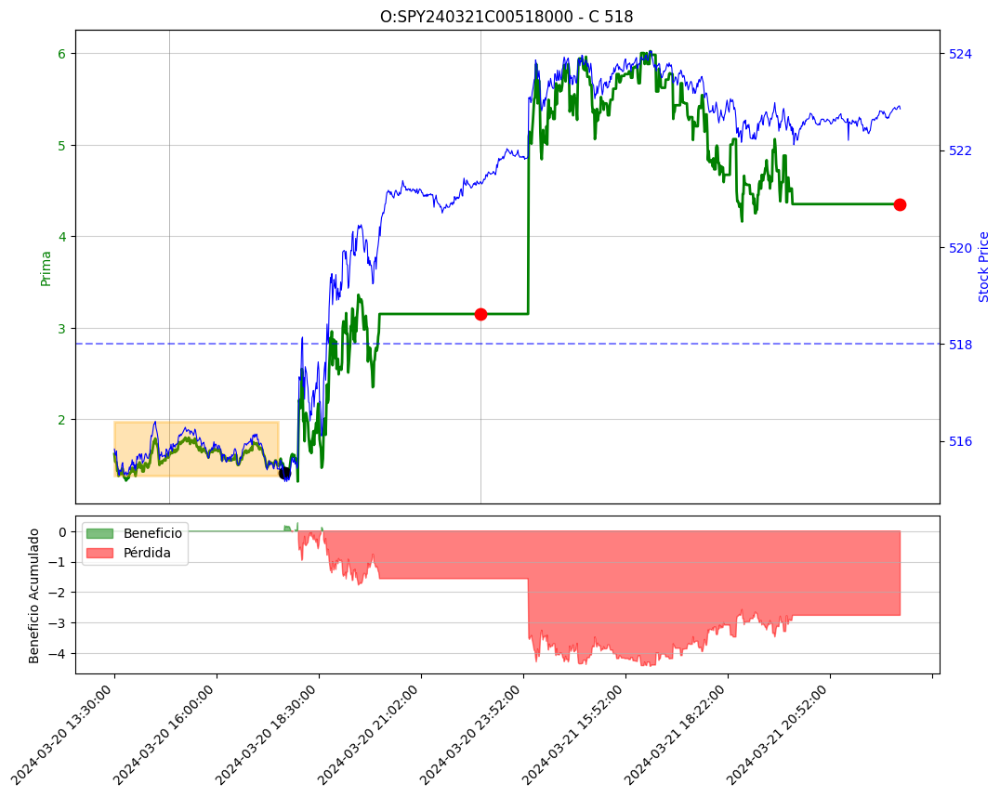

Trading Date:    2024-03-21
Expiration Date: 2024-03-22
Valor mínimo IB:     522.81
Valor máximo IB:     523.96
El SPY rompe el Máximo del IB en la fila 177 con el valor 524.02
Tenedencia Alcista-> Vender P
Vendemos el Stike 521
O:SPY240322P00521000 - P 521
Entramos en la fila: 177
Index(['v', 'vw', 'o', 'c', 'h', 'l', 't', 'n'], dtype='object')


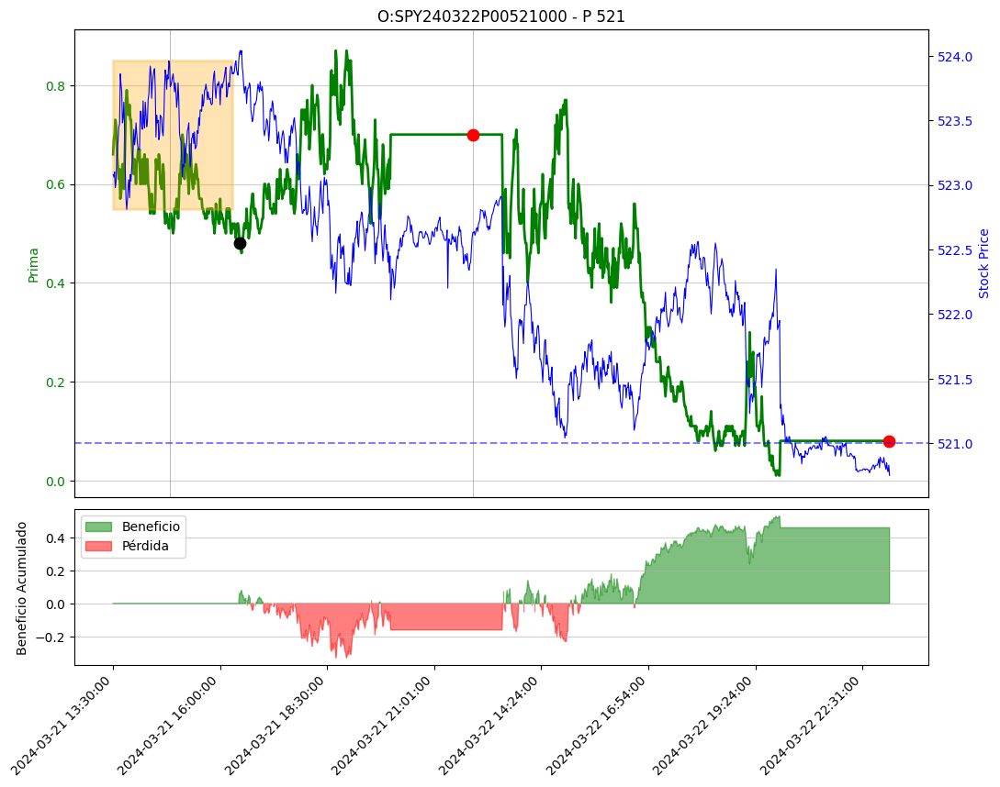

Trading Date:    2024-03-22
Expiration Date: 2024-03-25
Valor mínimo IB:     521.14
Valor máximo IB:     522.37
El SPY rompe el Mínimo del IB en la fila 81 con el valor 521.12
Vendemos el Stike 524
O:SPY240325C00524000 - C 524
Entramos en la fila: 81
Index(['v', 'vw', 'o', 'c', 'h', 'l', 't', 'n'], dtype='object')


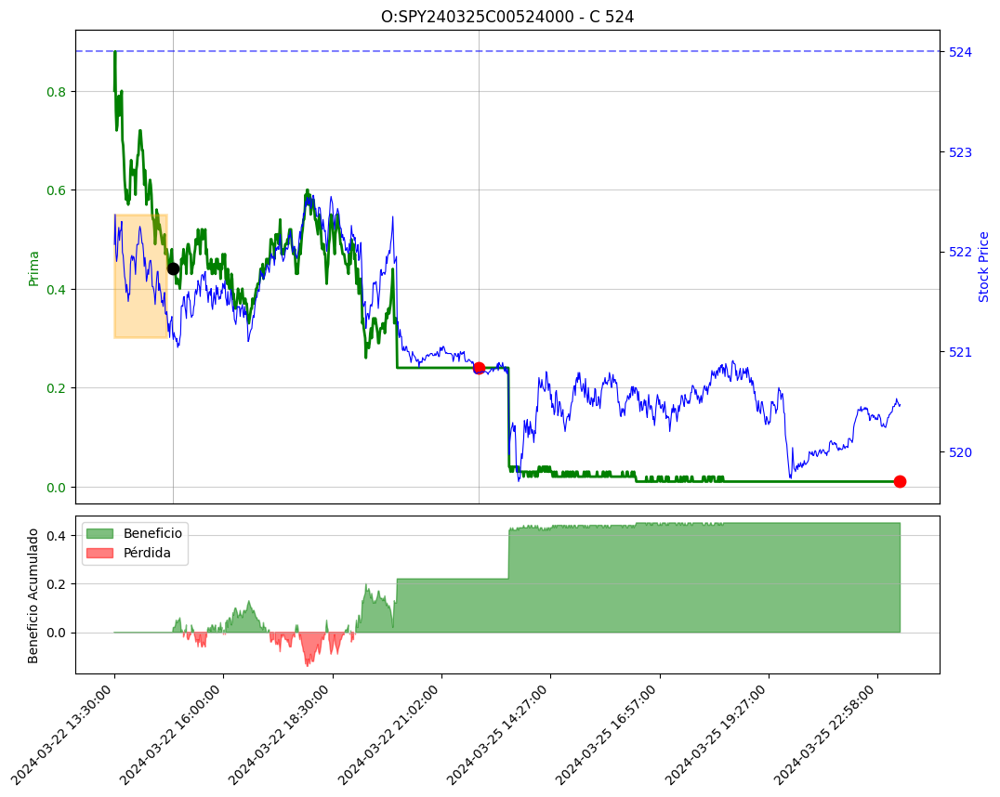

Trading Date:    2024-03-25
Expiration Date: 2024-03-26
Valor mínimo IB:     519.7
Valor máximo IB:     520.8
El SPY rompe el Máximo del IB en la fila 279 con el valor 520.81
Tenedencia Alcista-> Vender P
Vendemos el Stike 517
O:SPY240326P00517000 - P 517
Entramos en la fila: 279
Index(['v', 'vw', 'o', 'c', 'h', 'l', 't', 'n'], dtype='object')


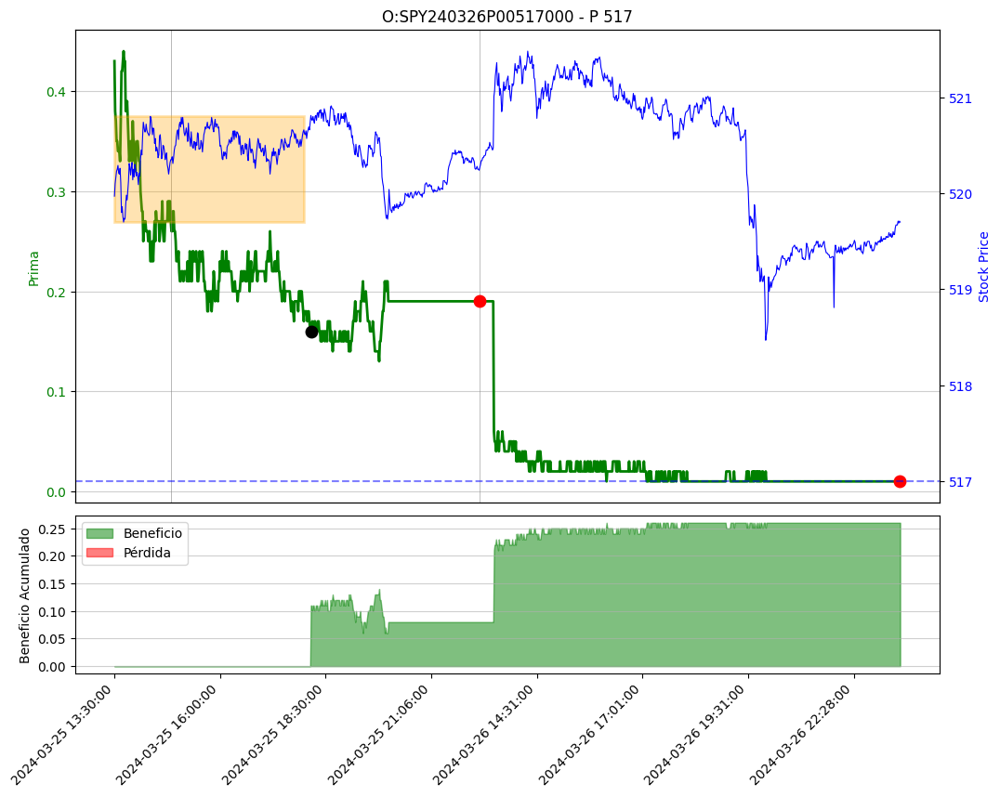

Trading Date:    2024-03-26
Expiration Date: 2024-03-27
Valor mínimo IB:     520.78
Valor máximo IB:     521.48
El SPY rompe el Mínimo del IB en la fila 211 con el valor 520.77
Vendemos el Stike 523
O:SPY240327C00523000 - C 523
Entramos en la fila: 211
Index(['v', 'vw', 'o', 'c', 'h', 'l', 't', 'n'], dtype='object')


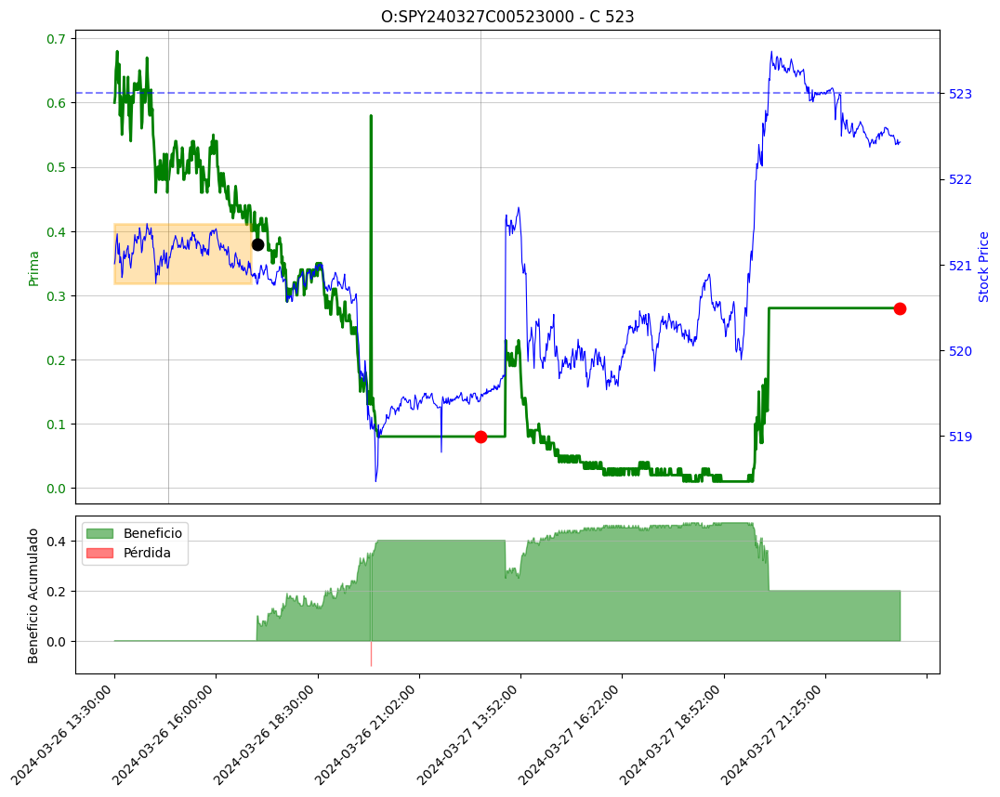

Trading Date:    2024-03-27
Expiration Date: 2024-03-28
Valor mínimo IB:     519.67
Valor máximo IB:     521.67
El SPY rompe el Mínimo del IB en la fila 121 con el valor 519.57
Vendemos el Stike 522
O:SPY240328C00522000 - C 522
Entramos en la fila: 121
Index(['v', 'vw', 'o', 'c', 'h', 'l', 't', 'n'], dtype='object')


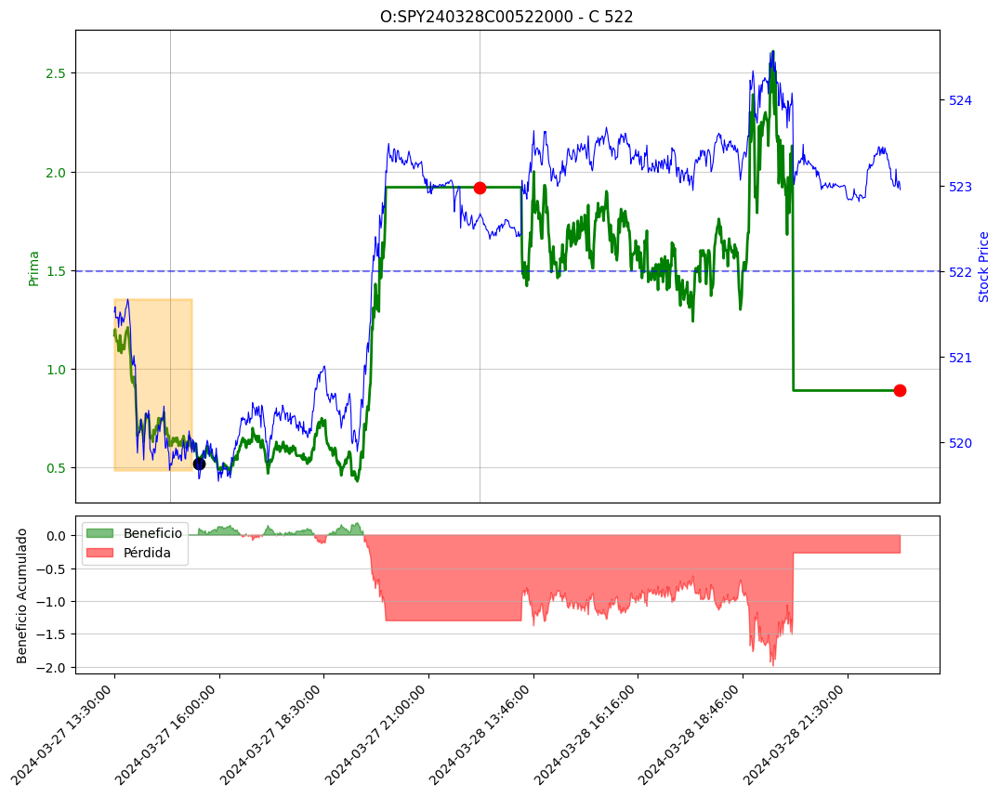

Trading Date:    2024-03-28
Expiration Date: 2024-03-29
Valor mínimo IB:     522.84
Valor máximo IB:     523.64
El SPY rompe el Máximo del IB en la fila 121 con el valor 523.68
Tenedencia Alcista-> Vender P
Vendemos el Stike 520
O:SPY240329P00520000 - P 520
Entramos en la fila: 121
Trading Date:    2024-03-29
Expiration Date: 2024-04-01
Valor mínimo IB:     522.33
Valor máximo IB:     524.34
El SPY rompe el Mínimo del IB en la fila 81 con el valor 522.24
Vendemos el Stike 525
O:SPY240401C00525000 - C 525
Entramos en la fila: 81
Index(['v', 'vw', 'o', 'c', 'h', 'l', 't', 'n'], dtype='object')


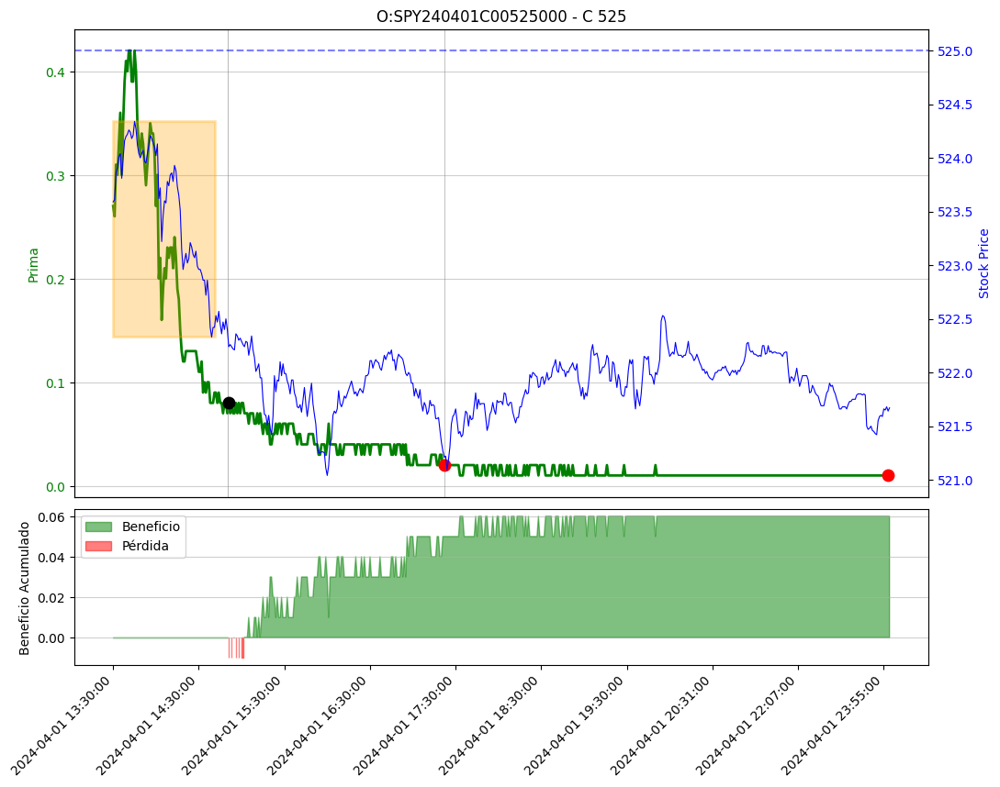

Trading Date:    2024-04-01
Expiration Date: 2024-04-02
Valor mínimo IB:     522.33
Valor máximo IB:     524.34
El SPY rompe el Mínimo del IB en la fila 81 con el valor 522.24
Vendemos el Stike 525
O:SPY240402C00525000 - C 525
Entramos en la fila: 81
Index(['v', 'vw', 'o', 'c', 'h', 'l', 't', 'n'], dtype='object')


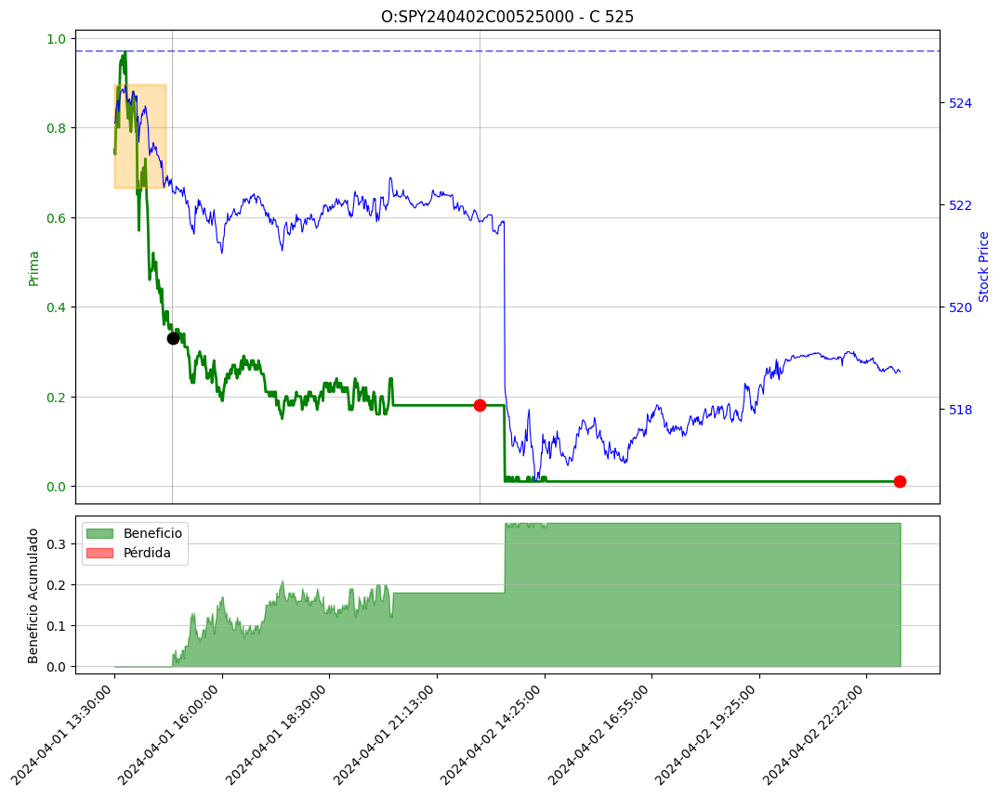

Trading Date:    2024-04-02
Expiration Date: 2024-04-03
Valor mínimo IB:     516.58
Valor máximo IB:     518.42
El SPY rompe el Máximo del IB en la fila 335 con el valor 518.5
Tenedencia Alcista-> Vender P
Vendemos el Stike 515
O:SPY240403P00515000 - P 515
Entramos en la fila: 335
Index(['v', 'vw', 'o', 'c', 'h', 'l', 't', 'n'], dtype='object')


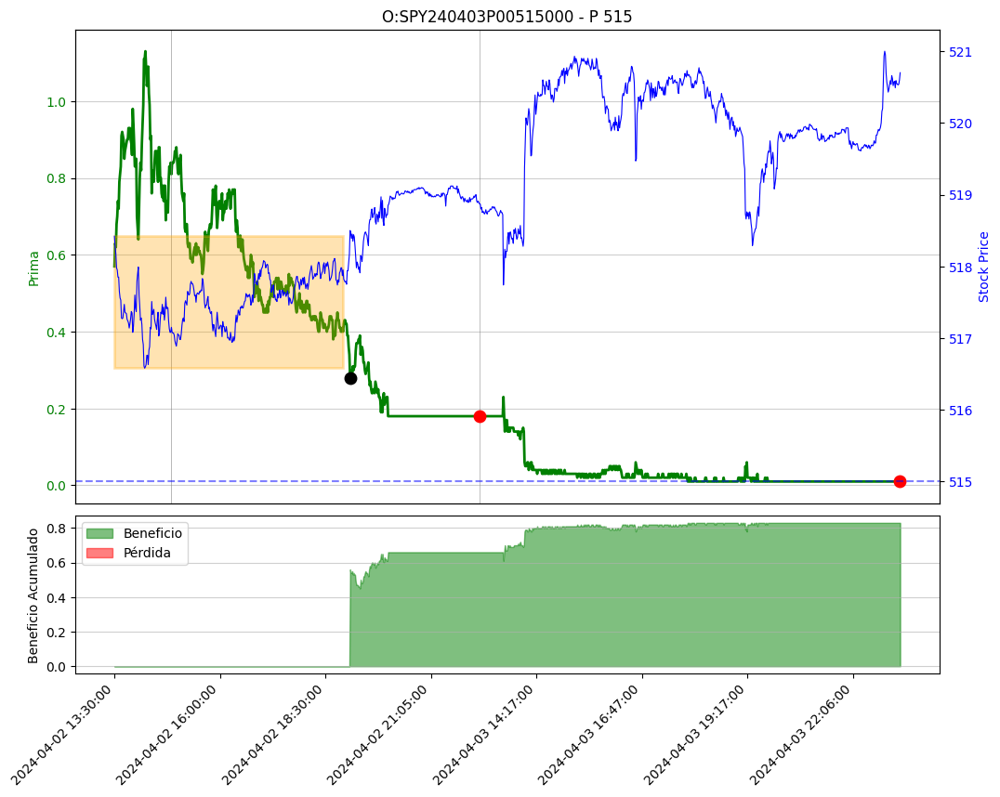

Trading Date:    2024-04-03
Expiration Date: 2024-04-04
Valor mínimo IB:     517.74
Valor máximo IB:     520.61
El SPY rompe el Máximo del IB en la fila 81 con el valor 520.64
Tenedencia Alcista-> Vender P
Vendemos el Stike 517
O:SPY240404P00517000 - P 517
Entramos en la fila: 81
Index(['v', 'vw', 'o', 'c', 'h', 'l', 't', 'n'], dtype='object')


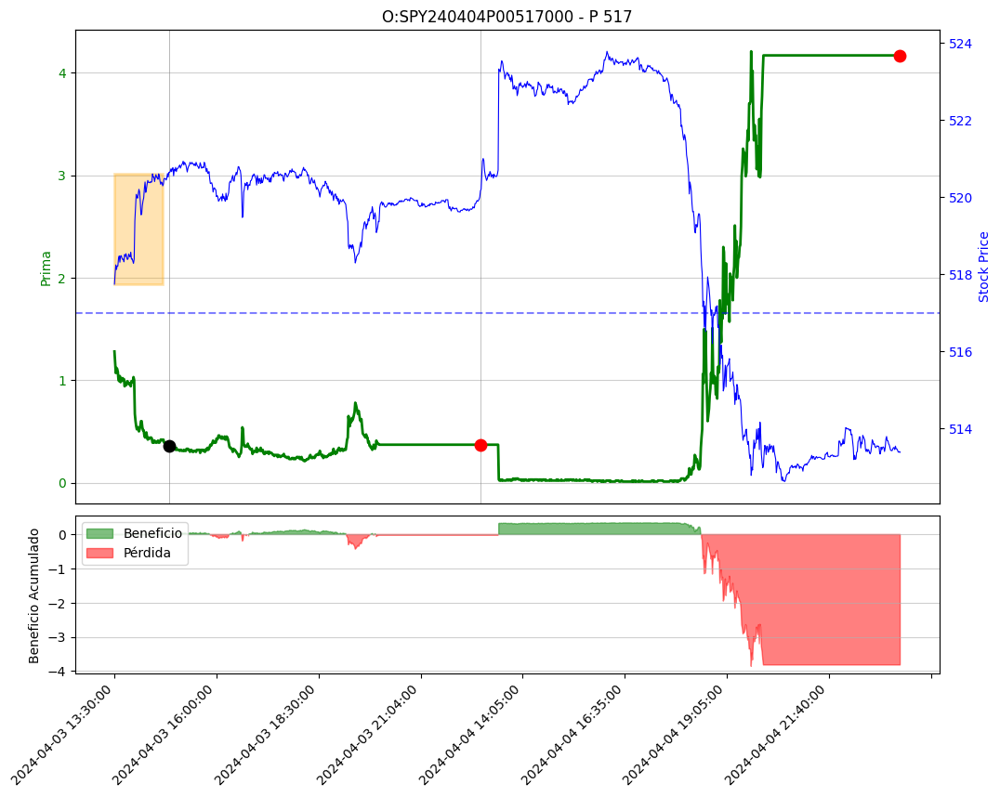

Trading Date:    2024-04-04
Expiration Date: 2024-04-05
Valor mínimo IB:     522.61
Valor máximo IB:     523.53
El SPY rompe el Mínimo del IB en la fila 102 con el valor 522.4
Vendemos el Stike 525
O:SPY240405C00525000 - C 525
Entramos en la fila: 102
Index(['v', 'vw', 'o', 'c', 'h', 'l', 't', 'n'], dtype='object')


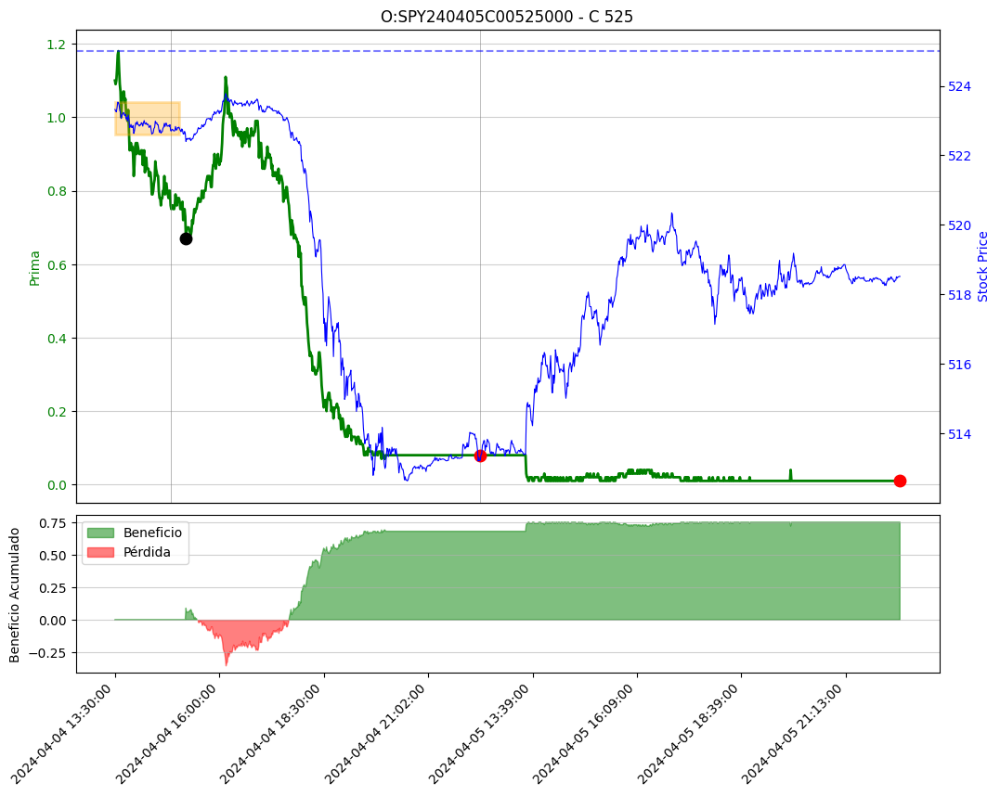

Trading Date:    2024-04-05
Expiration Date: 2024-04-08
Valor mínimo IB:     514.21
Valor máximo IB:     517.03
El SPY rompe el Máximo del IB en la fila 81 con el valor 517.39
Tenedencia Alcista-> Vender P
Vendemos el Stike 514
O:SPY240408P00514000 - P 514
Entramos en la fila: 81
Index(['v', 'vw', 'o', 'c', 'h', 'l', 't', 'n'], dtype='object')


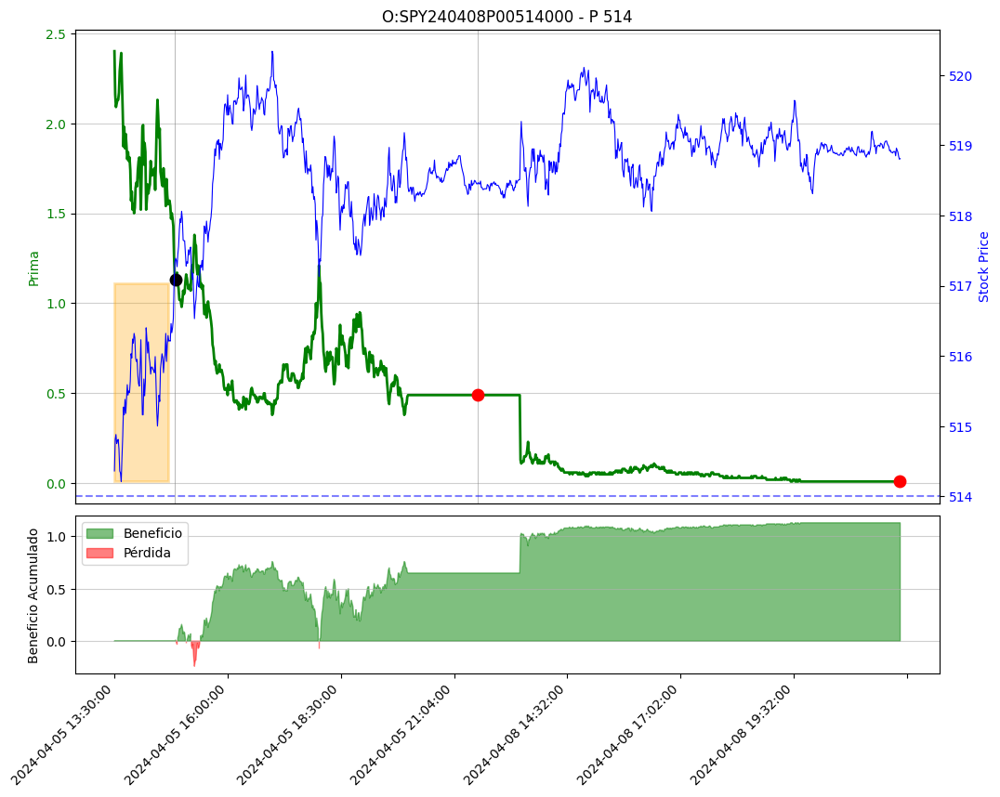

Trading Date:    2024-04-08
Expiration Date: 2024-04-09
Valor mínimo IB:     518.13
Valor máximo IB:     519.95
El SPY rompe el Máximo del IB en la fila 81 con el valor 520.04
Tenedencia Alcista-> Vender P
Vendemos el Stike 517
O:SPY240409P00517000 - P 517
Entramos en la fila: 81
Index(['v', 'vw', 'o', 'c', 'h', 'l', 't', 'n'], dtype='object')


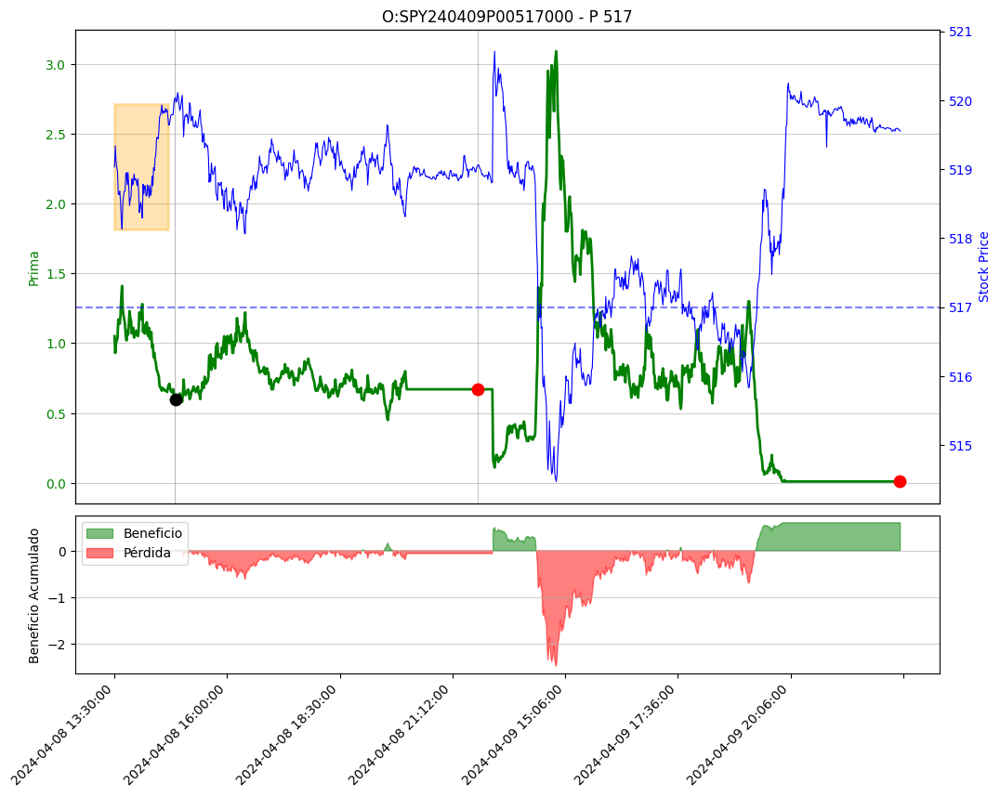

Trading Date:    2024-04-09
Expiration Date: 2024-04-10
Valor mínimo IB:     514.58
Valor máximo IB:     520.71
El SPY rompe el Mínimo del IB en la fila 83 con el valor 514.52
Vendemos el Stike 517
O:SPY240410C00517000 - C 517
Entramos en la fila: 83
Index(['v', 'vw', 'o', 'c', 'h', 'l', 't', 'n'], dtype='object')


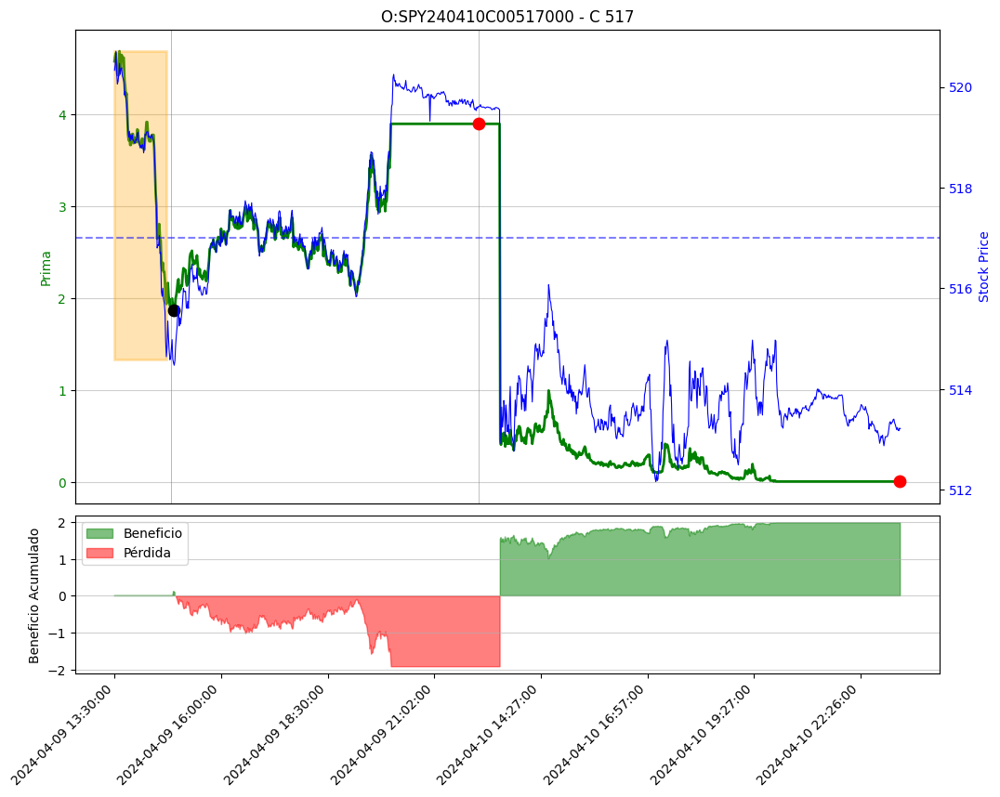

Trading Date:    2024-04-10
Expiration Date: 2024-04-11
Valor mínimo IB:     512.76
Valor máximo IB:     516.07
El SPY rompe el Mínimo del IB en la fila 215 con el valor 512.48
Vendemos el Stike 515
O:SPY240411C00515000 - C 515
Entramos en la fila: 215
Index(['v', 'vw', 'o', 'c', 'h', 'l', 't', 'n'], dtype='object')


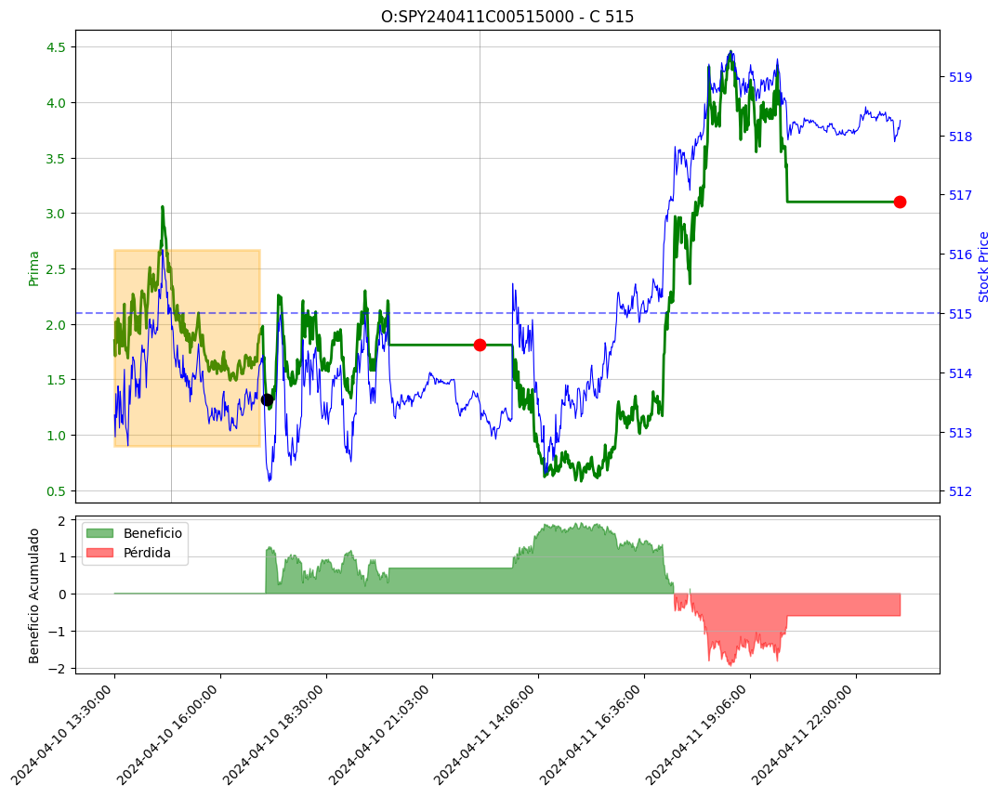

Trading Date:    2024-04-11
Expiration Date: 2024-04-12
Valor mínimo IB:     512.29
Valor máximo IB:     515.5
El SPY rompe el Máximo del IB en la fila 199 con el valor 515.58
Tenedencia Alcista-> Vender P
Vendemos el Stike 512
O:SPY240412P00512000 - P 512
Entramos en la fila: 199
Index(['v', 'vw', 'o', 'c', 'h', 'l', 't', 'n'], dtype='object')


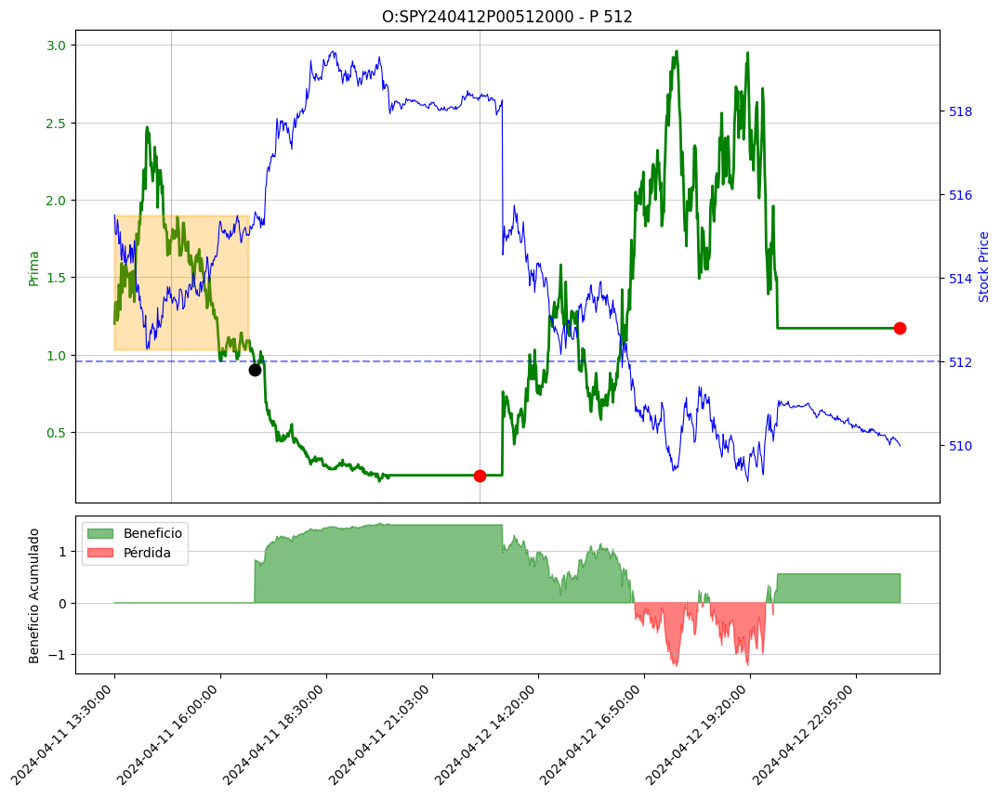

Trading Date:    2024-04-12
Expiration Date: 2024-04-15
Valor mínimo IB:     512.54
Valor máximo IB:     515.74
El SPY rompe el Mínimo del IB en la fila 81 con el valor 512.38
Vendemos el Stike 515
O:SPY240415C00515000 - C 515
Entramos en la fila: 81
Index(['v', 'vw', 'o', 'c', 'h', 'l', 't', 'n'], dtype='object')


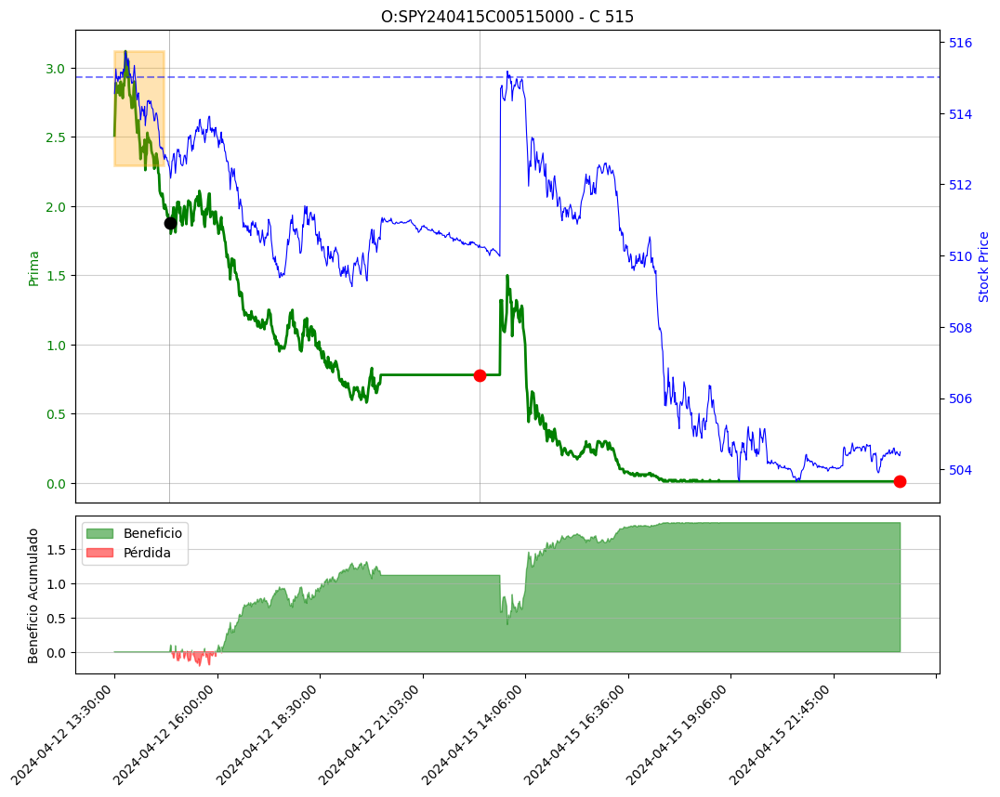

Trading Date:    2024-04-15
Expiration Date: 2024-04-16
Valor mínimo IB:     511.58
Valor máximo IB:     515.18
El SPY rompe el Mínimo del IB en la fila 83 con el valor 511.38
Vendemos el Stike 514
O:SPY240416C00514000 - C 514
Entramos en la fila: 83
Index(['v', 'vw', 'o', 'c', 'h', 'l', 't', 'n'], dtype='object')


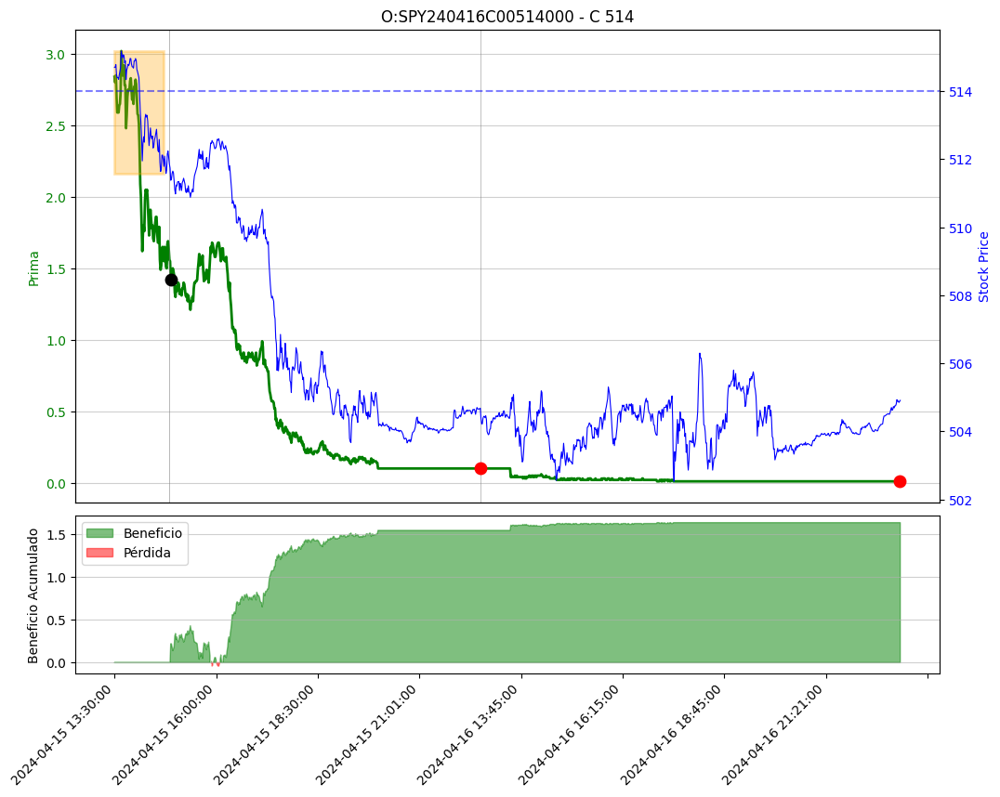

Trading Date:    2024-04-16
Expiration Date: 2024-04-17
Valor mínimo IB:     502.56
Valor máximo IB:     505.19
El SPY rompe el Máximo del IB en la fila 144 con el valor 505.3
Tenedencia Alcista-> Vender P
Vendemos el Stike 502
O:SPY240417P00502000 - P 502
Entramos en la fila: 144
Index(['v', 'vw', 'o', 'c', 'h', 'l', 't', 'n'], dtype='object')


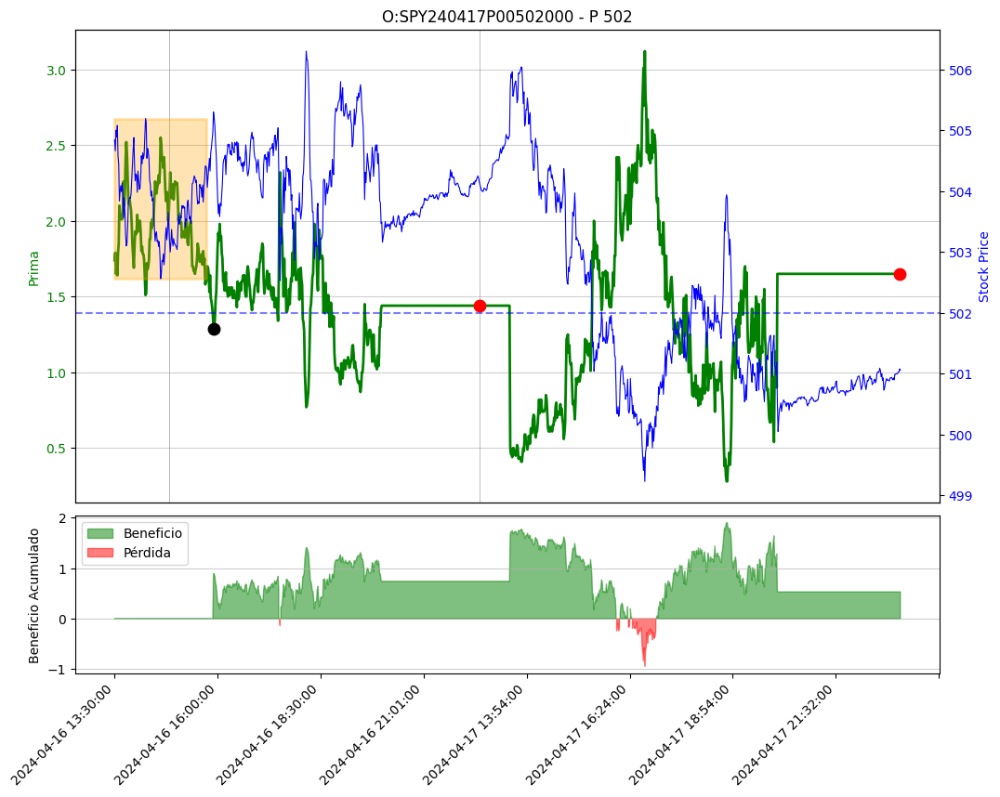

Trading Date:    2024-04-17
Expiration Date: 2024-04-18
Valor mínimo IB:     503.64
Valor máximo IB:     506.04
El SPY rompe el Mínimo del IB en la fila 81 con el valor 503.13
Vendemos el Stike 506
O:SPY240418C00506000 - C 506
Entramos en la fila: 81
Index(['v', 'vw', 'o', 'c', 'h', 'l', 't', 'n'], dtype='object')


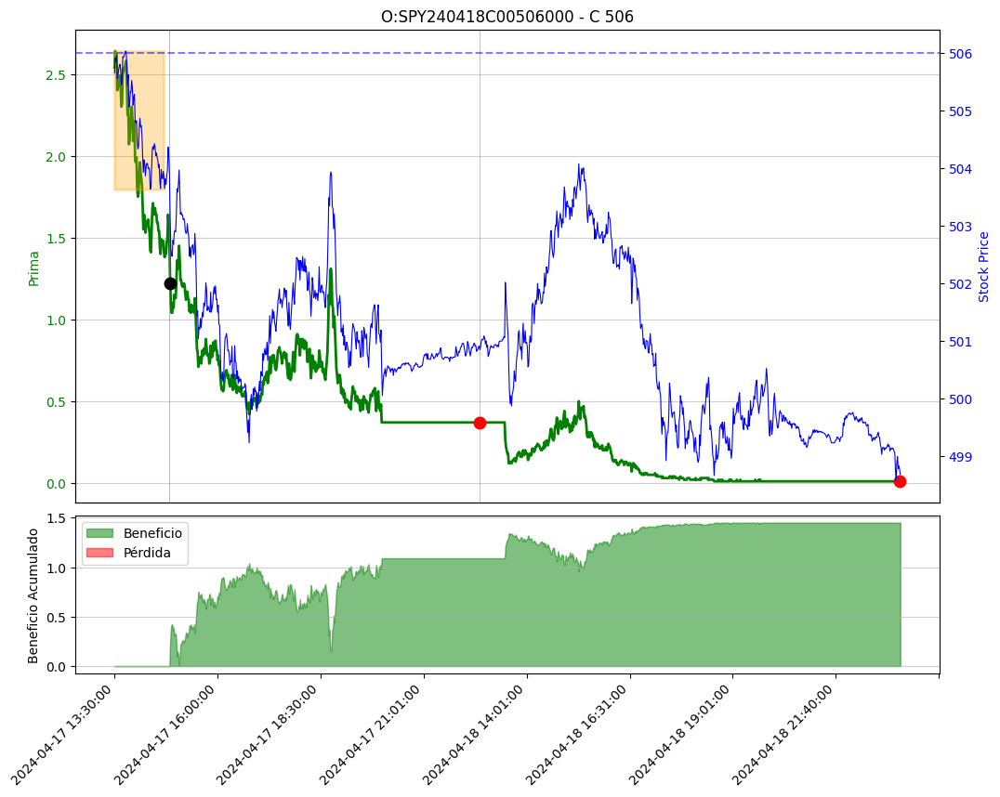

Trading Date:    2024-04-18
Expiration Date: 2024-04-19
Valor mínimo IB:     499.87
Valor máximo IB:     503.26
El SPY rompe el Máximo del IB en la fila 85 con el valor 503.47
Tenedencia Alcista-> Vender P
Vendemos el Stike 500
O:SPY240419P00500000 - P 500
Entramos en la fila: 85
Index(['v', 'vw', 'o', 'c', 'h', 'l', 't', 'n'], dtype='object')


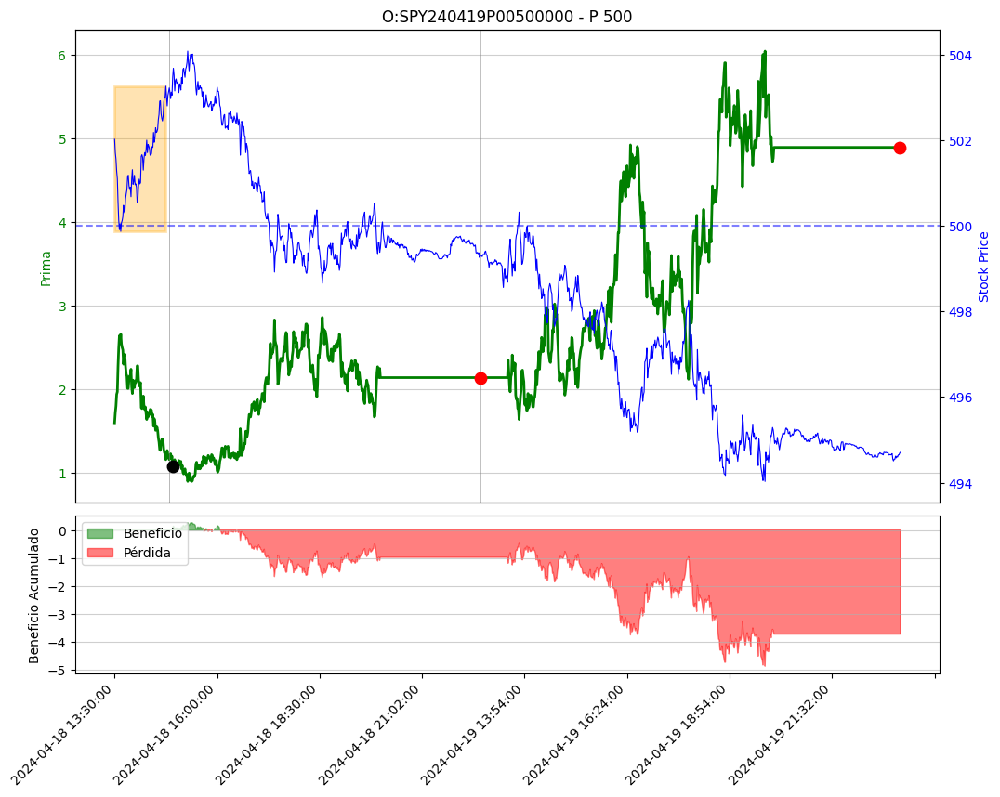

Trading Date:    2024-04-19
Expiration Date: 2024-04-22
Valor mínimo IB:     497.65
Valor máximo IB:     500.32
El SPY rompe el Mínimo del IB en la fila 118 con el valor 497.64
Vendemos el Stike 500
O:SPY240422C00500000 - C 500
Entramos en la fila: 118
Index(['v', 'vw', 'o', 'c', 'h', 'l', 't', 'n'], dtype='object')


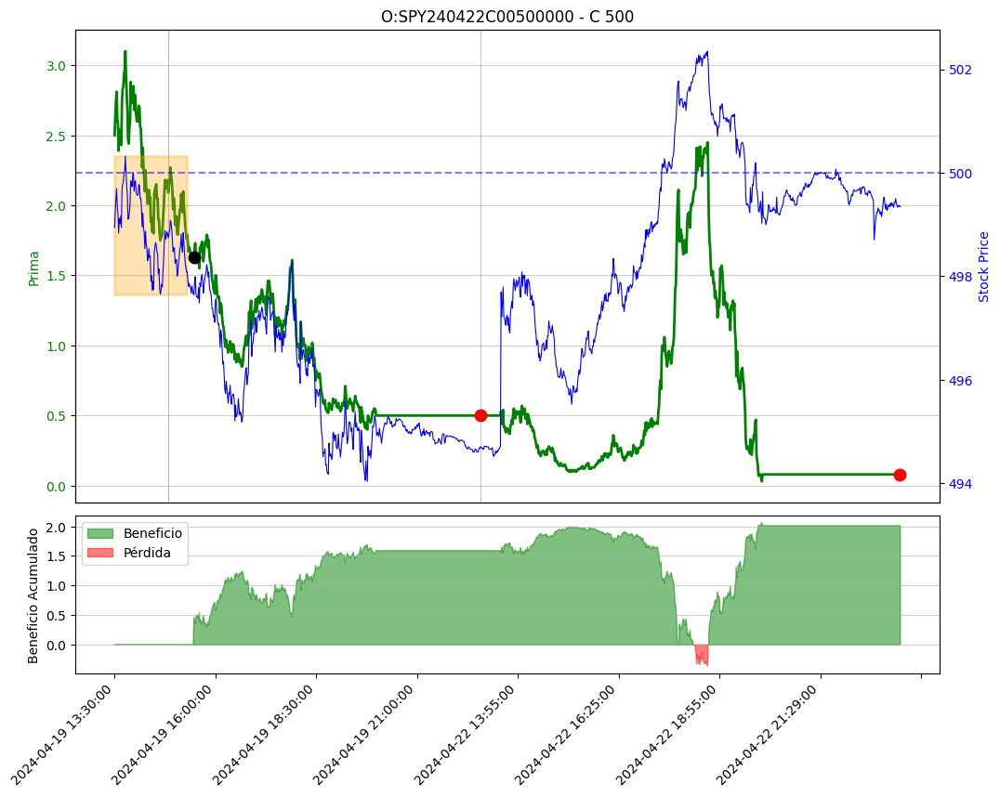

Trading Date:    2024-04-22
Expiration Date: 2024-04-23
Valor mínimo IB:     496.36
Valor máximo IB:     498.08
El SPY rompe el Mínimo del IB en la fila 82 con el valor 496.25
Vendemos el Stike 499
O:SPY240423C00499000 - C 499
Entramos en la fila: 82
Index(['v', 'vw', 'o', 'c', 'h', 'l', 't', 'n'], dtype='object')


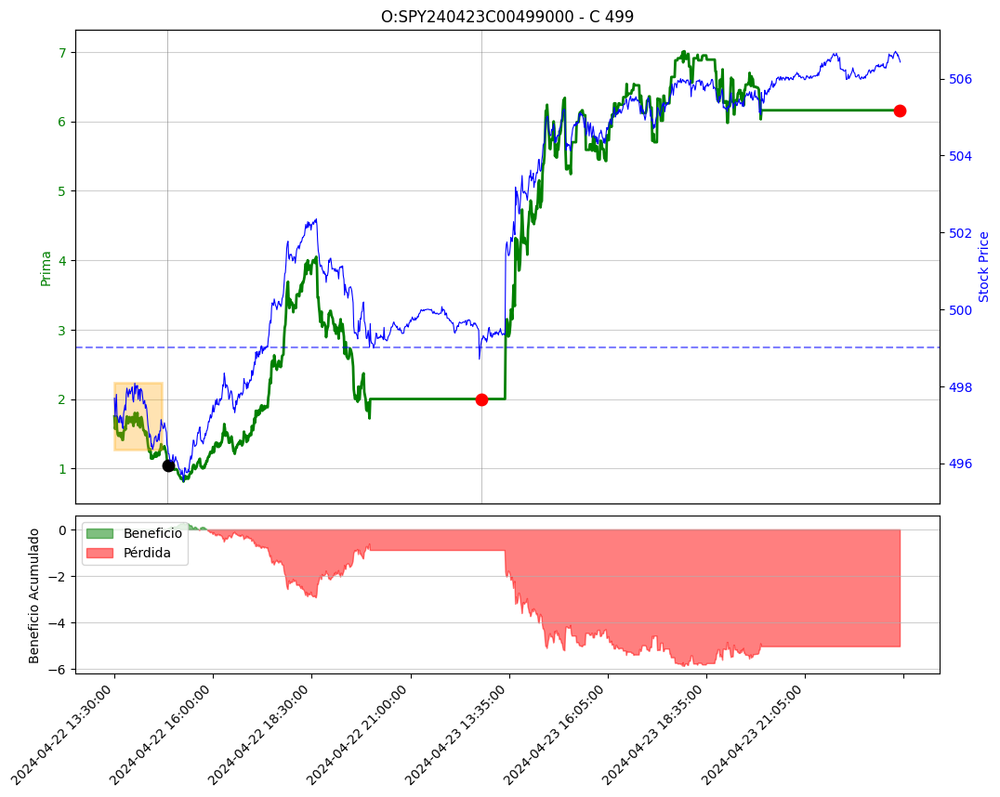

Trading Date:    2024-04-23
Expiration Date: 2024-04-24
Valor mínimo IB:     501.4
Valor máximo IB:     505.02
El SPY rompe el Máximo del IB en la fila 87 con el valor 505.16
Tenedencia Alcista-> Vender P
Vendemos el Stike 502
O:SPY240424P00502000 - P 502
Entramos en la fila: 87
Index(['v', 'vw', 'o', 'c', 'h', 'l', 't', 'n'], dtype='object')


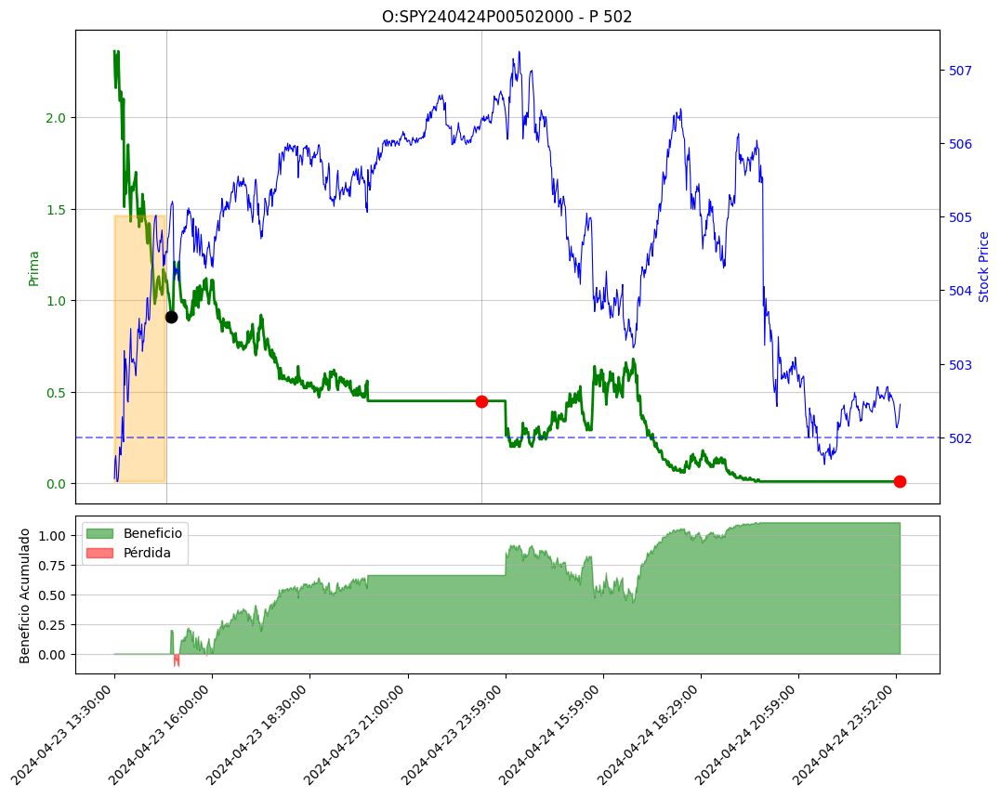

Trading Date:    2024-04-24
Expiration Date: 2024-04-25
Valor mínimo IB:     505.19
Valor máximo IB:     507.25
El SPY rompe el Mínimo del IB en la fila 81 con el valor 505.13
Vendemos el Stike 508
O:SPY240425C00508000 - C 508
Entramos en la fila: 81
Index(['v', 'vw', 'o', 'c', 'h', 'l', 't', 'n'], dtype='object')


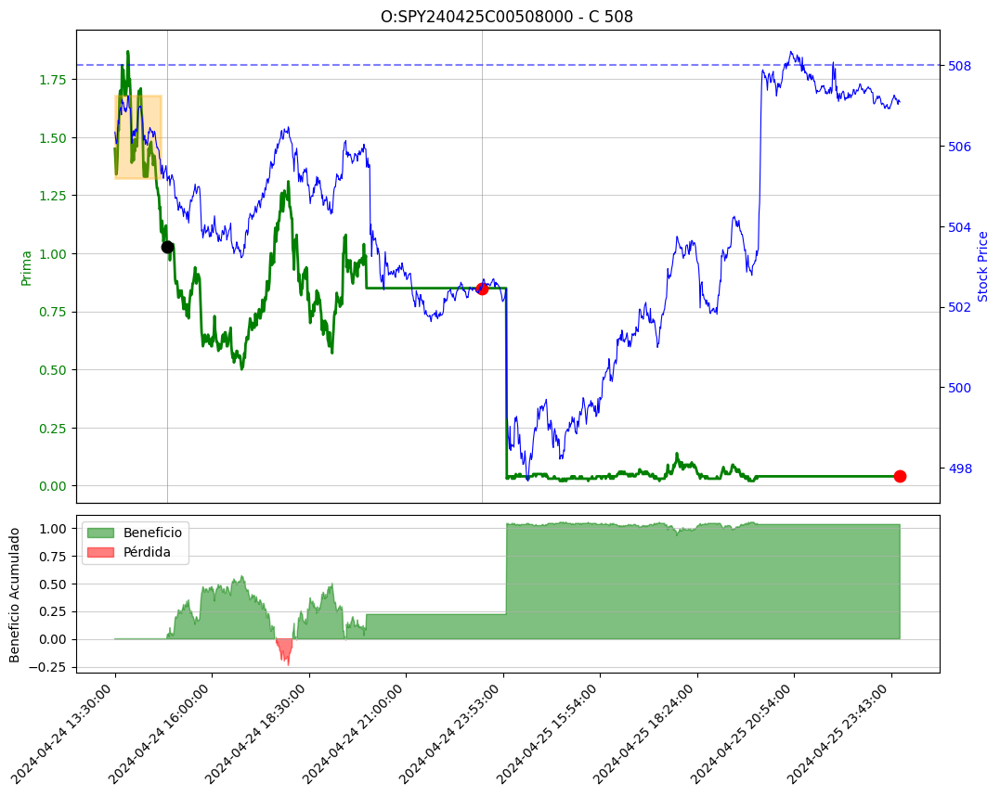

Trading Date:    2024-04-25
Expiration Date: 2024-04-26
Valor mínimo IB:     497.67
Valor máximo IB:     499.7
El SPY rompe el Máximo del IB en la fila 118 con el valor 499.74
Tenedencia Alcista-> Vender P
Vendemos el Stike 496
O:SPY240426P00496000 - P 496
Entramos en la fila: 118
Index(['v', 'vw', 'o', 'c', 'h', 'l', 't', 'n'], dtype='object')


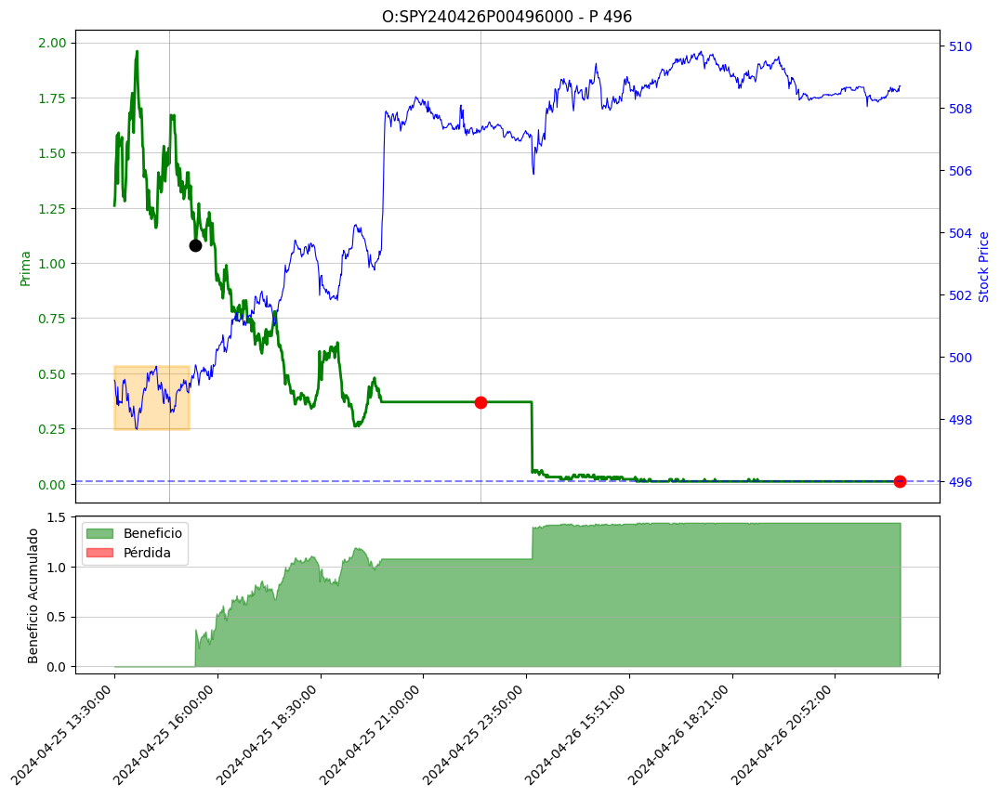

Trading Date:    2024-04-26
Expiration Date: 2024-04-29
Valor mínimo IB:     505.85
Valor máximo IB:     508.93
El SPY rompe el Máximo del IB en la fila 91 con el valor 509.08
Tenedencia Alcista-> Vender P
Vendemos el Stike 506
O:SPY240429P00506000 - P 506
Entramos en la fila: 91
Index(['v', 'vw', 'o', 'c', 'h', 'l', 't', 'n'], dtype='object')


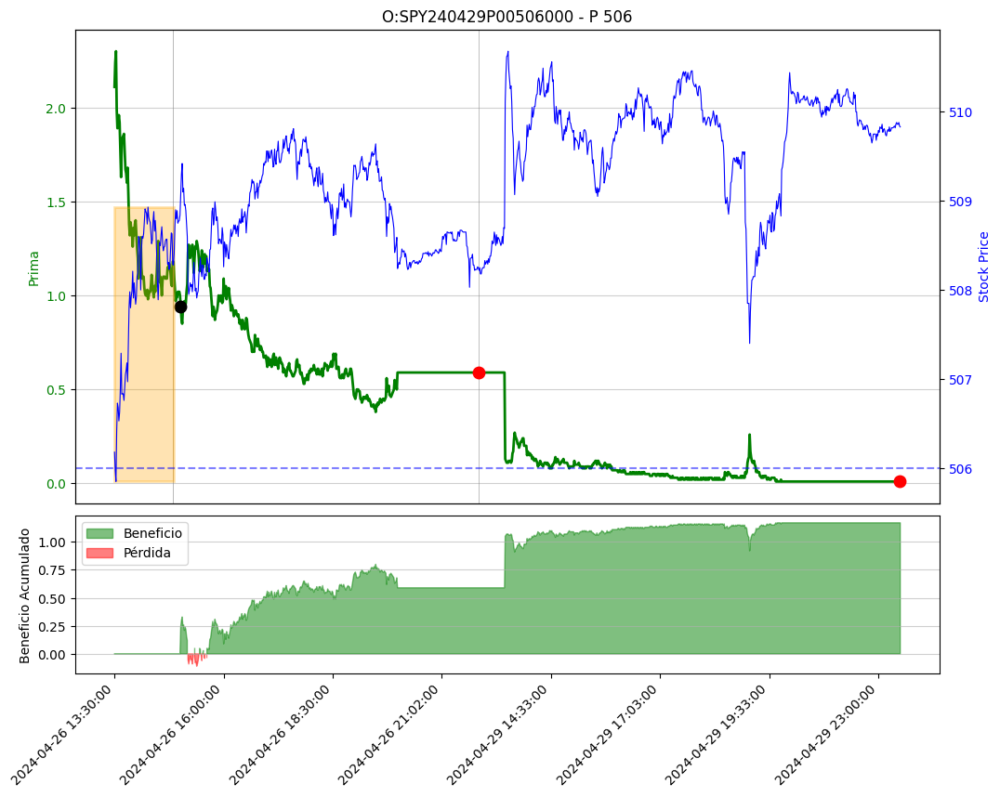

Trading Date:    2024-04-29
Expiration Date: 2024-04-30
Valor mínimo IB:     509.07
Valor máximo IB:     510.68
El SPY rompe el Mínimo del IB en la fila 127 con el valor 509.05
Vendemos el Stike 512
O:SPY240430C00512000 - C 512
Entramos en la fila: 127
Index(['v', 'vw', 'o', 'c', 'h', 'l', 't', 'n'], dtype='object')


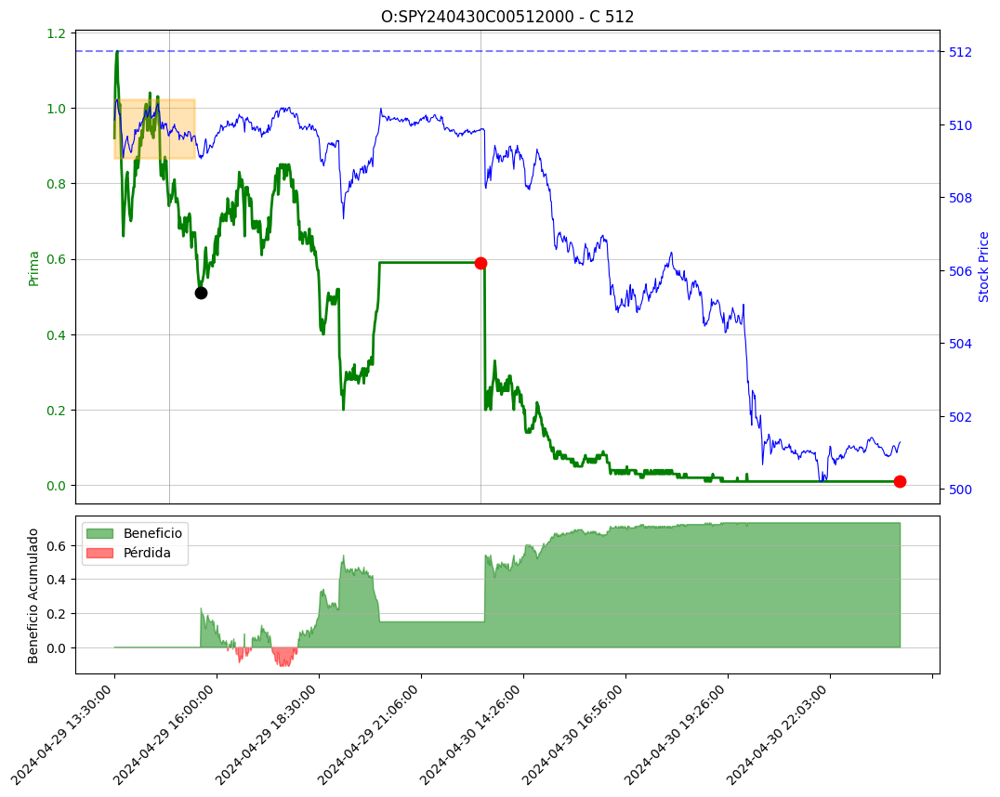

Trading Date:    2024-04-30
Expiration Date: 2024-05-01
Valor mínimo IB:     508.2
Valor máximo IB:     509.42
El SPY rompe el Mínimo del IB en la fila 94 con el valor 508.16
Vendemos el Stike 511
O:SPY240501C00511000 - C 511
Entramos en la fila: 94
Index(['v', 'vw', 'o', 'c', 'h', 'l', 't', 'n'], dtype='object')


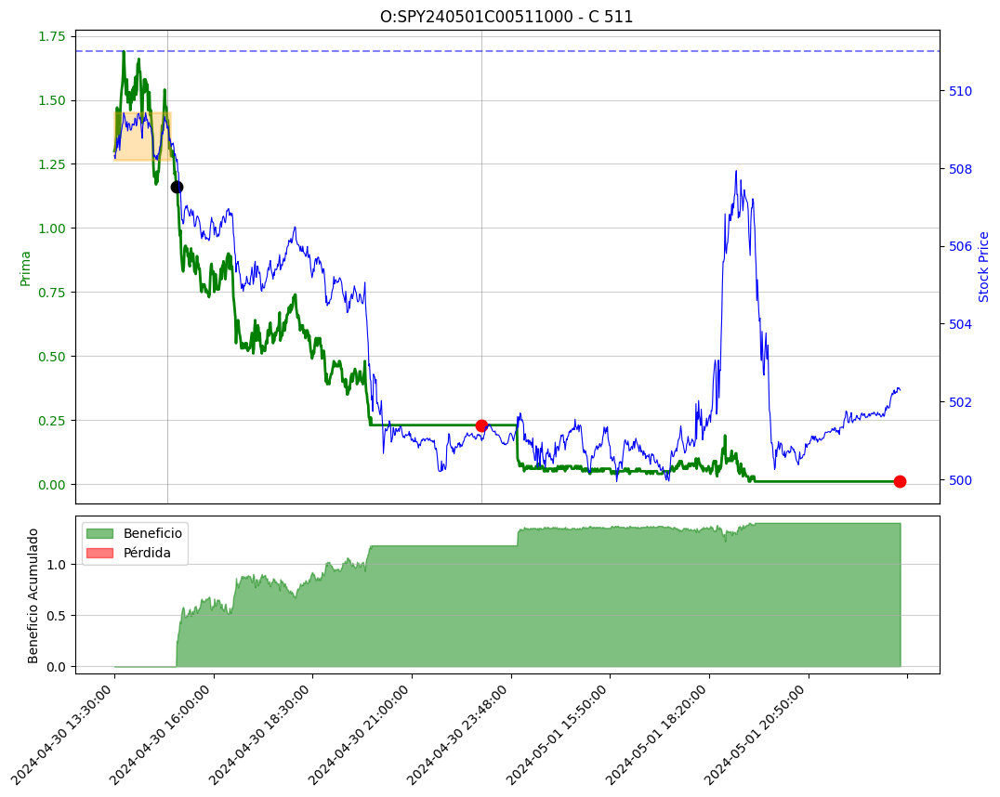

Trading Date:    2024-05-01
Expiration Date: 2024-05-02
Valor mínimo IB:     500.29
Valor máximo IB:     501.7
El SPY rompe el Mínimo del IB en la fila 107 con el valor 500.26
Vendemos el Stike 503
O:SPY240502C00503000 - C 503
Entramos en la fila: 107
Index(['v', 'vw', 'o', 'c', 'h', 'l', 't', 'n'], dtype='object')


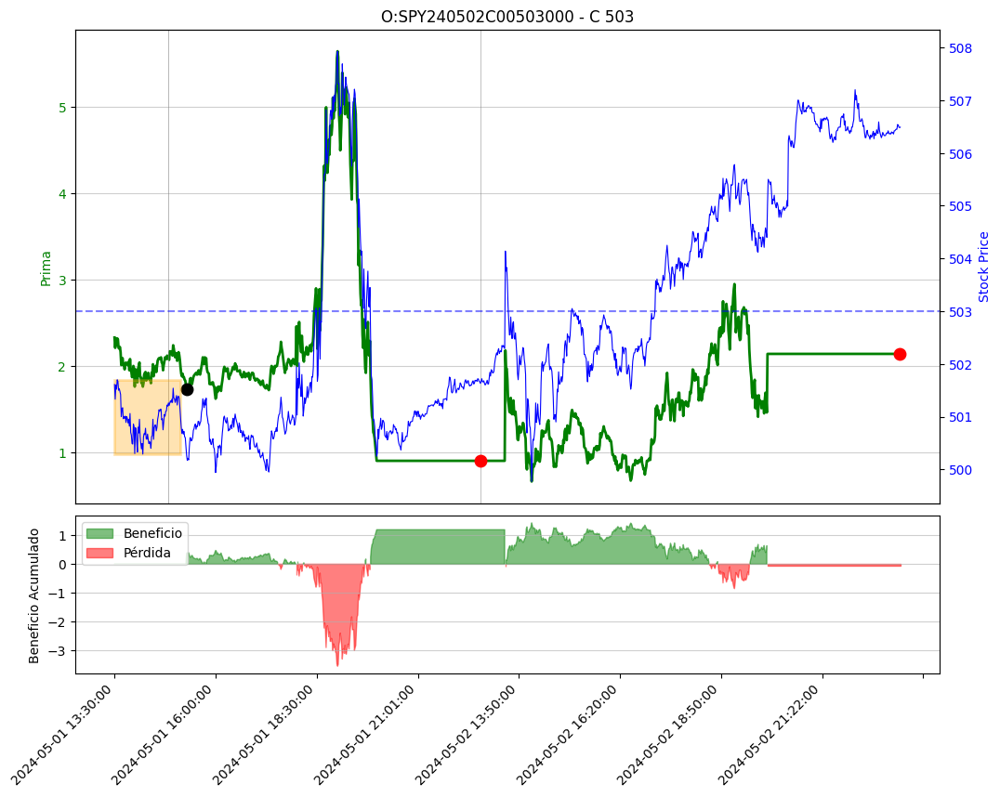

Trading Date:    2024-05-02
Expiration Date: 2024-05-03
Valor mínimo IB:     499.77
Valor máximo IB:     504.14
El SPY rompe el Máximo del IB en la fila 240 con el valor 504.25
Tenedencia Alcista-> Vender P
Vendemos el Stike 501
O:SPY240503P00501000 - P 501
Entramos en la fila: 240
Index(['v', 'vw', 'o', 'c', 'h', 'l', 't', 'n'], dtype='object')


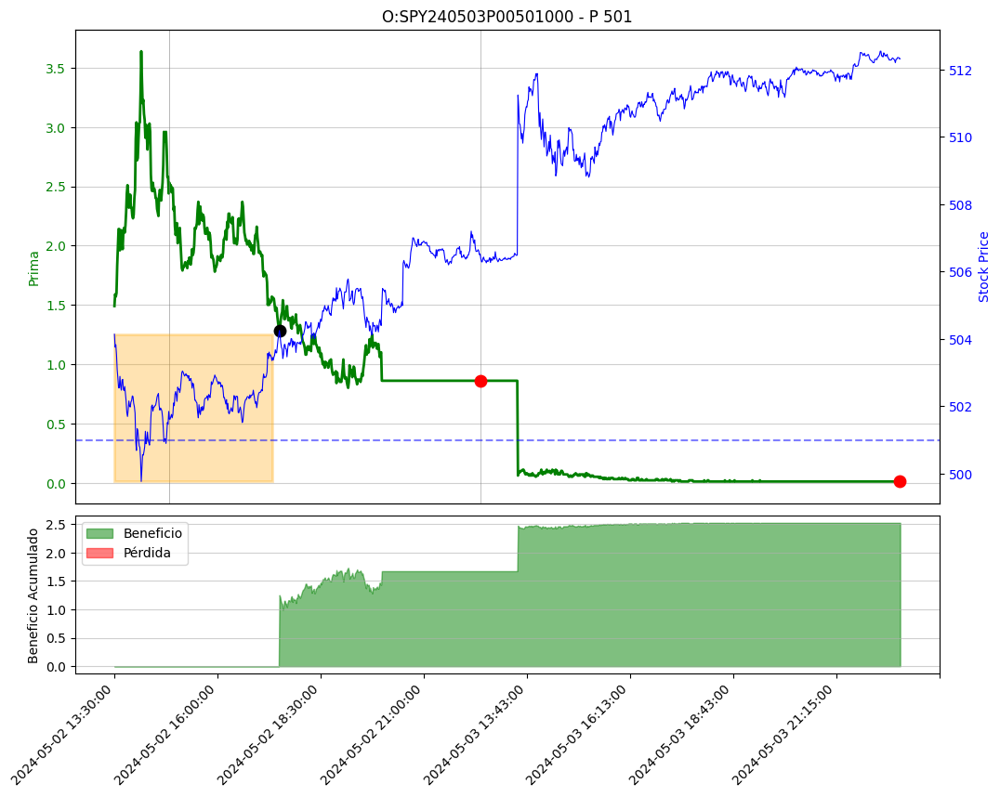

Trading Date:    2024-05-03
Expiration Date: 2024-05-06
Valor mínimo IB:     508.84
Valor máximo IB:     511.88
El SPY rompe el Mínimo del IB en la fila 103 con el valor 508.8
Vendemos el Stike 511
O:SPY240506C00511000 - C 511
Entramos en la fila: 103
Index(['v', 'vw', 'o', 'c', 'h', 'l', 't', 'n'], dtype='object')


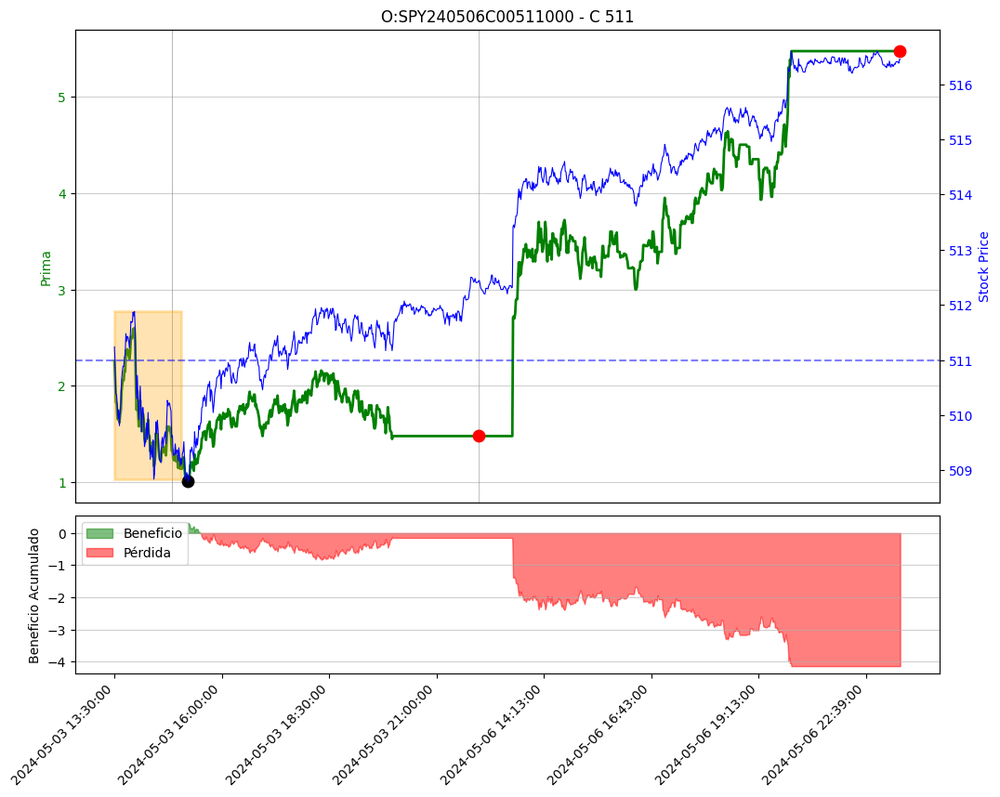

Trading Date:    2024-05-06
Expiration Date: 2024-05-07
Valor mínimo IB:     513.4
Valor máximo IB:     514.6
El SPY rompe el Máximo del IB en la fila 209 con el valor 514.68
Tenedencia Alcista-> Vender P
Vendemos el Stike 511
O:SPY240507P00511000 - P 511
Entramos en la fila: 209
Index(['v', 'vw', 'o', 'c', 'h', 'l', 't', 'n'], dtype='object')


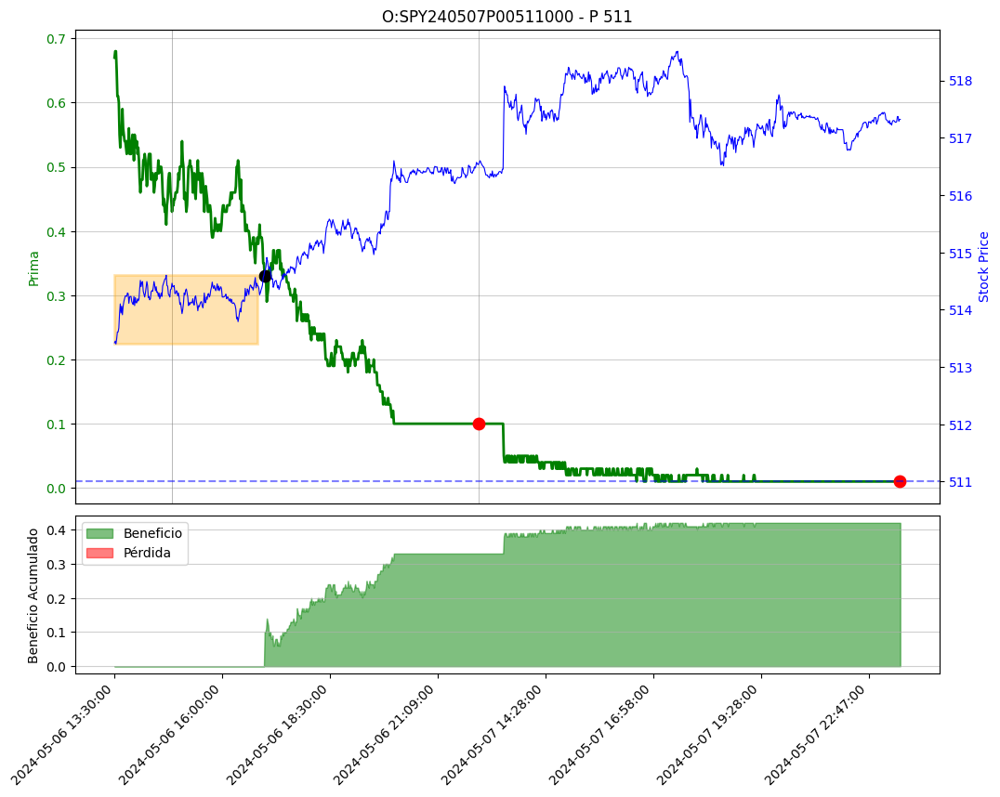

Trading Date:    2024-05-07
Expiration Date: 2024-05-08
Valor mínimo IB:     517.06
Valor máximo IB:     517.9
El SPY rompe el Máximo del IB en la fila 84 con el valor 517.95
Tenedencia Alcista-> Vender P
Vendemos el Stike 514
O:SPY240508P00514000 - P 514
Entramos en la fila: 84
Index(['v', 'vw', 'o', 'c', 'h', 'l', 't', 'n'], dtype='object')


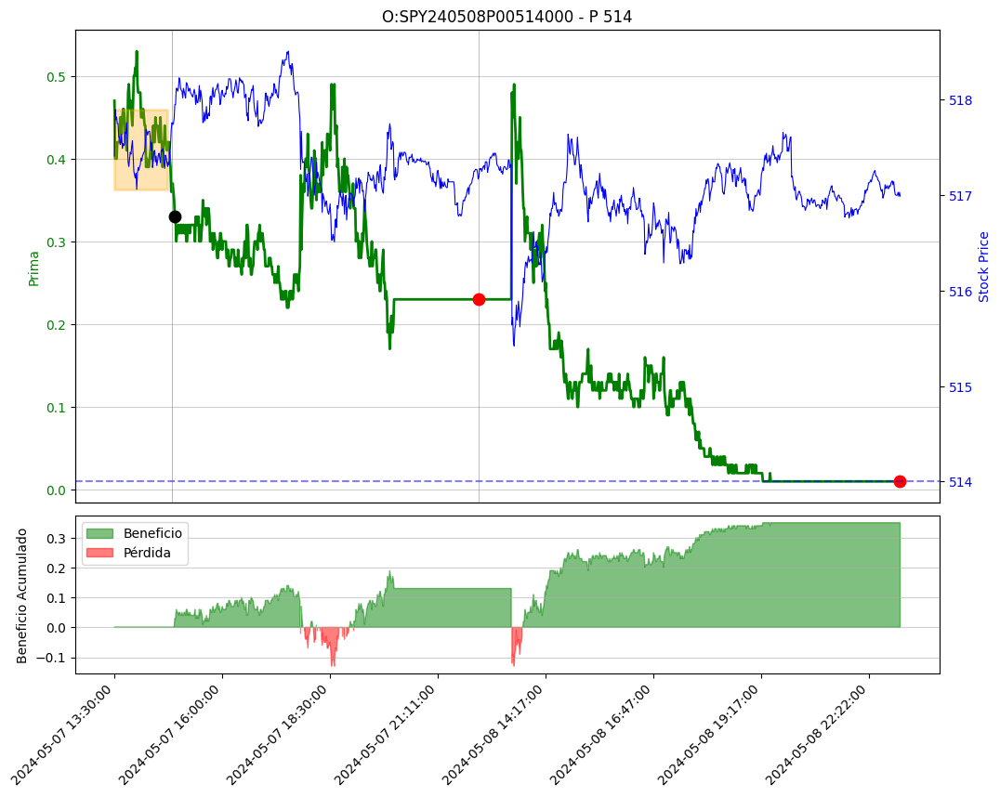

Trading Date:    2024-05-08
Expiration Date: 2024-05-09
Valor mínimo IB:     515.42
Valor máximo IB:     517.64
El SPY rompe el Máximo del IB en la fila 377 con el valor 517.66
Tenedencia Alcista-> Vender P
Vendemos el Stike 514
O:SPY240509P00514000 - P 514
Entramos en la fila: 377
Index(['v', 'vw', 'o', 'c', 'h', 'l', 't', 'n'], dtype='object')


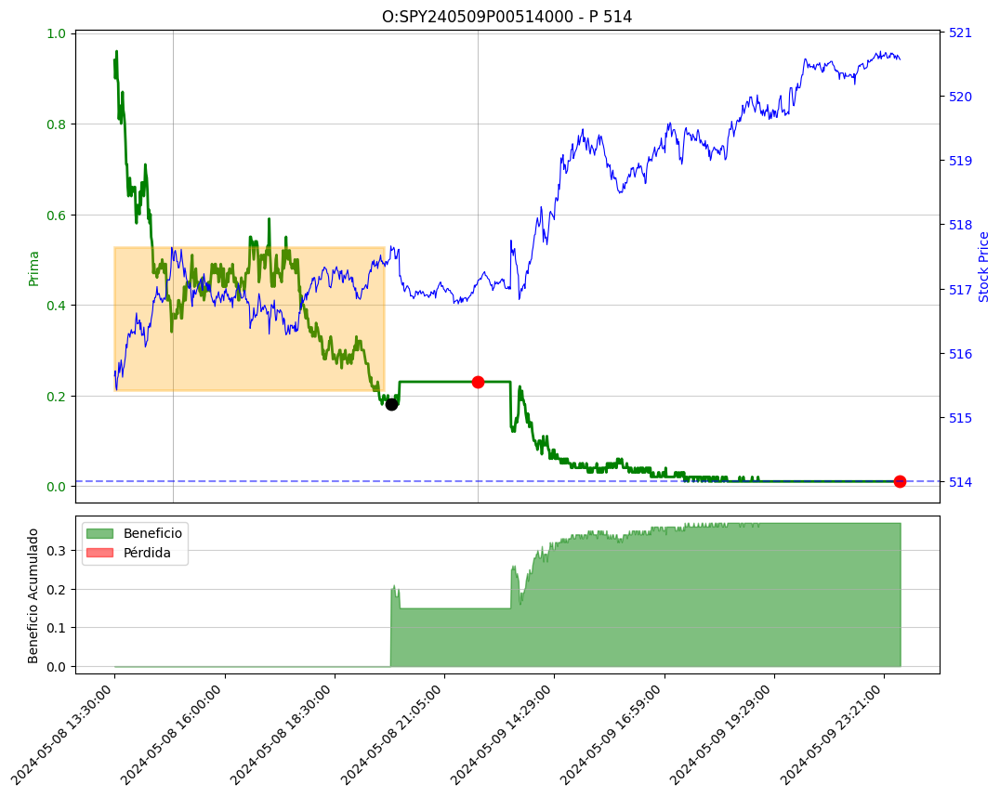

Trading Date:    2024-05-09
Expiration Date: 2024-05-10


ConnectionError: HTTPSConnectionPool(host='api.polygon.io', port=443): Max retries exceeded with url: /v2/aggs/ticker/SPY/range/1/minute/2024-05-09/2024-05-10?adjusted=true&sort=asc&apiKey=HsOX1rl8t3B1AJfl4O2uqscUp372l7EF (Caused by NewConnectionError('<urllib3.connection.HTTPSConnection object at 0x000002744F868340>: Failed to establish a new connection: [Errno 11001] getaddrinfo failed'))

In [11]:
import pandas as pd
import time

final_summary = pd.DataFrame()

for date in dates:
    df = get_stock_data_for_date(date)  # Create the dataframe with the stock SPY data
    expiration_day = next_working_day(date)  # Get the expiration day of the option
    ib_min, ib_max = find_min_max_stock_price(df)  # Find the minimum and maximum of the IB box
    print(f"Valor mínimo IB:     {ib_min}\nValor máximo IB:     {ib_max}")
    
    # Generate the option ticker and get the option type, strike entry, and entry row
    option_code, option_type, strike_entry, row = generate_ticker(df, fila, expiration_day, ib_min, ib_max)
    print(f'Entramos en la fila: {row}')
    
    # Get the option price data
    df_option = get_option_price(option_code, date, expiration_day, option_type)
    
    # Check if df_option is None or empty and handle accordingly
    if df_option is None or df_option.empty:
        print(f"Warning: No data returned for {option_code} on {date} with expiration {expiration_day}. Skipping this iteration.")
        continue  # Skip this iteration since no valid data is available for df_option
    
    try:
        # Perform the merge operation with the 'left' join to retain all rows from df
        df_option = pd.merge(df, df_option, on='timestamp', how='left')
        
        # Forward fill any missing data in the merged dataframe
        df_option.ffill(inplace=True)
        
        # Process the market entries and exits based on the merged data
        summary = entradas_y_salidas_del_mercado(df_option, row, option_type)
        
        # Append the summary to the final_summary dataframe
        final_summary = final_summary.append(summary, ignore_index=True)
        
        # Plot the option chart
        plot_option_chart(df_option, fila, strike_entry, option_type, option_code, ib_min, ib_max, row)
    
    except Exception as e:
        print(f"An error occurred during merging or processing: {e}. Skipping this iteration.")
    
    # Pause for 35 seconds to avoid hitting API limits
    time.sleep(35)

In [ ]:
final_summary

In [ ]:
timestamp = datetime.now().strftime('%Y%m%d_%H%M%S')
filename = f'summary_{timestamp}.csv'
final_summary.to_csv(filename, index=False)

SUMARIO

In [ ]:
print("SUMMARIO:\n")
total_wins = final_summary[final_summary['win_lose'] == 'win'].shape[0]
total_losses = final_summary[final_summary['win_lose'] == 'lose'].shape[0]
total_trades = final_summary.shape[0]
percentage_wins = (total_wins / total_trades) * 100
percentage_losses = (total_losses / total_trades) * 100
average_win = final_summary[final_summary['win_lose'] == 'win']['profit_end'].mean()
average_loss = final_summary[final_summary['win_lose'] == 'lose']['profit_end'].mean()
expectancy = ((percentage_wins * average_win) - (percentage_losses * average_loss))/100
print(f"Percentage of Wins:   {percentage_wins:.2f}%")
print(f"Percentage of Losses: {percentage_losses:.2f}%")
print(f"Average Win:            {average_win:.2f}")
print(f"Average Loss:          {average_loss:.2f}")
print(f"Expectancy:             {expectancy:.2f}\n")
profit_overn_avg = round(final_summary['profit_overn'].mean(), 2)
profit_overn_max = round(final_summary['profit_overn'].max(), 2)
profit_overn_min = round(final_summary['profit_overn'].min(), 2)
profit_overn_sum = round(final_summary['profit_overn'].sum(), 2)
profit_end_avg = round(final_summary['profit_end'].mean(), 2)
profit_end_max = round(final_summary['profit_end'].max(), 2)
profit_end_min = round(final_summary['profit_end'].min(), 2)
profit_end_sum = round(final_summary['profit_end'].sum(), 2)
return_percent_avg = round(final_summary['return_%'].mean(), 2)
return_percent_max = round(final_summary['return_%'].max(), 2)
return_percent_min = round(final_summary['return_%'].min(), 2)
return_percent_sum = round(final_summary['return_%'].sum(), 2)
mae_avg = round(final_summary['mae'].mean(), 2)
mae_max = round(final_summary['mae'].max(), 2)
mae_min = round(final_summary['mae'].min(), 2)
mae_sum = round(final_summary['mae'].sum(), 2)

print("Profit Overnight:")
print(f"Average: {profit_overn_avg}")
print(f"Min: {profit_overn_min}")
print(f"Max: {profit_overn_max}")
print(f"Total Sum: {profit_overn_sum}\n")
print("Profit End:")
print(f"Average: {profit_end_avg}")
print(f"Min: {profit_end_min}")
print(f"Max: {profit_end_max}")
print(f"Total Sum: {profit_end_sum}\n")
print("Return %:")
print(f"Average: {return_percent_avg}")
print(f"Min: {return_percent_min}")
print(f"Max: {return_percent_max}")
print(f"Min: {return_percent_min}")
print(f"Total Sum: {return_percent_sum}\n")
print("MAE:")
print(f"Average: {mae_avg}")
print(f"Max: {mae_max}")
print(f"Min: {mae_min}")
print(f"Total Sum: {mae_sum}")

In [ ]:
total_wins = final_summary[final_summary['win_lose'] == 'win'].shape[0]
total_losses = final_summary[final_summary['win_lose'] == 'lose'].shape[0]
total_trades = final_summary.shape[0]
percentage_wins = (total_wins / total_trades) * 100
percentage_losses = (total_losses / total_trades) * 100
average_win = final_summary[final_summary['win_lose'] == 'win']['profit_end'].mean()
average_loss = final_summary[final_summary['win_lose'] == 'lose']['profit_end'].mean()
expectancy = ((percentage_wins * average_win) - (percentage_losses * average_loss))/100
print(f"Percentage of Wins:   {percentage_wins:.2f}%")
print(f"Percentage of Losses: {percentage_losses:.2f}%")
print(f"Average Win:            {average_win:.2f}")
print(f"Average Loss:          {average_loss:.2f}")
print(f"Expectancy:             {expectancy:.2f}")

In [ ]:
plt.figure(figsize=(10, 6))
sns.histplot(final_summary['profit_end'], color='green',bins=30)
plt.axvline(x=0, color='grey', alpha=0.6, linewidth=0.5)
plt.title('Retorno en $ del Premium')
plt.xlabel('Retorno en $ ')
plt.ylabel('Frequency')
plt.show()

In [ ]:
plt.figure(figsize=(10, 6))
sns.histplot(final_summary['profit_overn'],color='green', bins=25)
plt.axvline(x=0, color='grey', alpha=0.8, linewidth=0.7)
plt.title('Profit Overnight')
plt.xlabel('Prima')
plt.ylabel('Frequency')
plt.show()

In [ ]:
plt.figure(figsize=(10, 6))
sns.histplot(final_summary['return_%'], bins=6)
plt.axvline(x=0, color='grey', alpha=0.8, linewidth=0.7)
plt.title('Profit Overnight')
plt.xlabel('Prima')
plt.ylabel('Frequency')
plt.show()

In [ ]:
plt.figure(figsize=(10, 6))
sns.histplot(final_summary['mae'], color ='orange',bins=25)
plt.axvline(x=0, color='grey', alpha=0.8, linewidth=0.7)
plt.title('Maximum Adverse Excursion - MAE')
plt.xlabel('MAE - Prima')
plt.ylabel('Frequency')
plt.show()

In [ ]:
plt.figure(figsize=(10, 6))
sns.barplot(
    x=final_summary['win_lose'], 
    y=final_summary['profit_end'],
    palette=(final_summary['profit_end'] > 0).map({True: 'green', False: 'red'})
)
plt.axhline(y=0, color='grey', alpha=0.9, linewidth=0.9)  # Horizontal line at 0
plt.title('Profit End by Win/Lose')
plt.xlabel('Win/Lose')
plt.ylabel('Profit End')
plt.show()

In [ ]:
plt.figure(figsize=(14, 7))
sns.barplot(
    x=final_summary.index,  # Use the index for the x-axis to represent all rows
    y=final_summary['profit_end'],
    hue=final_summary['win_lose'],  # Color based on win/lose
    palette={'win': 'green', 'lose': 'red'}
)
plt.axhline(y=0, color='grey', alpha=0.9, linewidth=0.9)  # Horizontal line at 0
plt.axhline(y=-1.8, color='orange', alpha=0.9, linestyle='--', linewidth=2)
plt.title('Entradas individuales')
plt.xlabel('Row Index')
plt.ylabel('Profit End')
plt.show()

In [ ]:
plt.figure(figsize=(14, 7))
sns.barplot(
    x=final_summary.index,  # Use the index for the x-axis to represent all rows
    y=final_summary['price_overn'],
    hue=final_summary['win_lose'],  # Color based on win/lose
    palette={'win': 'green', 'lose': 'red'}
)
plt.axhline(y=0, color='grey', alpha=0.9, linewidth=0.9)  # Horizontal line at 0
plt.axhline(y=1.5, color='orange', alpha=0.9, linestyle='--', linewidth=2)
plt.title('Entradas individuales')
plt.xlabel('Row Index')
plt.ylabel('Profit End')
plt.show()

In [ ]:
plt.figure(figsize=(14, 7))
sns.barplot(
    x=final_summary.index,  # Use the index for the x-axis to represent all rows
    y=final_summary['mae'],
    hue=final_summary['win_lose'],  # Color based on win/lose
    palette={'win': 'green', 'lose': 'red'}
)
plt.axhline(y=0, color='grey', alpha=0.9, linewidth=0.9)  # Horizontal line at 0
plt.axhline(y=-1.8, color='orange', alpha=0.9, linestyle='--', linewidth=2)
plt.title('Maximum Adverse Excursion - color indicates win or lost at end')
plt.xlabel('Row Index')
plt.ylabel('Profit End')
plt.show()

In [ ]:
filtered_summary = final_summary[final_summary['profit_end'] <= 0]
contador = len(filtered_summary)
print(f'La cantidad de entradas perdedoras es {contador}')
filtered_summary

In [ ]:
DFGSDGFSDG

In [ ]:
final_summary = pd.DataFrame()

for date in dates:
    df = get_stock_data_for_date(date)  # Create the dataframe with the stock SPY data
    expiration_day = next_working_day(date)  # Get the expiration day of the option
    ib_min, ib_max = find_min_max_stock_price(df)  # Find the minimum and maximum of the IB box
    print(f"Valor mínimo IB:     {ib_min}\nValor máximo IB:     {ib_max}")
    
    # Generate the option ticker and get the option type, strike entry, and entry row
    option_code, option_type, strike_entry, row = generate_ticker(df, fila, expiration_day, ib_min, ib_max)
    print(f'Entramos en la fila: {row}')
    
    # Get the option price data
    df_option = get_option_price(option_code, date, expiration_day, option_type)
    
    # Check if df_option is None or empty and handle accordingly
    if df_option is None or df_option.empty:
        print(f"Warning: No data returned for {option_code} on {date} with expiration {expiration_day}")
        df_option = pd.DataFrame(columns=['timestamp'])  # Create an empty DataFrame with a timestamp column to prevent errors
    
    # Perform the merge operation with the 'left' join to retain all rows from df
    df_option = pd.merge(df, df_option, on='timestamp', how='left')
    
    # Forward fill any missing data in the merged dataframe
    df_option.ffill(inplace=True)
    
    # Process the market entries and exits based on the merged data
    summary = entradas_y_salidas_del_mercado(df_option, row, option_type)
    
    # Append the summary to the final_summary dataframe
    final_summary = final_summary.append(summary, ignore_index=True)
    
    # Plot the option chart
    plot_option_chart(df_option, fila, strike_entry, option_type, option_code, ib_min, ib_max, row)
    
    # Pause for 35 seconds to avoid hitting API limits
    time.sleep(35)